# PV temporal output shaping - visualization

## Instructions
* Make sure to update the ``revmpath``, ``datapath``, ``apikeys``, and ``nsrdbparams`` variables in ``settings.py``. This notebook makes extensive use of the ``plots.py`` module within ``pvvm``.

In [1]:
### Standard imports
import pandas as pd
import numpy as np
import os, sys, site, pickle, json, shapely, zipfile
import matplotlib.pyplot as plt
import matplotlib as mpl
from glob import glob
from tqdm import tqdm, trange, tqdm_notebook, tnrange
import urllib, requests
import geopandas as gpd
import pvlib
from IPython.display import display, HTML

from matplotlib.ticker import (
    AutoMinorLocator, MultipleLocator, AutoLocator, PercentFormatter)
pd.options.display.max_columns = 200
pd.options.display.max_rows = 15
%config InlineBackend.figure_format = 'retina'

### Import the package
### (Note: scriptpath should lead to folder above 'pvvm' folder)
# scriptpath = os.path.expanduser('~/path/to/folder/above/pvvm/')
scriptpath = os.path.expanduser('~/Dropbox/MITEI/Projects/REValueMap/Package/pvtos_FINAL/')
site.addsitedir(scriptpath)
import pvvm

revmpath = pvvm.settings.revmpath
datapath = pvvm.settings.datapath
pvvm.plots.plotparams()

# Import results

In [2]:
### Load TMY-optimized orientations
dfin = pd.read_csv(revmpath+'out/results_pvtos_tmyopt_public.csv.gz')
for col in ['ISOwecc','ISO:Node']:
    dfin[col] = dfin[col].astype('category')
dfin['yearsun'] = dfin['yearsun'].map(lambda x: 'tmy' if x == 'tmy' else int(float(x))).copy()
### Drop the Canada nodes
dfin = dfin.loc[~(dfin['ISO:Node'].isin(['MISO:MHEB','MISO:SPC']))].reset_index(drop=True)
    
### Load final revenue and CF results calculated under historical irradiance
dfin_optorient_histsun = pd.read_csv(revmpath+'out/results_pvtos_histsun_public.csv.gz')
for col in ['ISOwecc','ISO:Node']:
    dfin_optorient_histsun[col] = dfin_optorient_histsun[col].astype('category')
dfin_optorient_histsun['yearsun'] = dfin_optorient_histsun['yearsun'].map(
    lambda x: 'tmy' if x == 'tmy' else int(float(x))).copy()
### Drop the Canada nodes
dfin_optorient_histsun = dfin_optorient_histsun.loc[
    ~(dfin_optorient_histsun['ISO:Node'].isin(['MISO:MHEB','MISO:SPC']))].reset_index(drop=True)

/Users/patrickbrown/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (12,38,39,41,45,46,51,55,56,57,61) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
/Users/patrickbrown/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (2,3,6,31) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


### Shared data and figure properties

In [3]:
isos = ['CAISO','ERCOT','MISO','PJM','NYISO','ISONE']
colors = dict(zip(isos, ['C{}'.format(i) for i in range(len(isos))]))
alpha = 0.2
years = list(range(2010,2018))
mc = {'tmy':'k','da':'C0', 'rt':'C3'}
bootstrap = 5 ### Use 5 for testing and 5000 for publication
figheight = 12

innerband = ['25%','75%']
outerband = ['2.5%','97.5%']
percentiles = innerband + ['50%'] + outerband
fractions = [float(pct[:pct.find('%')])*.01 for pct in percentiles]
labels = {
    'outer': 'central {:.0f}%'.format((fractions[-1]-fractions[-2])*100),
    'inner': 'central {:.0f}%'.format((fractions[1]-fractions[0])*100),
    'median': 'median',
    'min': 'min & max',
    'max': '_nolabel_',
    'minmax': 'all nodes',
    'minmax': 'min & max',
}

# Extract and calculate quantities of interest

In [4]:
################# All together
######### Assemble plot data
mergecols = ['ISOwecc','ISO:Node','yearlmp']
###### Fixed DA: optrev_rev vs optcf_rev; orientations
program = 'PVvalueOptV4'
systemtype = 'fixed'
yearsun = 'tmy'

###### Must-run
pricecutoff = 'no'
dfplot = dfin.loc[
    (dfin.market == 'da')
    & (dfin.yearlmp.isin(years))
    & (dfin.program == program)
    & (dfin.systemtype == systemtype)
    & (dfin.yearsun == yearsun)
    & (dfin.pricecutoff == pricecutoff)
][mergecols+['OptRev_Rev/OptCF_Rev','OptRev_Azimuth','OptRev_Tilt',
             'OptRev_CF/OptCF_CF', 'OptCF_Azimuth','OptCF_Tilt',
             'OptCF_Rev','OptRev_Rev',
            ]].copy()

dfrt = dfin.loc[
    (dfin.market == 'rt')
    & (dfin.yearlmp.isin(years))
    & (dfin.program == program)
    & (dfin.systemtype == systemtype)
    & (dfin.yearsun == yearsun)
    & (dfin.pricecutoff == pricecutoff)
][mergecols+['OptRev_Rev/OptCF_Rev','OptRev_Azimuth','OptRev_Tilt',
             'OptRev_CF/OptCF_CF', 'OptCF_Azimuth','OptCF_Tilt',
             'OptCF_Rev','OptRev_Rev',
            ]].copy()

dfplot = dfplot.merge(dfrt, on=mergecols, suffixes=('(da)','(rt)'), how='outer')

###### Curtailable
pricecutoff = '0'
dfcurtail = dfin.loc[
    (dfin.market == 'da')
    & (dfin.yearlmp.isin(years))
    & (dfin.program == program)
    & (dfin.systemtype == systemtype)
    & (dfin.yearsun == yearsun)
    & (dfin.pricecutoff == pricecutoff)
][mergecols+['OptRev_Azimuth','OptRev_Tilt',
             'OptCF_Azimuth','OptCF_Tilt',
             'OptCF_Rev','OptRev_Rev',
            ]].copy()

dfrt = dfin.loc[
    (dfin.market == 'rt')
    & (dfin.yearlmp.isin(years))
    & (dfin.program == program)
    & (dfin.systemtype == systemtype)
    & (dfin.yearsun == yearsun)
    & (dfin.pricecutoff == pricecutoff)
][mergecols+['OptRev_Azimuth','OptRev_Tilt',
             'OptCF_Azimuth','OptCF_Tilt',
             'OptCF_Rev','OptRev_Rev',
            ]].copy()

dfcurtail = dfcurtail.merge(dfrt, on=mergecols, suffixes=('(da)','(rt)'))

dfplot = dfplot.merge(dfcurtail, on=mergecols, suffixes=('(mustrun)','(curtail)'))

In [5]:
###### Track, DA and RT: Rev_curtail/Rev_mustrun

program = 'PVvalueV8'
pricecutoff = '0'
systemtype = 'track'

##########
### Ratios
datum = 'Rev_curtail/Rev_mustrun({})'.format(systemtype)
for market in ['da','rt']:
    dfmerge = dfin.loc[
        (dfin.market == market)
        & (dfin.yearlmp.isin(years))
        & (dfin.program == program)
        & (dfin.systemtype == systemtype)
        & (dfin.yearsun == dfin.yearlmp)
        & (dfin.Product == 'lmp')
    ].copy()
    ### Get ratio
    dfmerge[datum+'({})'.format(market)] = (
        dfmerge['Revenue_dispatched'] / dfmerge['Revenue'])
    ### Merge with rest of plot data
    dfplot = dfplot.merge(
        dfmerge[mergecols+[datum+'({})'.format(market)]], 
        on=mergecols, how='outer')

datum = 'CF_curtail/CF_mustrun({})'.format(systemtype)
for market in ['da','rt']:
    dfmerge = dfin.loc[
        (dfin.market == market)
        & (dfin.yearlmp.isin(years))
        & (dfin.program == program)
        & (dfin.systemtype == systemtype)
        & (dfin.yearsun == dfin.yearlmp)
        & (dfin.Product == 'lmp')
    ].copy()
    ### Get ratio
    dfmerge[datum+'({})'.format(market)] = (
        dfmerge['CapacityFactor_dispatched'] / dfmerge['CapacityFactor'])
    ### Merge with rest of plot data
    dfplot = dfplot.merge(
        dfmerge[mergecols+[datum+'({})'.format(market)]], 
        on=mergecols, how='outer')

###############
### Differences
datum = 'Rev_curtail-Rev_mustrun({})'.format(systemtype)
for market in ['da','rt']:
    dfmerge = dfin.loc[
        (dfin.market == market)
        & (dfin.yearlmp.isin(years))
        & (dfin.program == program)
        & (dfin.systemtype == systemtype)
        & (dfin.yearsun == dfin.yearlmp)
        & (dfin.Product == 'lmp')
    ].copy()
    ### Get ratio
    dfmerge[datum+'({})'.format(market)] = (
        dfmerge['Revenue_dispatched'] - dfmerge['Revenue'])
    ### Merge with rest of plot data
    dfplot = dfplot.merge(
        dfmerge[mergecols+[datum+'({})'.format(market)]], 
        on=mergecols, how='outer')

datum = 'CF_curtail-CF_mustrun({})'.format(systemtype)
for market in ['da','rt']:
    dfmerge = dfin.loc[
        (dfin.market == market)
        & (dfin.yearlmp.isin(years))
        & (dfin.program == program)
        & (dfin.systemtype == systemtype)
        & (dfin.yearsun == dfin.yearlmp)
        & (dfin.Product == 'lmp')
    ].copy()
    ### Get ratio
    dfmerge[datum+'({})'.format(market)] = (
        dfmerge['CapacityFactor_dispatched'] - dfmerge['CapacityFactor'])
    ### Merge with rest of plot data
    dfplot = dfplot.merge(
        dfmerge[mergecols+[datum+'({})'.format(market)]], 
        on=mergecols, how='outer')
    
# dfplot = dfplot.dropna(thresh=10).copy()

In [6]:
###############################
######### Historical irradiance
data = ['Revenue','CapacityFactor','ValueAverage','ValueFactor',
        'Revenue_dispatched','CapacityFactor_dispatched',
        'ValueAverage_dispatched','ValueFactor_dispatched',]
dicthist = {}
for market in ['da','rt']:
    ############ Revenue and CF ratios, fixed-tilt 
    ###### Must-run
    df = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.systemtype == 'fixed')
        & (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.mod0 == 'optcf')
        & (dfin_optorient_histsun.mod1 == '0'),
        ['ISO:Node','yearlmp']+data,
    ].sort_values(['yearlmp','ISO:Node'])
    df.index = df[['ISO:Node','yearlmp']]
    for datum in ['Revenue','CapacityFactor','ValueAverage','ValueFactor']:
        dicthist['{}_hist_optcf_f({})(mustrun)'.format(datum,market)] = df[datum]

    df = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.systemtype == 'fixed')
        & (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.mod0 == 'optrev')
        & (dfin_optorient_histsun.mod1 == '0'),
        ['ISO:Node','yearlmp']+data,
    ].sort_values(['yearlmp','ISO:Node'])
    df.index = df[['ISO:Node','yearlmp']]
    for datum in ['Revenue','CapacityFactor','ValueAverage','ValueFactor']:
        dicthist['{}_hist_optrev_f({})(mustrun)'.format(datum,market)] = df[datum]
        
    ###### Curtailable
    df = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.systemtype == 'fixed')
        & (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.mod0 == 'optcf')
        & (dfin_optorient_histsun.mod1 == 'opt0cutoff'),
        ['ISO:Node','yearlmp']+data,
    ].sort_values(['yearlmp','ISO:Node'])
    df.index = df[['ISO:Node','yearlmp']]
    for datum in ['Revenue_dispatched','CapacityFactor_dispatched',
                  'ValueAverage_dispatched','ValueFactor_dispatched']:
        dicthist['{}_hist_optcf_f({})(curtail)'.format(datum,market)] = df[datum]

    df = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.systemtype == 'fixed')
        & (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.mod0 == 'optrev')
        & (dfin_optorient_histsun.mod1 == 'opt0cutoff'),
        ['ISO:Node','yearlmp']+data,
    ].sort_values(['yearlmp','ISO:Node'])
    df.index = df[['ISO:Node','yearlmp']]
    for datum in ['Revenue_dispatched','CapacityFactor_dispatched',
                  'ValueAverage_dispatched','ValueFactor_dispatched']:
        dicthist['{}_hist_optrev_f({})(curtail)'.format(datum,market)] = df[datum]

############ Tracking vs fixed CFopt, DA, must-run
######### must-run
for market in ['da', 'rt']:
    dftop = dfin.loc[
        (dfin.market == market)
        & (dfin.yearlmp.isin(years))
        & (dfin.program == 'PVvalueV8')
        & (dfin.systemtype == 'track')
        & (dfin.yearsun == dfin.yearlmp)
        & (dfin.Product == 'lmp')
    ].sort_values(['yearlmp','ISO:Node']).copy()
    dftop.index = dftop[['ISO:Node','yearlmp']]

    dfbot = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.systemtype == 'fixed')
        & (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.mod0 == 'optcf')#,
        & (dfin_optorient_histsun.mod1 == '0')
    #     ['ISO:Node','yearlmp','Revenue','CapacityFactor']
    ].sort_values(['yearlmp','ISO:Node']).copy()
    dfbot.index = dfbot[['ISO:Node','yearlmp']]

    if len(dftop) != len(dfbot):
        print(market)
        print('len(dftop) = {}'.format(len(dftop)))
        print('len(dfbot) = {}'.format(len(dfbot)))
        raise Exception('unequal lengths')
    dicthist['Revenue_hist_default_t({})(mustrun)'.format(market)] = dftop['Revenue']
    dicthist['Revenue_track(def)/fixed(optcf)_hist,{},mustrun'.format(market)] = (
        dftop['Revenue'] / dfbot['Revenue'])
    dicthist['CapacityFactor_hist_default_t({})(mustrun)'.format(market)] = dftop['CapacityFactor']
    dicthist['CapacityFactor_track(def)/fixed(optcf)_hist,{},mustrun'.format(market)] = (
        dftop['CapacityFactor'] / dfbot['CapacityFactor'])
    dicthist['Value_hist_default_t({})(mustrun)'.format(market)] = dftop['ValueAverage']
    dicthist['Value_track(def)/fixed(optcf)_hist,{},mustrun'.format(market)] = (
        dftop['ValueAverage'] / dfbot['ValueAverage'])
    dicthist['ValueFactor_hist_default_t({})(mustrun)'.format(market)] = dftop['ValueFactor']
    ###############
    ### Differences
    dicthist['Revenue_track(def)-fixed(optcf)_hist,{},mustrun'.format(market)] = (
        dftop['Revenue'] - dfbot['Revenue'])
    dicthist['CapacityFactor_track(def)-fixed(optcf)_hist,{},mustrun'.format(market)] = (
        dftop['CapacityFactor'] - dfbot['CapacityFactor'])
    dicthist['Value_track(def)-fixed(optcf)_hist,{},mustrun'.format(market)] = (
        dftop['ValueAverage'] - dfbot['ValueAverage'])
    

######### curtailable
for market in ['da', 'rt']:
    dftop = dfin.loc[
        (dfin.market == market)
        & (dfin.yearlmp.isin(years))
        & (dfin.program == 'PVvalueV8')
        & (dfin.systemtype == 'track')
        & (dfin.yearsun == dfin.yearlmp)
        & (dfin.Product == 'lmp')
    ].sort_values(['yearlmp','ISO:Node']).copy()
    dftop.index = dftop[['ISO:Node','yearlmp']]

    dfbot = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.systemtype == 'fixed')
        & (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.mod0 == 'optcf')#,
        & (dfin_optorient_histsun.mod1 == 'opt0cutoff')
    #     ['ISO:Node','yearlmp','Revenue','CapacityFactor']
    ].sort_values(['yearlmp','ISO:Node']).copy()
    dfbot.index = dfbot[['ISO:Node','yearlmp']]

    if len(dftop) != len(dfbot):
        print(market)
        print('len(dftop) = {}'.format(len(dftop)))
        print('len(dfbot) = {}'.format(len(dfbot)))
        raise Exception('unequal lengths')
    ###### Baseline = curtailable
    dicthist['Revenue_hist_default_t({})(curtail)'.format(market)] = dftop['Revenue_dispatched']
    dicthist['CapacityFactor_hist_default_t({})(curtail)'.format(market)] = dftop['CapacityFactor_dispatched']
    dicthist['Revenue_track(def)/fixed(optcf)_hist,{},curtail,baselinecurtail'.format(market)] = (
        dftop['Revenue_dispatched'] / dfbot['Revenue_dispatched'])
    dicthist['CapacityFactor_track(def)/fixed(optcf)_hist,{},curtail,baselinecurtail'.format(market)] = (
        dftop['CapacityFactor_dispatched'] / dfbot['CapacityFactor_dispatched'])
    dicthist['Value_hist_default_t({})(curtail)'.format(market)] = dftop['ValueAverage_dispatched']
    dicthist['ValueFactor_hist_default_t({})(curtail)'.format(market)] = dftop['ValueFactor_dispatched']
    ###### Baseline = mustrun
    dicthist['Revenue_track(def)/fixed(optcf)_hist,{},curtail,baselinemustrun'.format(market)] = (
        dftop['Revenue_dispatched'] / dfbot['Revenue']) ### CHANGED dfbot from _Dispatched
    dicthist['CapacityFactor_track(def)/fixed(optcf)_hist,{},curtail,baselinemustrun'.format(market)] = (
        dftop['CapacityFactor_dispatched'] / dfbot['CapacityFactor']) ### CHANGED dfbot from _Dispatched
    ###############
    ### Differences
    dicthist['Revenue_track(def)-fixed(optcf)_hist,{},curtail,baselinecurtail'.format(market)] = (
        dftop['Revenue_dispatched'] - dfbot['Revenue_dispatched'])
    dicthist['CapacityFactor_track(def)-fixed(optcf)_hist,{},curtail,baselinecurtail'.format(market)] = (
        dftop['CapacityFactor_dispatched'] - dfbot['CapacityFactor_dispatched'])
    dicthist['Revenue_track(def)-fixed(optcf)_hist,{},curtail,baselinemustrun'.format(market)] = (
        dftop['Revenue_dispatched'] - dfbot['Revenue']) ### CHANGED dfbot from _Dispatched
    dicthist['CapacityFactor_track(def)-fixed(optcf)_hist,{},curtail,baselinemustrun'.format(market)] = (
        dftop['CapacityFactor_dispatched'] - dfbot['CapacityFactor']) ### CHANGED dfbot from _Dispatched

### Merge them
dfmerge = pd.concat(dicthist,axis=1)

for market in ['da','rt']:
    ###### Take ratios
    ##### Must-run
    dfmerge['Rev_OptRev/OptCF_hist,{},f,mustrun'.format(market)] = (
        dfmerge['Revenue_hist_optrev_f({})(mustrun)'.format(market)] 
        / dfmerge['Revenue_hist_optcf_f({})(mustrun)'.format(market)])
    dfmerge['CF_OptRev/OptCF_hist,{},f,mustrun'.format(market)] = (
        dfmerge['CapacityFactor_hist_optrev_f({})(mustrun)'.format(market)] 
        / dfmerge['CapacityFactor_hist_optcf_f({})(mustrun)'.format(market)])
    ##### Curtailable
    ### Baseline = curtailable
    dfmerge['Rev_OptRev/OptCF_hist,{},f,curtail,baselinecurtail'.format(market)] = (
        dfmerge['Revenue_dispatched_hist_optrev_f({})(curtail)'.format(market)] 
        / dfmerge['Revenue_dispatched_hist_optcf_f({})(curtail)'.format(market)])
    dfmerge['CF_OptRev/OptCF_hist,{},f,curtail,baselinecurtail'.format(market)] = (
        dfmerge['CapacityFactor_dispatched_hist_optrev_f({})(curtail)'.format(market)] 
        / dfmerge['CapacityFactor_dispatched_hist_optcf_f({})(curtail)'.format(market)])
    ### Baseline = mustrun
    dfmerge['Rev_OptRev/OptCF_hist,{},f,curtail,baselinemustrun'.format(market)] = (
        dfmerge['Revenue_dispatched_hist_optrev_f({})(curtail)'.format(market)] 
        / dfmerge['Revenue_hist_optcf_f({})(mustrun)'.format(market)]) ### CHANGED from _Dispatched, curtail
    dfmerge['CF_OptRev/OptCF_hist,{},f,curtail,baselinemustrun'.format(market)] = (
        dfmerge['CapacityFactor_dispatched_hist_optrev_f({})(curtail)'.format(market)] 
        / dfmerge['CapacityFactor_hist_optcf_f({})(mustrun)'.format(market)]) ### CHANGED from _Dispatched,curtail
    ###############
    ### Differences
    ##### Must-run
    dfmerge['Rev_OptRev-OptCF_hist,{},f,mustrun'.format(market)] = (
        dfmerge['Revenue_hist_optrev_f({})(mustrun)'.format(market)] 
        - dfmerge['Revenue_hist_optcf_f({})(mustrun)'.format(market)])
    dfmerge['CF_OptRev-OptCF_hist,{},f,mustrun'.format(market)] = (
        dfmerge['CapacityFactor_hist_optrev_f({})(mustrun)'.format(market)] 
        - dfmerge['CapacityFactor_hist_optcf_f({})(mustrun)'.format(market)])
    ##### Curtailable
    ### Baseline = curtailable
    dfmerge['Rev_OptRev-OptCF_hist,{},f,curtail,baselinecurtail'.format(market)] = (
        dfmerge['Revenue_dispatched_hist_optrev_f({})(curtail)'.format(market)] 
        - dfmerge['Revenue_dispatched_hist_optcf_f({})(curtail)'.format(market)])
    dfmerge['CF_OptRev-OptCF_hist,{},f,curtail,baselinecurtail'.format(market)] = (
        dfmerge['CapacityFactor_dispatched_hist_optrev_f({})(curtail)'.format(market)] 
        - dfmerge['CapacityFactor_dispatched_hist_optcf_f({})(curtail)'.format(market)])
    ### Baseline = mustrun
    dfmerge['Rev_OptRev-OptCF_hist,{},f,curtail,baselinemustrun'.format(market)] = (
        dfmerge['Revenue_dispatched_hist_optrev_f({})(curtail)'.format(market)] 
        - dfmerge['Revenue_hist_optcf_f({})(mustrun)'.format(market)]) 
    dfmerge['CF_OptRev-OptCF_hist,{},f,curtail,baselinemustrun'.format(market)] = (
        dfmerge['CapacityFactor_dispatched_hist_optrev_f({})(curtail)'.format(market)] 
        - dfmerge['CapacityFactor_hist_optcf_f({})(mustrun)'.format(market)])
    

dfmerge.index = pd.MultiIndex.from_tuples(dfmerge.index, names=('ISO:Node', 'yearlmp'))
dfmerge.reset_index(inplace=True)

dfplot = dfplot.merge(dfmerge, on=['ISO:Node','yearlmp'])

/Users/patrickbrown/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:156: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



In [8]:
###### Fixed, DA and RT: Rev_curtail/Rev_mustrun

pricecutoff = '0'
systemtype = 'fixed'

##########
### Ratios
datum = 'Rev_curtail/Rev_mustrun({})'.format(systemtype)
for market in ['da','rt']:
    dfmerge = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.yearlmp.isin(years))
        & (dfin_optorient_histsun.systemtype == systemtype)
        & (dfin_optorient_histsun.yearsun == dfin_optorient_histsun.yearlmp)
        & (dfin_optorient_histsun.Product == 'lmp')
        & (dfin_optorient_histsun.mod0 == 'optcf')
        & (dfin_optorient_histsun.mod1 == '0')
    ].copy()
    ### Get ratio
    dfmerge[datum+'({})'.format(market)] = (
        dfmerge['Revenue_dispatched'] / dfmerge['Revenue'])
    ### Merge with rest of plot data
    dfplot = dfplot.merge(
        dfmerge[mergecols+[datum+'({})'.format(market)]], 
        on=mergecols, how='outer')

datum = 'CF_curtail/CF_mustrun({})'.format(systemtype)
for market in ['da','rt']:
    dfmerge = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.yearlmp.isin(years))
        & (dfin_optorient_histsun.systemtype == systemtype)
        & (dfin_optorient_histsun.yearsun == dfin_optorient_histsun.yearlmp)
        & (dfin_optorient_histsun.Product == 'lmp')
        & (dfin_optorient_histsun.mod0 == 'optcf')
        & (dfin_optorient_histsun.mod1 == '0')
    ].copy()
    ### Get ratio
    dfmerge[datum+'({})'.format(market)] = (
        dfmerge['CapacityFactor_dispatched'] / dfmerge['CapacityFactor'])
    ### Merge with rest of plot data
    dfplot = dfplot.merge(
        dfmerge[mergecols+[datum+'({})'.format(market)]], 
        on=mergecols, how='outer')
    
###############
### Differences
datum = 'Rev_curtail-Rev_mustrun({})'.format(systemtype)
for market in ['da','rt']:
    dfmerge = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.yearlmp.isin(years))
        & (dfin_optorient_histsun.systemtype == systemtype)
        & (dfin_optorient_histsun.yearsun == dfin_optorient_histsun.yearlmp)
        & (dfin_optorient_histsun.Product == 'lmp')
        & (dfin_optorient_histsun.mod0 == 'optcf')
        & (dfin_optorient_histsun.mod1 == '0')
    ].copy()
    ### Get ratio
    dfmerge[datum+'({})'.format(market)] = (
        dfmerge['Revenue_dispatched'] - dfmerge['Revenue'])
    ### Merge with rest of plot data
    dfplot = dfplot.merge(
        dfmerge[mergecols+[datum+'({})'.format(market)]], 
        on=mergecols, how='outer')

datum = 'CF_curtail-CF_mustrun({})'.format(systemtype)
for market in ['da','rt']:
    dfmerge = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.yearlmp.isin(years))
        & (dfin_optorient_histsun.systemtype == systemtype)
        & (dfin_optorient_histsun.yearsun == dfin_optorient_histsun.yearlmp)
        & (dfin_optorient_histsun.Product == 'lmp')
        & (dfin_optorient_histsun.mod0 == 'optcf')
        & (dfin_optorient_histsun.mod1 == '0')
    ].copy()
    ### Get ratio
    dfmerge[datum+'({})'.format(market)] = (
        dfmerge['CapacityFactor_dispatched'] - dfmerge['CapacityFactor'])
    ### Merge with rest of plot data
    dfplot = dfplot.merge(
        dfmerge[mergecols+[datum+'({})'.format(market)]], 
        on=mergecols, how='outer')

In [9]:
############ Azimuth orientation for 1-axis-tracking sytems, vs CF-optimized fixed-tilt must-run
data = ['Revenue','CapacityFactor','ValueAverage','ValueFactor']
###### Must-run
for market in ['da','rt']:
    dftop = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.yearlmp.isin(years))
        & (dfin_optorient_histsun.systemtype == 'track')
        & (dfin_optorient_histsun.yearsun == dfin_optorient_histsun.yearlmp)
        & (dfin_optorient_histsun.Product == 'lmp')
        & (dfin_optorient_histsun.mod0 == 'optrev')
        & (dfin_optorient_histsun.mod1 == 'azopt'),
        mergecols+data
    ].copy()


    dfbot = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.systemtype == 'fixed')
        & (dfin_optorient_histsun.yearlmp.isin(years))
        & (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.mod0 == 'optcf')
        & (dfin_optorient_histsun.mod1 == '0'),
        mergecols+data
    ].copy()

    if len(dftop) != len(dfbot):
        print(market)
        print('len(dftop) = {}'.format(len(dftop)))
        print('len(dfbot) = {}'.format(len(dfbot)))
        raise Exception('unequal lengths')

    dfmerge = dftop.merge(
        dfbot, on=['ISOwecc','ISO:Node','yearlmp'], 
        suffixes=('_track,optrev,{},mustrun'.format(market), '_fixed,optcf,{},mustrun'.format(market)),
    )

    ### Calculate ratios
    dfmerge['CF_track,optrev,{},mustrun/CF_fixed,optcf,{},mustrun'.format(market,market)] = (
        dfmerge['CapacityFactor_track,optrev,{},mustrun'.format(market)]
        / dfmerge['CapacityFactor_fixed,optcf,{},mustrun'.format(market)]
    )
    dfmerge['Rev_track,optrev,{},mustrun/Rev_fixed,optcf,{},mustrun'.format(market,market)] = (
        dfmerge['Revenue_track,optrev,{},mustrun'.format(market)]
        / dfmerge['Revenue_fixed,optcf,{},mustrun'.format(market)]
    )
    ###############
    ### Differences
    dfmerge['CF_track,optrev,{},mustrun-CF_fixed,optcf,{},mustrun'.format(market,market)] = (
        dfmerge['CapacityFactor_track,optrev,{},mustrun'.format(market)]
        - dfmerge['CapacityFactor_fixed,optcf,{},mustrun'.format(market)]
    )
    dfmerge['Rev_track,optrev,{},mustrun-Rev_fixed,optcf,{},mustrun'.format(market,market)] = (
        dfmerge['Revenue_track,optrev,{},mustrun'.format(market)]
        - dfmerge['Revenue_fixed,optcf,{},mustrun'.format(market)]
    )
    
    ### Merge with rest of plot data
    dfplot = dfplot.merge(
        dfmerge[mergecols+[
            'CF_track,optrev,{},mustrun/CF_fixed,optcf,{},mustrun'.format(market,market),
            'Rev_track,optrev,{},mustrun/Rev_fixed,optcf,{},mustrun'.format(market,market),
            'CF_track,optrev,{},mustrun-CF_fixed,optcf,{},mustrun'.format(market,market),
            'Rev_track,optrev,{},mustrun-Rev_fixed,optcf,{},mustrun'.format(market,market),
        ]], 
        on=mergecols, how='outer',
    )

In [10]:
############ Azimuth orientation for 1-axis-tracking sytems, vs default track must-run
data = ['Revenue','CapacityFactor','ValueAverage','ValueFactor']
###### Must-run
for market in ['da','rt']:
    dftop = dfin_optorient_histsun.loc[
        (dfin_optorient_histsun.market == market)
        & (dfin_optorient_histsun.yearlmp.isin(years))
        & (dfin_optorient_histsun.systemtype == 'track')
        & (dfin_optorient_histsun.yearsun == dfin_optorient_histsun.yearlmp)
        & (dfin_optorient_histsun.Product == 'lmp')
        & (dfin_optorient_histsun.mod0 == 'optrev')
        & (dfin_optorient_histsun.mod1 == 'azopt'),
        mergecols+data
    ].copy()

    dfbot = dfin.loc[
        (dfin.market == market)
        & (dfin.yearlmp.isin(years))
        & (dfin.program == 'PVvalueV8')
        & (dfin.systemtype == 'track')
        & (dfin.yearsun == dfin.yearlmp)
        & (dfin.Product == 'lmp'),
        mergecols+data
    ].copy()

    if len(dftop) != len(dfbot):
        print(market)
        print('len(dftop) = {}'.format(len(dftop)))
        print('len(dfbot) = {}'.format(len(dfbot)))
        raise Exception('unequal lengths')

    dfmerge = dftop.merge(
        dfbot, on=['ISOwecc','ISO:Node','yearlmp'], 
        suffixes=('_track,optrev,{},mustrun'.format(market), '_track,default,{},mustrun'.format(market)),
    )

    ### Calculate ratios
    dfmerge['CF_track,optrev,{},mustrun/CF_track,default,{},mustrun'.format(market,market)] = (
        dfmerge['CapacityFactor_track,optrev,{},mustrun'.format(market)]
        / dfmerge['CapacityFactor_track,default,{},mustrun'.format(market)]
    )
    dfmerge['Rev_track,optrev,{},mustrun/Rev_track,default,{},mustrun'.format(market,market)] = (
        dfmerge['Revenue_track,optrev,{},mustrun'.format(market)]
        / dfmerge['Revenue_track,default,{},mustrun'.format(market)]
    )
    ###############
    ### Differences
    dfmerge['CF_track,optrev,{},mustrun-CF_track,default,{},mustrun'.format(market,market)] = (
        dfmerge['CapacityFactor_track,optrev,{},mustrun'.format(market)]
        - dfmerge['CapacityFactor_track,default,{},mustrun'.format(market)]
    )
    dfmerge['Rev_track,optrev,{},mustrun-Rev_track,default,{},mustrun'.format(market,market)] = (
        dfmerge['Revenue_track,optrev,{},mustrun'.format(market)]
        - dfmerge['Revenue_track,default,{},mustrun'.format(market)]
    )

    ### Merge with rest of plot data
    dfplot = dfplot.merge(
        dfmerge[mergecols+[
            'CF_track,optrev,{},mustrun/CF_track,default,{},mustrun'.format(market,market),
            'Rev_track,optrev,{},mustrun/Rev_track,default,{},mustrun'.format(market,market),
            'CF_track,optrev,{},mustrun-CF_track,default,{},mustrun'.format(market,market),
            'Rev_track,optrev,{},mustrun-Rev_track,default,{},mustrun'.format(market,market),
        ]], 
        on=mergecols, how='outer',
    )

In [11]:
####### Azimuth optimization for tracking systems
systemtype = 'track'
pricecutoff = 'no'
yearsun = 'tmy'
program = 'PVvalueOptV4'

dfmerge = dfin.loc[
    (dfin.program==program)
    &(dfin.systemtype==systemtype)
    &(dfin.pricecutoff==pricecutoff)
    &(dfin.yearsun==yearsun)
    &(dfin.market=='da'),
    mergecols+['OptCF_Azimuth']
].rename(columns={'OptCF_Azimuth':'OptCF_Azimuth(track)'})

for market in ['da','rt']:
    dfmerge = dfmerge.merge(
        dfin.loc[
            (dfin.program==program)
            &(dfin.systemtype==systemtype)
            &(dfin.pricecutoff==pricecutoff)
            &(dfin.yearsun==yearsun)
            &(dfin.market==market),
            mergecols+['OptRev_Azimuth']
        ].rename(columns={'OptRev_Azimuth':'OptRev_Azimuth(track)({})(mustrun)'.format(market)}),
        on=mergecols, how='outer')

for datum in ['OptCF_Azimuth(track)', 'OptRev_Azimuth(track)(da)(mustrun)', 
              'OptRev_Azimuth(track)(rt)(mustrun)', ]:
    dfmerge[datum] = dfmerge[datum].map(lambda x: x + 180 if x < 90 else x)
    
dfplot = dfplot.merge(dfmerge, on=mergecols, how='outer').copy()

# Figures

## Baseline results

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvtos_FINAL/pvvm/plots.py:495: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvtos_FINAL/pvvm/plots.py:495: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvtos_FINAL/pvvm/plots.py:495: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]


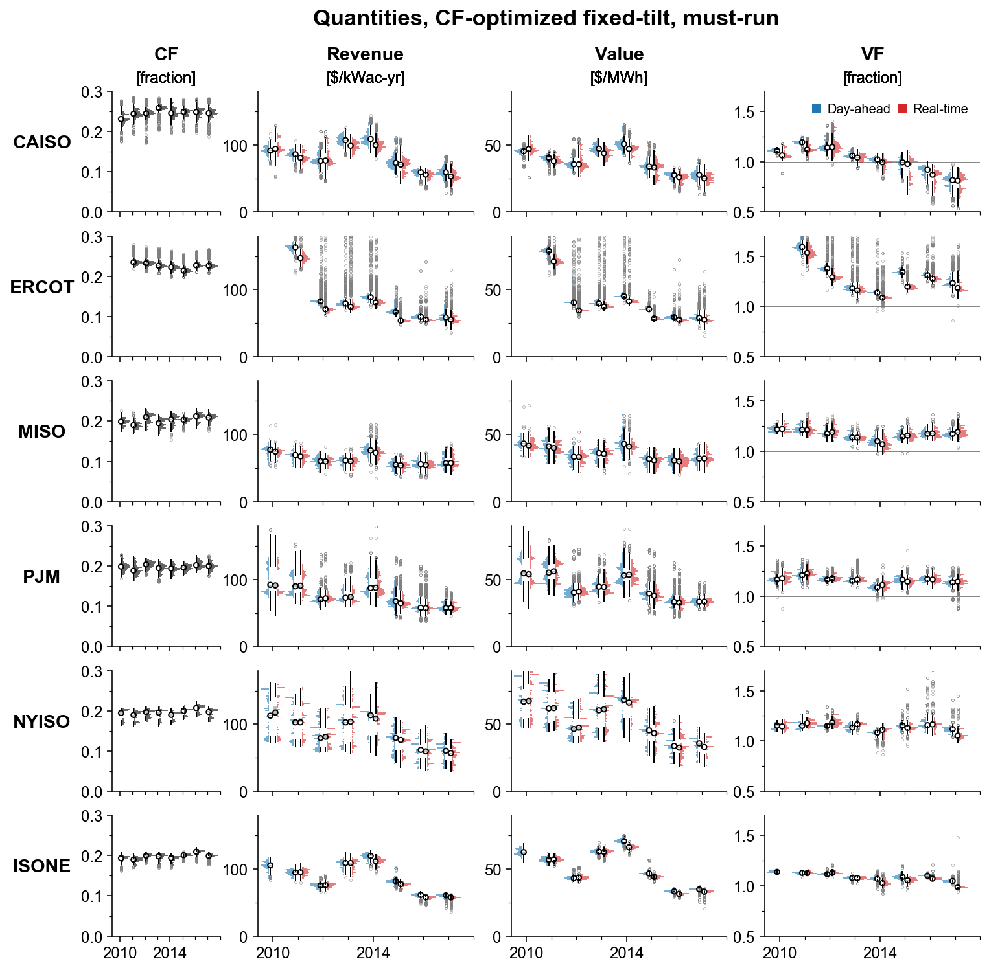

In [12]:
########## Starting absolute values for fixed CF-opt
### Data-indexed parameters
data = [
    'CapacityFactor_hist_optcf_f(da)(mustrun)',
    'Revenue_hist_optcf_f(da)(mustrun)',
    'Revenue_hist_optcf_f(rt)(mustrun)',
    'ValueAverage_hist_optcf_f(da)(mustrun)',
    'ValueAverage_hist_optcf_f(rt)(mustrun)',
    'ValueFactor_hist_optcf_f(da)(mustrun)',
    'ValueFactor_hist_optcf_f(rt)(mustrun)',
]
colindex = [0, 1, 1, 2, 2, 3, 3]
colindex = dict(zip(data, colindex))
direction = ['right','left','right','left','right','left','right']
direction = dict(zip(data, direction))
color = [mc['tmy'],mc['da'],mc['rt'],mc['da'],mc['rt'],mc['da'],mc['rt']]
color = dict(zip(data, color))
squeeze = [0.7, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35]
squeeze = dict(zip(data, squeeze))


### Column-indexed parameters
ncols = 4
# cols = [0,1,2,3]
ylim = [
    [0,0.3],
    [0,180], #[0,210], 
    [0,90], #[0,110],
    [0.5,1.7], #[0.6,1.8],
]

ylabel = [
    'CF',
    'Revenue',
    'Value',
    'VF',
]

note = [
    '[fraction]',
    '[$/kWac-yr]',
    '[$/MWh]',
    '[fraction]',
]

gridspec_kw = {'width_ratios': [1, 2, 2, 2]}

### Plot it
plt.close()
f,ax = plt.subplots(6,ncols,sharex=True,sharey='col', gridspec_kw=gridspec_kw,
                    figsize=(sum(gridspec_kw['width_ratios'])*12/7, figheight), 
                   )
for row, iso in enumerate(isos):
    for datum in data:
        dfframe = (dfplot.loc[dfplot.ISOwecc==iso]
                   .pivot(index='ISO:Node',columns='yearlmp',values=datum))

        pvvm.plots.plotquarthist(
            ax=ax[(row,colindex[datum])], dfplot=dfframe, bootstrap=bootstrap, density=True,
            histcolor=color[datum], hist_range=ylim[colindex[datum]],
            direction=direction[datum], squeeze=squeeze[datum],
            quartpad=(-0.1 if direction[datum] == 'left' else 0.1),
            histpad=(-0.15 if direction[datum] == 'left' else 0.15),
            # medianmarker='_', mediansize=10, medianfacecolor='k'
        )

### Format axis
for row, iso in enumerate(isos):
    for col in range(ncols):
        ax[(row,0)].set_ylabel(iso, weight='bold', rotation=0, labelpad=30)
        ax[(row,col)].set_xlim(2009.4,2018)
        ### x ticks
        ax[(row,col)].set_xticks([2010,2014])
        ax[(row,col)].set_xticklabels(
            ['2010','2014'], rotation=0, ha='center')
        ax[(row,col)].xaxis.set_minor_locator(AutoMinorLocator(4))
        ### Add title
        ax[(0,col)].set_title(ylabel[col], weight='bold', y=1.2, size='x-large')
        ### Add annotation
        ax[(0,col)].annotate(
            note[col], xy=(0.5,1.05), xycoords='axes fraction',
            ha='center', va='bottom', fontsize='large')

        ### Format axis
        ax[(row,col)].set_ylim(*ylim[col])
        ax[(row,col)].yaxis.set_minor_locator(AutoMinorLocator(2))
        ### Add 1-line for VF
        ax[(row,-1)].axhline(1, lw=0.25, c='0.5')
pvvm.plots.despine(ax)

### Legend
patches = [
    mpl.patches.Patch(
        facecolor=mc[market], edgecolor='none', 
        label=('Day-ahead' if market == 'da' else 'Real-time'))
    for market in ['da','rt']]
leg = ax[(0,-1)].legend(
    handles=patches, loc='upper right', frameon=False, ncol=2,
    columnspacing=0.5, handletextpad=0.5, handlelength=0.7,)

# # plt.tight_layout()
## add big axis, hide frame, ticks, and labels
f.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.title('Quantities, CF-optimized fixed-tilt, must-run', weight='bold', y=1.07, fontsize='xx-large')

plt.show()

In [13]:
print('CAISO 2017')
display(dfplot.loc[(dfplot.ISOwecc=='CAISO')&(dfplot.yearlmp==2017),data].describe(percentiles=fractions))
print('median')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].median().unstack('ISOwecc'))
print('max')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].max().unstack('ISOwecc'))
for datum in data:
    print(datum)
    display(dfplot.groupby(['ISOwecc','yearlmp'])[datum].describe(percentiles=fractions).T)

CAISO 2017


,CapacityFactor_hist_optcf_f(da)(mustrun),Revenue_hist_optcf_f(da)(mustrun),Revenue_hist_optcf_f(rt)(mustrun),ValueAverage_hist_optcf_f(da)(mustrun),ValueAverage_hist_optcf_f(rt)(mustrun),ValueFactor_hist_optcf_f(da)(mustrun),ValueFactor_hist_optcf_f(rt)(mustrun)
count,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000
mean,0.246188,59.642007,53.883991,27.708089,25.040576,0.801583,0.788523
std,0.011704,6.841004,7.212112,3.342419,3.514949,0.062013,0.079220
min,0.187778,28.469182,27.826508,12.993617,13.054663,0.451965,0.469798
2.5%,0.225073,45.610871,40.140121,20.772181,18.265009,0.671348,0.639226
25%,0.240347,56.143990,49.279463,25.543496,22.333303,0.761790,0.728410
50%,0.245543,59.215096,52.814589,27.703784,25.011672,0.816433,0.811701
75%,0.252588,63.347934,58.849791,29.722195,27.819860,0.843112,0.851000
97.5%,0.274404,75.239969,69.971012,34.382648,31.960051,0.915864,0.905468
max,0.282761,82.950998,74.620503,40.043755,35.075066,0.976529,0.937086


median


CapacityFactor_hist_optcf_f(da)(mustrun)                      \
ISOwecc                                    CAISO     ERCOT     ISONE   
yearlmp                                                                
2010                                    0.230972       NaN  0.193482   
2011                                    0.243936  0.234866  0.190098   
2012                                    0.244936  0.232577  0.199708   
2013                                    0.258688  0.226295  0.198371   
2014                                    0.245462  0.222564  0.194251   
2015                                    0.248991  0.213987  0.201143   
2016                                    0.248407  0.227279  0.209589   
2017                                    0.245543  0.226272  0.199129   

                                                   \
ISOwecc      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                             
2010     0.198847  0.194502  0.198551         NaN   
2011     0.189981  0.189608  0.188582         NaN   
2012     0.210066  0.196966  0.203782         NaN   
2013     0.195050  0.195548  0.194807         NaN   
2014     0.204298  0.189929  0.193770         NaN   
2015     0.203341  0.199722  0.196122    0.226895   
2016     0.212410  0.206703  0.201994    0.233462   
2017     0.208934  0.197039  0.199729    0.254154   

        Revenue_hist_optcf_f(da)(mustrun)                                     \
ISOwecc                             CAISO       ERCOT       ISONE       MISO   
yearlmp                                                                        
2010                            91.630257         NaN  105.497863  77.500738   
2011                            86.103130  163.255041   94.790453  69.637654   
2012                            76.214457   82.804797   75.495416  60.433441   
2013                           107.022227   79.332946  109.051458  61.371157   
2014                           108.886657   88.954743  119.572237  76.334670   
2015                            73.239214   67.027475   81.934695  55.204096   
2016                            59.331690   59.706667   61.372094  55.933880   
2017                            59.215096   58.688937   60.681659  57.310864   

                                           Revenue_hist_optcf_f(rt)(mustrun)  \
ISOwecc       NYISO        PJM WECC -CAISO                             CAISO   
yearlmp                                                                        
2010     112.758798  91.734709         NaN                         94.208201   
2011     102.834552  89.623317         NaN                         80.671016   
2012      79.442607  70.136512         NaN                         76.621147   
2013     102.792563  72.538165         NaN                         98.699543   
2014     113.466331  87.085898         NaN                         99.847372   
2015      79.654977  67.236213   60.160760                         70.537787   
2016      61.697934  57.699422   50.692495                         55.657016   
2017      60.449408  57.115360   50.727470                         52.814589   

                                                                               \
ISOwecc       ERCOT       ISONE       MISO       NYISO        PJM WECC -CAISO   
yearlmp                                                                         
2010            NaN         NaN  74.620116  117.453727  90.926518         NaN   
2011     147.202962   95.315083  67.368666  102.822357  90.472253         NaN   
2012      70.834097   75.994444  59.939321   81.261827  71.671996         NaN   
2013      74.592091  108.962743  60.310346  103.703793  73.717128         NaN   
2014      81.070067  111.806277  72.871556  108.451109  87.549573         NaN   
2015      53.928449   77.476387  54.091967   76.588783  64.386584   45.203972   
2016      55.293798   57.768955  54.724383   59.509091  57.117897   40.173297   
2017      55.402269   57.717520  57.560303   56.736561  57.

max


CapacityFactor_hist_optcf_f(da)(mustrun)                      \
ISOwecc                                    CAISO     ERCOT     ISONE   
yearlmp                                                                
2010                                    0.277866       NaN  0.207146   
2011                                    0.285192  0.279049  0.205588   
2012                                    0.281405  0.273209  0.207713   
2013                                    0.283820  0.269719  0.206275   
2014                                    0.279916  0.265088  0.203394   
2015                                    0.280158  0.255952  0.209564   
2016                                    0.281632  0.262511  0.219156   
2017                                    0.282761  0.267850  0.207351   

                                                   \
ISOwecc      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                             
2010     0.225963  0.206615  0.228378         NaN   
2011     0.223398  0.206670  0.222986         NaN   
2012     0.231437  0.208879  0.218694         NaN   
2013     0.217156  0.210662  0.214248         NaN   
2014     0.223683  0.206444  0.215460         NaN   
2015     0.219845  0.211239  0.211704    0.260411   
2016     0.231624  0.222363  0.225568    0.276496   
2017     0.227381  0.209204  0.226219    0.276142   

        Revenue_hist_optcf_f(da)(mustrun)                                      \
ISOwecc                             CAISO       ERCOT       ISONE        MISO   
yearlmp                                                                         
2010                           116.851289         NaN  117.537375  113.244225   
2011                           106.351969  426.367353  105.779767   89.751867   
2012                           120.540637  778.858911   87.800296   74.783118   
2013                           126.315515  295.869659  124.496771   78.324788   
2014                           143.808370  292.514372  127.472113  114.593187   
2015                           111.083014  104.810763  101.922449   71.453293   
2016                            67.441523  128.198562   66.022374   73.002232   
2017                            82.950998  104.163372   64.060605   82.061544   

                                            Revenue_hist_optcf_f(rt)(mustrun)  \
ISOwecc       NYISO         PJM WECC -CAISO                             CAISO   
yearlmp                                                                         
2010     162.037417  174.184442         NaN                        130.018708   
2011     145.127694  152.744892         NaN                         99.718389   
2012     122.350396  137.166419         NaN                        120.537862   
2013     156.028937  122.917740         NaN                        115.165879   
2014     144.684377  193.165455         NaN                        132.967096   
2015     109.363575  132.634029   68.143543                        110.014158   
2016      91.640258  120.496917   62.088274                         64.641734   
2017      86.033215   87.835021   63.711292                         74.620503   

                                                                     \
ISOwecc       ERCOT       ISONE        MISO       NYISO         PJM   
yearlmp                                                               
2010            NaN         NaN  114.945681  160.141739  164.998095   
2011     326.267108  108.772527   87.924704  153.641869  142.928318   
2012     694.822127   91.392987   82.178646  123.838466  138.588866   
2013     219.394761  121.951244   79.830470  204.811975  125.289742   
2014     197.115729  120.849700  114.276118  161.456743  187.543788   
2015      87.213937   83.699451   70.988370  105.433792  128.250100   
2016     141.959905   62.485980   72.925825   98.416609  111.255032   
2017     128.990140   62.265714   86.511683   77.479656   80.494622   

                    ValueAverage_hist_optcf_f(da)(mustrun)       

CapacityFactor_hist_optcf_f(da)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        0.232652     0.245190     0.244435     0.258043     0.246584   
std         0.014412     0.012606     0.012300     0.008757     0.012197   
min         0.173918     0.193692     0.171110     0.203060     0.195900   
2.5%        0.208335     0.222666     0.223061     0.238273     0.225968   
25%         0.224480     0.238225     0.239986     0.255004     0.238837   
50%         0.230972     0.243936     0.244936     0.258688     0.245462   
75%         0.241740     0.252387     0.249604     0.262092     0.255667   
97.5%       0.269139     0.277368     0.271449     0.275072     0.271443   
max         0.277866     0.285192     0.281405     0.283820     0.279916   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        0.248396     0.247330     0.246188     0.237353     0.233811   
std         0.009014     0.012372     0.011704     0.010747     0.010504   
min         0.199669     0.196407     0.187778     0.219438     0.212187   
2.5%        0.234869     0.219041     0.225073     0.224218     0.217323   
25%         0.242646     0.240335     0.240347     0.231548     0.228076   
50%         0.248991     0.248407     0.245543     0.234866     0.232577   
75%         0.252410     0.255109     0.252588     0.239234     0.236262   
97.5%       0.269770     0.272408     0.274404     0.271558     0.264260   
max         0.280158     0.281632     0.282761     0.279049     0.273209   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        0.229137     0.224395     0.216660     0.229445     0.228360   
std         0.012283     0.011707     0.010886     0.009475     0.010145   
min         0.206964     0.197210     0.198289     0.210270     0.208513   
2.5%        0.210992     0.204041     0.202336     0.215856     0.214852   
25%         0.222471     0.217984     0.210657     0.223966     0.222721   
50%         0.226295     0.222564     0.213987     0.227279     0.226272   
75%         0.231392     0.228012     0.218764     0.232245     0.230555   
97.5%       0.263887     0.256828     0.247668     0.257023     0.260103   
max         0.269719     0.265088     0.255952     0.262511     0.267850   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       0.190555    0.188857    0.197713    0.195224    0.191377   
std        0.009408    0.006664    0.005534    0.008408    0.007473   
min        0.161775    0.168907    0.181200    0.169681    0.169265   
2.5%       0.168085    0.174743    0.185035    0.175755    0.174051   
25%        0.188044    0.185747    0.194775    0.191531    0.188172   
50%        0.193482    0.190098    0.199708    0.198371    0.194251   
75%        0.197123    0.193722    0.201651    0.201684    0.196809   
97.5%      0.201700    0.198671    0.204188    0.205412    0.200667   
max        0.207146    0.205588    0.207713    0.206275    0.203394   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       0.199974    0.207266    0.197753    0.197341    0.190831   
std        0.004207    0.006670    0.005155    0.009304    0.009098   
min        0.185596    0.183795    0.178488    0.1749

Revenue_hist_optcf_f(da)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean       92.017992    86.390811    77.974030   107.271957   110.104298   
std         6.005148     5.572234     8.389878     6.446090     9.415272   
min        71.274534    61.611789    50.573090    84.319527    87.988728   
2.5%       79.290844    74.528975    63.876227    94.882491    94.949389   
25%        88.526639    83.447599    73.198409   102.891764   103.476367   
50%        91.630257    86.103130    76.214457   107.022227   108.886657   
75%        96.640049    90.556029    82.294617   112.096901   114.976130   
97.5%     103.933588    95.583254    97.323221   118.441945   132.925730   
max       116.851289   106.351969   120.540637   126.315515   143.808370   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean       73.928335    58.816583    59.642007   164.868145    91.047394   
std         7.362007     3.933406     6.841004    14.395855    39.251020   
min        53.915681    41.329243    28.469182   125.249880    74.047564   
2.5%       63.312943    51.505725    45.610871   150.893603    76.624588   
25%        68.846922    56.010668    56.143990   159.963083    81.285597   
50%        73.239214    59.331690    59.215096   163.255041    82.804797   
75%        77.235285    61.898480    63.347934   165.906664    84.229868   
97.5%      89.602914    64.740581    75.239969   207.276980   199.118649   
max       111.083014    67.441523    82.950998   426.367353   778.858911   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean       85.353546    92.596227    68.501629    60.761364    61.179336   
std        24.425163    16.505927     5.253532     4.789278     7.581061   
min        69.603852    74.660346    60.389228    52.059542    43.690718   
2.5%       74.536295    81.245414    63.339557    56.316918    53.613932   
25%        77.790668    86.510929    65.729020    58.362987    56.056007   
50%        79.332946    88.954743    67.027475    59.706667    58.688937   
75%        82.340444    91.402491    69.417171    62.070897    63.316588   
97.5%     176.967152   151.489954    82.306710    70.843367    82.599720   
max       295.869659   292.514372   104.810763   128.198562   104.163372   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean     104.678846   94.423800   75.294163  107.608886  118.502668   
std        6.892035    4.123885    3.448186    6.184023    5.252478   
min       83.379435   81.050723   66.660673   87.551765  100.408828   
2.5%      88.370756   85.970329   68.715172   95.341394  107.319311   
25%      101.603689   91.566926   73.214170  102.935325  116.177159   
50%      105.497863   94.790453   75.495416  109.051458  119.572237   
75%      109.781746   97.608945   77.325865  111.836139  122.245235   
97.5%    115.133447  101.320813   85.090230  117.149755  126.313890   
max      117.537375  105.779767   87.800296  124.496771  127.472113   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean      81.864221   60.588686   59.961438   75.715618   68.528698   
std        3.498104    2.915279    2.681080    7.830648    7.746373   
min       70.252272   48.377149   42.338154   53.9464

Revenue_hist_optcf_f(rt)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean       97.383341    81.933103    80.399598    98.337395   101.255145   
std        10.789130     7.673545    13.325080     6.537813     9.140125   
min        51.070740    59.563879    45.561790    80.509229    79.236077   
2.5%       79.962447    65.525861    58.694705    85.801711    88.097041   
25%        90.474501    77.541906    71.777296    94.168444    95.138763   
50%        94.208201    80.671016    76.621147    98.699543    99.847372   
75%       105.650250    87.906132    87.807050   103.679805   104.931149   
97.5%     117.711876    97.468346   110.509515   108.335215   125.277196   
max       130.018708    99.718389   120.537862   115.165879   132.967096   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean       69.287040    54.830548    53.883991   149.192436    80.347571   
std        10.637636     4.960570     7.212112    13.388035    44.873751   
min        42.841082    33.778017    27.826508   129.058755    62.932544   
2.5%       51.183557    45.594587    40.140121   135.169008    64.812043   
25%        59.903849    51.726545    49.279463   143.930722    68.742494   
50%        70.537787    55.657016    52.814589   147.202962    70.834097   
75%        76.438079    58.533210    58.849791   151.751025    72.567124   
97.5%      91.561252    62.807131    69.971012   175.099512   193.964647   
max       110.014158    64.641734    74.620503   326.267108   694.822127   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean       79.848675    84.395666    55.213807    56.717095    58.282512   
std        19.277648    14.512568     4.987191     5.904052     8.911151   
min        66.772353    72.717154    47.472676    48.831916    35.322076   
2.5%       68.982385    74.547617    50.434933    52.015167    49.336312   
25%        72.929978    78.893075    52.787009    54.072354    52.738248   
50%        74.592091    81.070067    53.928449    55.293798    55.402269   
75%        78.258475    83.782106    55.470331    57.398486    60.692260   
97.5%     153.284960   134.583828    70.543404    68.099911    82.103967   
max       219.394761   197.115729    87.213937   141.959905   128.990140   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN   94.943911   75.989413  106.772965  110.967069   76.995658   
std       NaN    4.537097    3.888703    7.163677    5.116133    2.570858   
min       NaN   79.852823   65.503191   83.752796   94.736047   68.085368   
2.5%      NaN   86.420153   69.091122   92.218752  100.464073   70.150784   
25%       NaN   91.616091   73.153077  101.608385  108.167476   75.569785   
50%       NaN   95.315083   75.994444  108.962743  111.806277   77.476387   
75%       NaN   98.591732   78.148675  112.369067  114.754629   78.879280   
97.5%     NaN  102.214150   87.524096  115.765264  119.509831   80.906720   
max       NaN  108.772527   91.392987  121.951244  120.849700   83.699451   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean      57.049205   57.084254   73.260644   67.043250   59.917161   
std        2.926616    3.077326    7.402907    7.063

ValueAverage_hist_optcf_f(da)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean       45.175477    40.237222    36.303819    47.481951    50.994203   
std         1.737670     1.901685     3.342362     2.845445     3.864041   
min        33.313455    28.391637    29.209682    41.114637    42.012615   
2.5%       41.852121    35.982966    31.426159    42.523440    45.338306   
25%        44.349947    39.338735    34.138560    45.388035    48.706638   
50%        45.325221    40.417082    35.591168    47.221461    50.624526   
75%        46.172183    41.439087    37.220480    49.535416    52.423757   
97.5%      47.974505    43.070405    44.445137    53.333409    61.901275   
max        51.138572    46.800609    54.646675    54.949088    65.550925   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean       34.050025    27.128030    27.708089    79.275421    43.978884   
std         3.895063     2.071822     3.342419     5.134065    16.197393   
min        25.643363    18.246635    12.993617    60.899811    36.437815   
2.5%       28.324880    22.622647    20.772181    72.730362    39.290432   
25%        31.444474    25.799738    25.543496    78.034765    40.154849   
50%        33.848354    27.562865    27.703784    79.033268    40.427457   
75%        35.830691    28.664876    29.722195    80.056644    41.362006   
97.5%      42.628439    30.027871    34.382648    90.463622    86.185197   
max        51.850500    33.016643    40.043755   180.349037   336.886631   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean       42.241667    46.988858    36.076308    30.178078    30.631365   
std         9.472674     6.762032     1.618363     2.503227     4.007041   
min        35.801061    40.005112    33.776167    26.829091    21.251504   
2.5%       38.860819    44.198561    34.667877    28.212429    26.756687   
25%        39.305126    44.922410    35.081047    29.116750    28.318281   
50%        39.773405    45.230950    35.470877    29.540111    29.010892   
75%        41.296605    46.365705    36.755853    30.359646    31.481967   
97.5%      75.644844    67.829329    39.217138    34.887011    42.383883   
max       128.588504   137.372822    49.667198    65.213393    52.523915   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean      62.701305   57.080122   43.348422   62.898107   70.691908   
std        2.558203    1.662777    1.401016    1.623996    1.745539   
min       55.011258   52.674335   40.901957   58.110155   64.704386   
2.5%      57.172491   53.600850   41.352215   58.821619   66.606596   
25%       60.875639   55.755952   42.607818   62.089156   70.037166   
50%       62.599238   56.953720   43.116905   63.002813   70.751555   
75%       64.956181   58.375755   43.891171   63.799581   71.642525   
97.5%     66.306422   59.685034   49.125540   65.588970   74.614059   
max       68.874514   61.840130   49.998567   69.726218   75.338511   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean      46.726974   33.267879   34.606131   43.852098   41.093687   
std        1.598961    0.858068    1.091594    4.723929    5.063609   
min       43.091132   29.473429   25.390258   33.5931

ValueAverage_hist_optcf_f(rt)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean       47.722470    38.134409    37.446310    43.541327    46.956412   
std         3.596859     2.811932     5.967216     3.046055     4.445673   
min        25.656461    28.169699    26.050272    35.050690    36.409243   
2.5%       42.211340    30.901124    29.585655    37.694997    39.833722   
25%        45.321445    36.592467    33.463885    41.484507    44.123682   
50%        46.945908    37.881238    35.546166    43.754006    47.074163   
75%        50.039086    39.797043    40.595816    46.074434    48.857096   
97.5%      55.642947    44.220885    50.444815    48.792808    58.346928   
max        56.869385    44.866865    54.572420    51.113866    61.328208   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean       31.951283    25.312546    25.040576    71.740774    38.692348   
std         5.409374     2.661176     3.514949     4.915115    18.765068   
min        20.373873    14.917904    13.054663    61.666777    30.100248   
2.5%       22.282715    19.947675    18.265009    65.244088    33.172320   
25%        27.438398    24.064748    22.333303    69.764634    34.186375   
50%        33.193210    25.910069    25.011672    71.076056    34.519891   
75%        35.233354    27.247834    27.819860    72.951362    35.240706   
97.5%      41.658164    28.627464    31.960051    79.821264    86.487046   
max        50.599382    33.178101    35.075066   138.007656   300.006977   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean       39.547605    42.837528    29.068410    28.177017    29.195855   
std         7.240725     5.910189     1.807479     3.125806     4.735743   
min        34.652613    38.758187    26.106244    24.033717    15.524729   
2.5%       35.885133    39.976350    27.407564    25.625441    24.536075   
25%        36.751761    40.787187    28.045733    26.966500    26.483221   
50%        37.518670    41.357884    28.553451    27.542636    27.621548   
75%        39.186716    42.802924    29.498469    28.307955    30.482552   
97.5%      67.099756    59.544351    34.354405    33.870302    42.669838   
max        95.318513    89.325593    48.368216    72.213658    63.937091   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN   57.386932   43.748047   62.382588   66.191907   43.950614   
std       NaN    1.780798    1.710803    2.028008    1.644101    1.059716   
min       NaN   52.621013   40.226043   56.292143   60.382968   40.433814   
2.5%      NaN   53.724158   41.125231   57.056777   62.512804   41.626862   
25%       NaN   56.252230   42.760607   61.429011   65.337710   43.374614   
50%       NaN   57.200568   43.572244   62.770983   66.180022   44.117595   
75%       NaN   58.563235   44.265220   63.753554   67.254875   44.647653   
97.5%     NaN   61.230793   50.535786   65.283695   69.252369   45.833692   
max       NaN   61.772892   51.676310   68.044938   70.148506   48.159494   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean      31.321595   32.941855   42.428204   40.199509   32.955593   
std        0.896241    1.355520    4.457444    4.644

ValueFactor_hist_optcf_f(da)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        1.110444     1.193349     1.148942     1.064677     1.021081   
std         0.014350     0.015394     0.041868     0.022447     0.021162   
min         1.056745     1.097519     1.035543     1.003922     0.923115   
2.5%        1.083454     1.163646     1.095132     1.031357     0.980434   
25%         1.100363     1.184714     1.121083     1.049349     1.004867   
50%         1.109605     1.193562     1.139462     1.059504     1.022801   
75%         1.121073     1.201464     1.159033     1.072330     1.033891   
97.5%       1.134649     1.232153     1.255920     1.118123     1.062420   
max         1.139584     1.253313     1.367523     1.131657     1.075579   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        0.977549     0.903693     0.801583     1.597733     1.403138   
std         0.050178     0.044231     0.062013     0.037601     0.084605   
min         0.806810     0.700139     0.451965     1.323257     1.163643   
2.5%        0.879919     0.793333     0.671348     1.531973     1.345093   
25%         0.935731     0.871896     0.761790     1.576816     1.365590   
50%         0.993296     0.919551     0.816433     1.591313     1.376841   
75%         1.007882     0.938259     0.843112     1.615690     1.401108   
97.5%       1.061294     0.957645     0.915864     1.684966     1.709042   
max         1.085500     1.000511     0.976529     1.779045     1.940491   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        1.203839     1.151099     1.350195     1.322542     1.249446   
std         0.085153     0.055240     0.024463     0.042867     0.054614   
min         1.110578     0.948250     1.222508     1.241004     0.860535   
2.5%        1.154867     1.118458     1.319398     1.286726     1.192033   
25%         1.169742     1.132721     1.334518     1.302276     1.212436   
50%         1.182064     1.137982     1.343341     1.311012     1.232272   
75%         1.201482     1.151009     1.365563     1.328559     1.271679   
97.5%       1.532025     1.294104     1.396932     1.429653     1.389966   
max         1.813841     1.664182     1.534029     1.727105     1.507225   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       1.138182    1.126206    1.118057    1.075804    1.071918   
std        0.007917    0.010699    0.011466    0.010408    0.023345   
min        1.119896    1.082202    1.091326    1.031159    0.966255   
2.5%       1.122241    1.103681    1.105307    1.051325    1.025123   
25%        1.132650    1.118994    1.110817    1.072540    1.061366   
50%        1.138015    1.128503    1.115548    1.077531    1.069726   
75%        1.144296    1.134562    1.123743    1.081940    1.081777   
97.5%      1.152741    1.141510    1.163878    1.091152    1.123353   
max        1.153784    1.147259    1.173878    1.130427    1.153818   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       1.090439    1.100763    1.050301    1.220296    1.220006   
std        0.022383    0.007103    0.012271    0.025432    0.033600   
min        0.984190    1.079167    1.007036    1.1710

ValueFactor_hist_optcf_f(rt)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        1.076385     1.128881     1.163639     1.035682     0.979687   
std         0.039554     0.037368     0.078174     0.033217     0.041908   
min         0.883010     1.012611     0.965454     0.932919     0.827715   
2.5%        1.028627     1.063988     1.050626     0.950516     0.885077   
25%         1.047898     1.107970     1.110163     1.012383     0.950848   
50%         1.062646     1.120612     1.145248     1.041000     0.992912   
75%         1.097451     1.151650     1.186980     1.059612     1.006352   
97.5%       1.157595     1.229773     1.347417     1.083893     1.059011   
max         1.179287     1.237704     1.404304     1.122203     1.079433   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        0.935351     0.843889     0.788523     1.540910     1.331508   
std         0.097212     0.064592     0.079220     0.048391     0.121905   
min         0.677990     0.576613     0.469798     1.362208     1.193384   
2.5%        0.728756     0.703206     0.639226     1.468502     1.250695   
25%         0.850840     0.798293     0.728410     1.506037     1.275370   
50%         0.976788     0.870209     0.811701     1.533552     1.290854   
75%         1.009649     0.890129     0.851000     1.567627     1.325862   
97.5%       1.072257     0.927579     0.905468     1.641696     1.760667   
max         1.114281     0.971997     0.937086     1.792053     2.121927   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        1.183320     1.098544     1.203592     1.291599     1.211012   
std         0.085964     0.045604     0.035983     0.059359     0.080243   
min         1.042890     0.963705     1.131437     1.191316     0.541563   
2.5%        1.113680     1.058282     1.165971     1.243550     1.137975   
25%         1.143319     1.080248     1.182944     1.265507     1.160394   
50%         1.160513     1.087337     1.196270     1.276788     1.184371   
75%         1.188607     1.101589     1.212809     1.294037     1.241396   
97.5%       1.501106     1.231143     1.310437     1.410076     1.447983   
max         1.701891     1.532755     1.528232     1.796781     1.620960   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    1.129131    1.131662    1.074999    1.031408    1.053954   
std       NaN    0.010387    0.016744    0.012499    0.028346    0.021660   
min       NaN    1.100954    1.084208    1.028125    0.919583    0.956089   
2.5%      NaN    1.114080    1.112532    1.047879    0.983499    1.011337   
25%       NaN    1.120877    1.121657    1.065544    1.014415    1.037846   
50%       NaN    1.126617    1.128399    1.077664    1.027523    1.054393   
75%       NaN    1.136410    1.137501    1.085202    1.046358    1.069807   
97.5%     NaN    1.150811    1.200920    1.092205    1.097526    1.093585   
max       NaN    1.155443    1.213145    1.096285    1.128290    1.109420   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       1.072517    0.996258    1.230620    1.223286    1.201184   
std        0.014107    0.031355    0.041639    0.049

## Curtailment (fixed-tilt)

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]


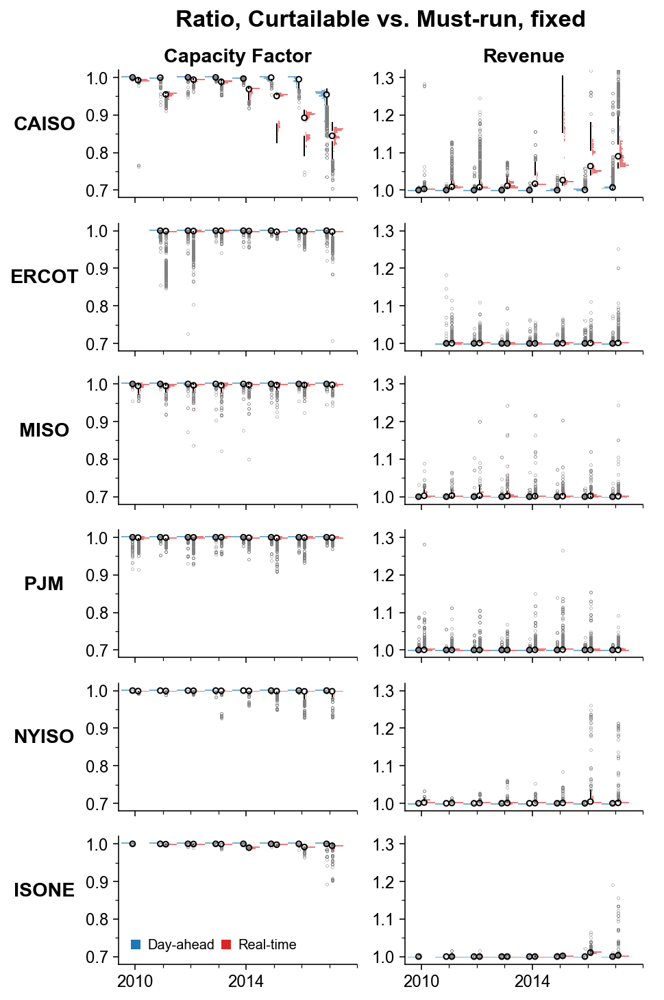

In [25]:
########## Starting absolute values for fixed CF-opt
### Data-indexed parameters
data = [
    'CF_curtail/CF_mustrun(fixed)(da)',
    'CF_curtail/CF_mustrun(fixed)(rt)',
    'Rev_curtail/Rev_mustrun(fixed)(da)',
    'Rev_curtail/Rev_mustrun(fixed)(rt)',
]
colindex = [0, 0, 1, 1]
colindex = dict(zip(data, colindex))
direction = ['left','right','left','right']
direction = dict(zip(data, direction))
color = [mc['da'],mc['rt'],mc['da'],mc['rt']]
color = dict(zip(data, color))
squeeze = [0.35, 0.35, 0.35, 0.35]
squeeze = dict(zip(data, squeeze))

### Column-indexed parameters
ncols = 2
ylim = [
    [0.68, 1.02],
    [0.98, 1.32],
]

ylabel = [
    'Capacity Factor',
    'Revenue',
]

note = [
    '',
    '',
]
y1 = 1     # 1.2 if using note
y2 = 1.04  # 1.07 if using note

gridspec_kw = {'width_ratios': [2, 2]}

### Plot it
plt.close()
f,ax = plt.subplots(6,ncols,sharex=True,sharey=False, gridspec_kw=gridspec_kw,
                    figsize=(sum(gridspec_kw['width_ratios'])*12/7, figheight), 
                   )
for row, iso in enumerate(isos):
    for datum in data:
        dfframe = (dfplot.loc[dfplot.ISOwecc==iso]
                   .pivot(index='ISO:Node',columns='yearlmp',values=datum))

        pvvm.plots.plotquarthist(
            ax=ax[(row,colindex[datum])], dfplot=dfframe, bootstrap=bootstrap, density=True,
            histcolor=color[datum], hist_range=ylim[colindex[datum]],
            direction=direction[datum], squeeze=squeeze[datum],
            quartpad=(-0.1 if direction[datum] == 'left' else 0.1),
            histpad=(-0.15 if direction[datum] == 'left' else 0.15),
#             format_axes=False,
        )

### Format axis
for row, iso in enumerate(isos):
    for col in range(ncols):
        ax[(row,0)].set_ylabel(iso, weight='bold', rotation=0, labelpad=30)
        ax[(row,col)].set_xlim(2009.4,2018)
        ### x ticks
        ax[(row,col)].set_xticks([2010,2014])
        ax[(row,col)].set_xticklabels(
            ['2010','2014'], rotation=0, ha='center')
        ax[(row,col)].xaxis.set_minor_locator(AutoMinorLocator(4))
        ### Add title
        ax[(0,col)].set_title(ylabel[col], weight='bold', y=y1, size='x-large')
        ### Add annotation
        ax[(0,col)].annotate(
            note[col], xy=(0.5,1.05), xycoords='axes fraction',
            ha='center', va='bottom', fontsize='large')

        ### Format axis
        ax[(row,col)].set_ylim(*ylim[col])
        ax[(row,col)].yaxis.set_major_locator(MultipleLocator(0.1))
        ax[(row,col)].yaxis.set_minor_locator(AutoMinorLocator(2))
pvvm.plots.despine(ax)

### Legend
patches = [
    mpl.patches.Patch(
        facecolor=mc[market], edgecolor='none', 
        label=('Day-ahead' if market == 'da' else 'Real-time'))
    for market in ['da','rt']]
leg = ax[(-1,0)].legend(
    handles=patches, loc='lower left', frameon=False, ncol=2,
    columnspacing=0.5, handletextpad=0.5, handlelength=0.7,)

# # plt.tight_layout()
## add big axis, hide frame, ticks, and labels
f.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.title('Ratio, Curtailable vs. Must-run, fixed', weight='bold', y=y2, fontsize='xx-large')

plt.show()

In [26]:
print('CAISO 2017')
display(dfplot.loc[(dfplot.ISOwecc=='CAISO')&(dfplot.yearlmp==2017),data].describe(percentiles=fractions))
print('median')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].median().unstack('ISOwecc'))
print('max')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].max().unstack('ISOwecc'))
for datum in data:
    print(datum)
    display(dfplot.groupby(['ISOwecc','yearlmp'])[datum].describe(percentiles=fractions).T)

CAISO 2017


,CF_curtail/CF_mustrun(fixed)(da),CF_curtail/CF_mustrun(fixed)(rt),Rev_curtail/Rev_mustrun(fixed)(da),Rev_curtail/Rev_mustrun(fixed)(rt)
count,2209.000000,2209.000000,2209.000000,2209.000000
mean,0.946114,0.839164,1.012793,1.116364
std,0.025391,0.028136,0.025054,0.088171
min,0.734967,0.704510,1.003795,1.058217
2.5%,0.873700,0.755800,1.005002,1.062509
25%,0.945421,0.829134,1.006094,1.071480
50%,0.954375,0.844459,1.007082,1.090087
75%,0.959726,0.860207,1.008928,1.123006
97.5%,0.963765,0.867057,1.054005,1.305881
max,0.968056,0.879552,1.486920,2.011486


median


CF_curtail/CF_mustrun(fixed)(da)                                  \
ISOwecc                            CAISO ERCOT     ISONE MISO NYISO  PJM   
yearlmp                                                                    
2010                            0.999891   NaN  1.000000  1.0   1.0  1.0   
2011                            0.999336   1.0  1.000000  1.0   1.0  1.0   
2012                            1.000000   1.0  1.000000  1.0   1.0  1.0   
2013                            1.000000   1.0  1.000000  1.0   1.0  1.0   
2014                            0.996845   1.0  1.000000  1.0   1.0  1.0   
2015                            0.999576   1.0  0.999983  1.0   1.0  1.0   
2016                            0.994956   1.0  1.000000  1.0   1.0  1.0   
2017                            0.954375   1.0  1.000000  1.0   1.0  1.0   

                    CF_curtail/CF_mustrun(fixed)(rt)                      \
ISOwecc WECC -CAISO                            CAISO     ERCOT     ISONE   
yearlmp                                                                    
2010            NaN                         0.992574       NaN       NaN   
2011            NaN                         0.954748  0.999052  0.999084   
2012            NaN                         0.993981  0.999194  0.999549   
2013            NaN                         0.988362  0.999825  0.999294   
2014            NaN                         0.968861  0.999016  0.989827   
2015       1.000000                         0.950535  0.997184  0.997776   
2016       0.999761                         0.892457  0.998501  0.991553   
2017       0.944457                         0.844459  0.997431  0.995044   

                                                   \
ISOwecc      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                             
2010     0.994818  0.998674  0.999160         NaN   
2011     0.994701  0.999010  0.999012         NaN   
2012     0.996336  0.999521  0.999780         NaN   
2013     0.996476  0.999359  1.000000         NaN   
2014     0.997497  0.999057  0.998801         NaN   
2015     0.997206  0.998593  0.998381    0.956260   
2016     0.997408  0.997897  0.999278    0.900596   
2017     0.997846  0.998177  0.999005    0.846251   

        Rev_curtail/Rev_mustrun(fixed)(da)                                  \
ISOwecc                              CAISO ERCOT     ISONE MISO NYISO  PJM   
yearlmp                                                                      
2010                              1.000005   NaN  1.000000  1.0   1.0  1.0   
2011                              1.000028   1.0  1.000000  1.0   1.0  1.0   
2012                              1.000000   1.0  1.000000  1.0   1.0  1.0   
2013                              1.000000   1.0  1.000000  1.0   1.0  1.0   
2014                              1.000016   1.0  1.000000  1.0   1.0  1.0   
2015                              1.000039   1.0  1.000002  1.0   1.0  1.0   
2016                              1.000723   1.0  1.000000  1.0   1.0  1.0   
2017                              1.007082   1.0  1.000000  1.0   1.0  1.0   

                    Rev_curtail/Rev_mustrun(fixed)(rt)                      \
ISOwecc WECC -CAISO                              CAISO     ERCOT     ISONE   
yearlmp                                                                      
2010            NaN                           1.003201       NaN       NaN   
2011            NaN                           1.008916  1.000475  1.000000   
2012            NaN                           1.007790  1.000890  1.000000   
2013            NaN                           1.011310  1.000137  1.000000   
2014            NaN                           1.016974  1.000153  1.000098   
2015       1.000000                           1.026694  1.000627  1.001910   
2016       1.000001                           1.063702  1.000980  1.010817   
2017       1.007793                           1.090087  1.001346  1.003300   

                                

max


CF_curtail/CF_mustrun(fixed)(da)                                  \
ISOwecc                            CAISO ERCOT     ISONE MISO NYISO  PJM   
yearlmp                                                                    
2010                            0.999967   NaN  1.000000  1.0   1.0  1.0   
2011                            0.999751   1.0  1.000000  1.0   1.0  1.0   
2012                            1.000000   1.0  1.000000  1.0   1.0  1.0   
2013                            1.000000   1.0  1.000000  1.0   1.0  1.0   
2014                            1.000000   1.0  1.000000  1.0   1.0  1.0   
2015                            1.000000   1.0  0.999989  1.0   1.0  1.0   
2016                            1.000000   1.0  1.000000  1.0   1.0  1.0   
2017                            0.968056   1.0  1.000000  1.0   1.0  1.0   

                    CF_curtail/CF_mustrun(fixed)(rt)                      \
ISOwecc WECC -CAISO                            CAISO     ERCOT     ISONE   
yearlmp                                                                    
2010            NaN                         0.995393       NaN       NaN   
2011            NaN                         0.962186  0.999963  0.999673   
2012            NaN                         0.996781  0.999995  0.999770   
2013            NaN                         0.992584  1.000000  0.999662   
2014            NaN                         0.975334  0.999933  0.994899   
2015       1.000000                         0.958292  0.999841  0.998326   
2016       1.000000                         0.912507  0.999521  0.993714   
2017       0.964118                         0.879552  0.999973  0.996733   

                                                   \
ISOwecc      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                             
2010     0.999929  0.999217  0.999989         NaN   
2011     0.999722  0.999722  0.999872         NaN   
2012     1.000000  0.999899  0.999985         NaN   
2013     1.000000  0.999894  1.000000         NaN   
2014     1.000000  0.999388  0.999968         NaN   
2015     1.000000  0.999299  0.999973    0.966608   
2016     1.000000  0.999218  0.999996    0.922624   
2017     1.000000  0.999243  0.999991    0.917047   

        Rev_curtail/Rev_mustrun(fixed)(da)                                \
ISOwecc                              CAISO     ERCOT     ISONE      MISO   
yearlmp                                                                    
2010                              1.007511       NaN  1.000381  1.032036   
2011                              1.017282  1.181707  1.000089  1.006524   
2012                              1.062973  1.441546  1.001437  1.104133   
2013                              1.011328  1.020913  1.003430  1.105501   
2014                              1.019664  1.063308  1.000731  1.065033   
2015                              1.038759  1.024715  1.006559  1.072204   
2016                              1.059724  1.061083  1.021643  1.023589   
2017                              1.486920  1.072424  1.190638  1.036037   

                                        Rev_curtail/Rev_mustrun(fixed)(rt)  \
ISOwecc     NYISO       PJM WECC -CAISO                              CAISO   
yearlmp                                                                      
2010     1.000083  1.088616         NaN                           1.283891   
2011     1.000000  1.056131         NaN                           1.129260   
2012     1.000915  1.040329         NaN                           1.244553   
2013     1.003456  1.031728         NaN                           1.075805   
2014     1.000000  1.029761         NaN                           1.155153   
2015     1.002804  1.139016    1.000179                           1.304408   
2016     1.001834  1.033304    1.009883                           1.396916   
2017     1.001351  1.015338    1.033989                           2.011486   

                                                      

CF_curtail/CF_mustrun(fixed)(da)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        0.999801     0.998804     0.999370     0.999726     0.996999   
std         0.000511     0.003582     0.003594     0.001185     0.001484   
min         0.994518     0.926922     0.947499     0.988563     0.980110   
2.5%        0.998756     0.994915     0.994438     0.994905     0.995411   
25%         0.999857     0.999225     1.000000     1.000000     0.996732   
50%         0.999891     0.999336     1.000000     1.000000     0.996845   
75%         0.999918     0.999552     1.000000     1.000000     0.997110   
97.5%       0.999956     0.999676     1.000000     1.000000     0.999497   
max         0.999967     0.999751     1.000000     1.000000     1.000000   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        0.997345     0.992236     0.946114     0.997992     0.999090   
std         0.003702     0.009445     0.025391     0.006467     0.007907   
min         0.954078     0.920260     0.734967     0.854365     0.725999   
2.5%        0.990164     0.972038     0.873700     0.982063     0.992659   
25%         0.995141     0.987382     0.945421     1.000000     1.000000   
50%         0.999576     0.994956     0.954375     1.000000     1.000000   
75%         1.000000     1.000000     0.959726     1.000000     1.000000   
97.5%       1.000000     1.000000     0.963765     1.000000     1.000000   
max         1.000000     1.000000     0.968056     1.000000     1.000000   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        0.999804     0.999692     0.999823     0.999529     0.998931   
std         0.001499     0.002042     0.001033     0.002064     0.004179   
min         0.970030     0.958049     0.985618     0.961378     0.920014   
2.5%        0.998448     0.997504     0.997905     0.994869     0.991996   
25%         1.000000     1.000000     1.000000     1.000000     0.999961   
50%         1.000000     1.000000     1.000000     1.000000     1.000000   
75%         1.000000     1.000000     1.000000     1.000000     1.000000   
97.5%       1.000000     1.000000     1.000000     1.000000     1.000000   
max         1.000000     1.000000     1.000000     1.000000     1.000000   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       0.999974    0.999990    0.999948    0.999975    0.999959   
std        0.000198    0.000142    0.000498    0.000146    0.000265   
min        0.997526    0.997901    0.991583    0.998082    0.997303   
2.5%       1.000000    1.000000    0.999519    0.999372    0.999439   
25%        1.000000    1.000000    1.000000    1.000000    1.000000   
50%        1.000000    1.000000    1.000000    1.000000    1.000000   
75%        1.000000    1.000000    1.000000    1.000000    1.000000   
97.5%      1.000000    1.000000    1.000000    1.000000    1.000000   
max        1.000000    1.000000    1.000000    1.000000    1.000000   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       0.999947    0.999912    0.999363    0.999387    0.999531   
std        0.000355    0.000757    0.005176    0.003683    0.001620   
min        0.992127    0.983212    0.893201    0.9548

CF_curtail/CF_mustrun(fixed)(rt)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        0.992355     0.952957     0.992018     0.987062     0.963292   
std         0.009986     0.007156     0.004195     0.006190     0.009657   
min         0.762575     0.910830     0.961229     0.953063     0.917312   
2.5%        0.989753     0.929307     0.982634     0.969009     0.940646   
25%         0.991982     0.951287     0.988919     0.985803     0.957079   
50%         0.992574     0.954748     0.993981     0.988362     0.968861   
75%         0.993928     0.957670     0.995049     0.990578     0.970922   
97.5%       0.995014     0.961060     0.996112     0.992126     0.972243   
max         0.995393     0.962186     0.996781     0.992584     0.975334   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        0.920131     0.875298     0.839164     0.986608     0.992268   
std         0.040977     0.031010     0.028136     0.033568     0.019451   
min         0.825962     0.741424     0.704510     0.845957     0.803607   
2.5%        0.844756     0.818729     0.755800     0.879823     0.930233   
25%         0.875198     0.842222     0.829134     0.997920     0.996519   
50%         0.950535     0.892457     0.844459     0.999052     0.999194   
75%         0.954159     0.902456     0.860207     0.999652     0.999869   
97.5%       0.957265     0.908433     0.867057     0.999934     0.999988   
max         0.958292     0.912507     0.879552     0.999963     0.999995   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        0.997905     0.998359     0.996696     0.994842     0.990580   
std         0.004836     0.003140     0.002676     0.007921     0.017115   
min         0.939958     0.954757     0.977393     0.950507     0.708194   
2.5%        0.984200     0.993137     0.991756     0.972728     0.950395   
25%         0.998651     0.998540     0.995315     0.995820     0.992877   
50%         0.999825     0.999016     0.997184     0.998501     0.997431   
75%         0.999951     0.999287     0.998847     0.998974     0.998942   
97.5%       0.999995     0.999591     0.999752     0.999384     0.999884   
max         1.000000     0.999933     0.999841     0.999521     0.999973   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    0.999054    0.999460    0.999085    0.990215    0.997744   
std       NaN    0.000437    0.000526    0.001466    0.001185    0.000413   
min       NaN    0.996023    0.989842    0.985119    0.987323    0.994792   
2.5%      NaN    0.997809    0.998420    0.997898    0.988325    0.996644   
25%       NaN    0.998945    0.999481    0.999228    0.989619    0.997648   
50%       NaN    0.999084    0.999549    0.999294    0.989827    0.997776   
75%       NaN    0.999331    0.999646    0.999466    0.990368    0.997941   
97.5%     NaN    0.999470    0.999743    0.999587    0.992944    0.998188   
max       NaN    0.999673    0.999770    0.999662    0.994899    0.998326   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       0.991003    0.991827    0.991375    0.989409    0.990109   
std        0.003110    0.011210    0.010055    0.013

Rev_curtail/Rev_mustrun(fixed)(da)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        1.000073     1.000480     1.000599     1.000094     1.000156   
std         0.000463     0.001704     0.003897     0.000569     0.001055   
min         1.000000     1.000009     1.000000     1.000000     1.000000   
2.5%        1.000002     1.000013     1.000000     1.000000     1.000000   
25%         1.000004     1.000019     1.000000     1.000000     1.000000   
50%         1.000005     1.000028     1.000000     1.000000     1.000016   
75%         1.000007     1.000044     1.000000     1.000000     1.000021   
97.5%       1.000782     1.007509     1.003848     1.000906     1.000922   
max         1.007511     1.017282     1.062973     1.011328     1.019664   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        1.000790     1.001747     1.012793     1.000648     1.000522   
std         0.003141     0.004442     0.025054     0.007241     0.011310   
min         1.000000     1.000000     1.003795     1.000000     1.000000   
2.5%        1.000000     1.000000     1.005002     1.000000     1.000000   
25%         1.000000     1.000000     1.006094     1.000000     1.000000   
50%         1.000039     1.000723     1.007082     1.000000     1.000000   
75%         1.000625     1.001461     1.008928     1.000000     1.000000   
97.5%       1.004448     1.012152     1.054005     1.002237     1.001611   
max         1.038759     1.059724     1.486920     1.181707     1.441546   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        1.000100     1.000367     1.000110     1.000582     1.000623   
std         0.000834     0.003050     0.000985     0.003703     0.003378   
min         1.000000     1.000000     1.000000     1.000000     1.000000   
2.5%        1.000000     1.000000     1.000000     1.000000     1.000000   
25%         1.000000     1.000000     1.000000     1.000000     1.000000   
50%         1.000000     1.000000     1.000000     1.000000     1.000000   
75%         1.000000     1.000000     1.000000     1.000000     1.000001   
97.5%       1.001175     1.003106     1.000730     1.006612     1.007219   
max         1.020913     1.063308     1.024715     1.061083     1.072424   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       1.000006    1.000000    1.000009    1.000011    1.000005   
std        0.000045    0.000004    0.000079    0.000151    0.000054   
min        1.000000    1.000000    1.000000    1.000000    1.000000   
2.5%       1.000000    1.000000    1.000000    1.000000    1.000000   
25%        1.000000    1.000000    1.000000    1.000000    1.000000   
50%        1.000000    1.000000    1.000000    1.000000    1.000000   
75%        1.000000    1.000000    1.000000    1.000000    1.000000   
97.5%      1.000000    1.000000    1.000028    1.000005    1.000005   
max        1.000381    1.000089    1.001437    1.003430    1.000731   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       1.000024    1.000029    1.000275    1.000299    1.000099   
std        0.000324    0.000752    0.006161    0.002449    0.000530   
min        1.000001    1.000000    1.000000    1.0000

Rev_curtail/Rev_mustrun(fixed)(rt)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        1.004650     1.014679     1.018781     1.014150     1.027885   
std         0.012589     0.017010     0.027827     0.010857     0.016902   
min         1.001490     1.005180     1.003763     1.004397     1.012153   
2.5%        1.001740     1.005644     1.005006     1.004943     1.013085   
25%         1.002439     1.007019     1.006209     1.007427     1.015084   
50%         1.003201     1.008916     1.007790     1.011310     1.016974   
75%         1.003556     1.015572     1.016607     1.019119     1.040257   
97.5%       1.017662     1.071168     1.107211     1.042849     1.066153   
max         1.283891     1.129260     1.244553     1.075805     1.155153   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        1.081936     1.081495     1.116364     1.004388     1.003656   
std         0.074476     0.038637     0.088171     0.009921     0.008257   
min         1.012642     1.040916     1.058217     1.000000     1.000000   
2.5%        1.015725     1.045254     1.062509     1.000006     1.000015   
25%         1.021240     1.051116     1.071480     1.000102     1.000263   
50%         1.026694     1.063702     1.090087     1.000475     1.000890   
75%         1.153218     1.105764     1.123006     1.002596     1.002714   
97.5%       1.239133     1.168655     1.305881     1.028339     1.026781   
max         1.304408     1.396916     2.011486     1.115124     1.109393   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        1.001417     1.001397     1.002758     1.003635     1.007032   
std         0.004874     0.004587     0.006477     0.007230     0.017579   
min         1.000000     1.000000     1.000000     1.000004     1.000001   
2.5%        1.000000     1.000003     1.000005     1.000028     1.000046   
25%         1.000046     1.000058     1.000160     1.000283     1.000655   
50%         1.000137     1.000153     1.000627     1.000980     1.001346   
75%         1.000885     1.000573     1.002280     1.004027     1.006375   
97.5%       1.012096     1.012382     1.020464     1.020922     1.040413   
max         1.094200     1.055808     1.065644     1.111239     1.344622   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    1.000203    1.000122    1.000041    1.000191    1.001919   
std       NaN    0.001448    0.000818    0.000140    0.000309    0.000328   
min       NaN    1.000000    1.000000    1.000000    1.000013    1.001295   
2.5%      NaN    1.000000    1.000000    1.000000    1.000026    1.001470   
25%       NaN    1.000000    1.000000    1.000000    1.000060    1.001764   
50%       NaN    1.000000    1.000000    1.000000    1.000098    1.001910   
75%       NaN    1.000000    1.000000    1.000000    1.000150    1.002042   
97.5%     NaN    1.000812    1.000862    1.000513    1.000927    1.002466   
max       NaN    1.016475    1.016019    1.001646    1.003568    1.004631   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       1.012073    1.007956    1.007112    1.006992    1.012386   
std        0.005884    0.022555    0.011872    0.010

## Tracking

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]


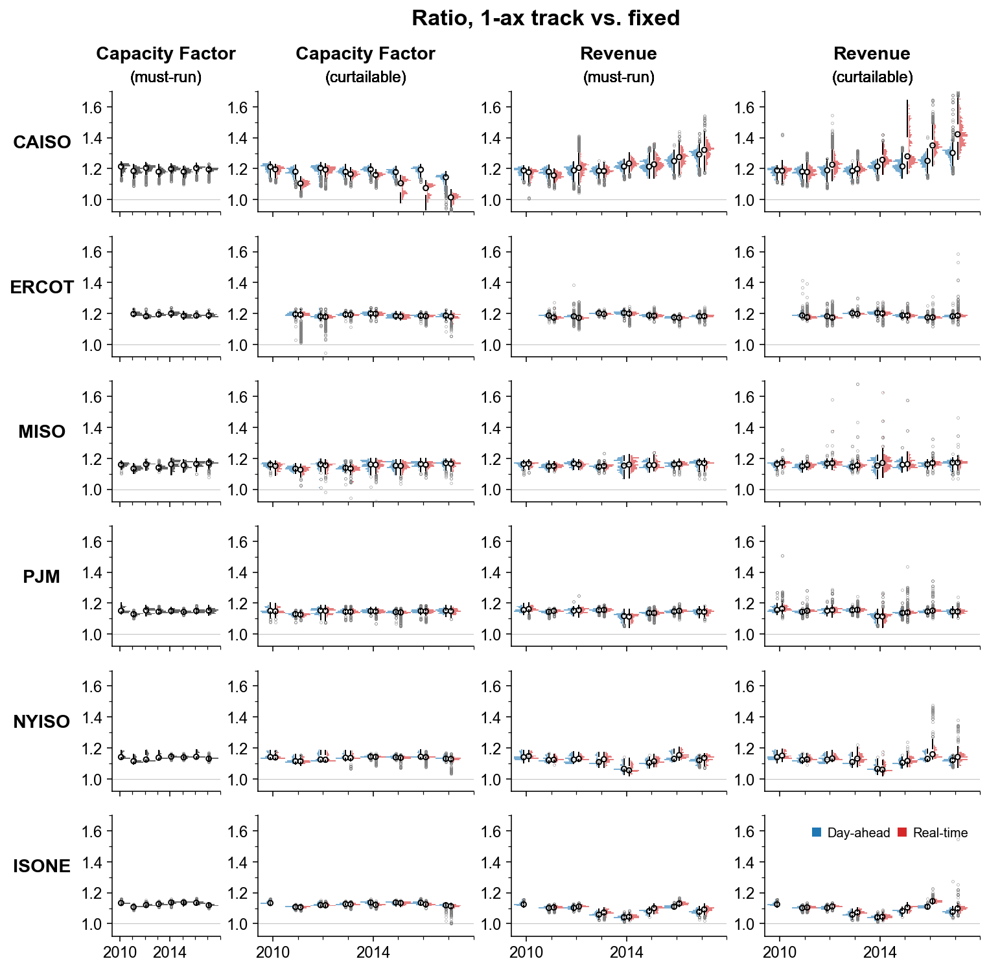

In [28]:
########## Starting absolute values for fixed CF-opt
### Data-indexed parameters
data = [
    'CapacityFactor_track(def)/fixed(optcf)_hist,da,mustrun',
    'CapacityFactor_track(def)/fixed(optcf)_hist,da,curtail,baselinemustrun',
    'CapacityFactor_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun',
    'Revenue_track(def)/fixed(optcf)_hist,da,mustrun',
    'Revenue_track(def)/fixed(optcf)_hist,rt,mustrun',
    'Revenue_track(def)/fixed(optcf)_hist,da,curtail,baselinemustrun',
    'Revenue_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun',
]
colindex = [0, 1, 1, 2, 2, 3, 3]
colindex = dict(zip(data, colindex))
direction = ['right','left','right','left','right','left','right']
direction = dict(zip(data, direction))
color = [mc['tmy'],mc['da'],mc['rt'],mc['da'],mc['rt'],mc['da'],mc['rt']]
color = dict(zip(data, color))
squeeze = [0.7, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35]
squeeze = dict(zip(data, squeeze))

### Column-indexed parameters
ncols = 4
ylim = [
    [0.92, 1.7],
    [0.92, 1.7],
    [0.92, 1.7],
    [0.92, 1.7],
]

ylabel = [
    'Capacity Factor',
    'Capacity Factor',
    'Revenue',
    'Revenue',
]

note = [
    '(must-run)',
    '(curtailable)',
    '(must-run)',
    '(curtailable)',
]
y1 = 1.2   # 1.2 if using note, 1 if not
y2 = 1.07  # 1.07 if using note, 1.05 if not

gridspec_kw = {'width_ratios': [1, 2, 2, 2]}

### Plot it
plt.close()
f,ax = plt.subplots(6,ncols,sharex=True,sharey='col', gridspec_kw=gridspec_kw,
                    figsize=(sum(gridspec_kw['width_ratios'])*12/7, figheight), 
                   )
for row, iso in enumerate(isos):
    for datum in data:
        dfframe = (dfplot.loc[dfplot.ISOwecc==iso]
                   .pivot(index='ISO:Node',columns='yearlmp',values=datum))

        pvvm.plots.plotquarthist(
            ax=ax[(row,colindex[datum])], dfplot=dfframe, bootstrap=bootstrap, density=True,
            histcolor=color[datum], hist_range=ylim[colindex[datum]],
            direction=direction[datum], squeeze=squeeze[datum],
            quartpad=(-0.1 if direction[datum] == 'left' else 0.1),
            histpad=(-0.15 if direction[datum] == 'left' else 0.15),
            # medianmarker='_', mediansize=10, medianfacecolor='k'
        )

### Format axis
for row, iso in enumerate(isos):
    for col in range(ncols):
        ax[(row,0)].set_ylabel(iso, weight='bold', rotation=0, labelpad=30)
        ax[(row,col)].set_xlim(2009.4,2018)
        ### x ticks
        ax[(row,col)].set_xticks([2010,2014])
        ax[(row,col)].set_xticklabels(
            ['2010','2014'], rotation=0, ha='center')
        ax[(row,col)].xaxis.set_minor_locator(AutoMinorLocator(4))
        ### Add title
        ax[(0,col)].set_title(ylabel[col], weight='bold', y=y1, size='x-large')
        ### Add annotation
        ax[(0,col)].annotate(
            note[col], xy=(0.5,1.05), xycoords='axes fraction',
            ha='center', va='bottom', fontsize='large')

        ### Format axis
        ax[(row,col)].set_ylim(*ylim[col])
        ax[(row,col)].yaxis.set_major_locator(MultipleLocator(0.2))
        ax[(row,col)].yaxis.set_minor_locator(AutoMinorLocator(2))
        ax[(row,col)].axhline(1, lw=0.25, c='0.5')
        
pvvm.plots.despine(ax)

### Legend
patches = [
    mpl.patches.Patch(
        facecolor=mc[market], edgecolor='none', 
        label=('Day-ahead' if market == 'da' else 'Real-time'))
    for market in ['da','rt']]
leg = ax[(-1,-1)].legend(
    handles=patches, loc='upper right', frameon=False, ncol=2,
    columnspacing=0.5, handletextpad=0.5, handlelength=0.7,)

# # plt.tight_layout()
## add big axis, hide frame, ticks, and labels
f.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.title('Ratio, 1-ax track vs. fixed', weight='bold', y=y2, fontsize='xx-large')

plt.show()

In [29]:
print('CAISO 2017')
display(dfplot.loc[(dfplot.ISOwecc=='CAISO')&(dfplot.yearlmp==2017),data].describe(percentiles=fractions))
print('median')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].median().unstack('ISOwecc'))
print('max')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].max().unstack('ISOwecc'))
for datum in data:
    print(datum)
    display(dfplot.groupby(['ISOwecc','yearlmp'])[datum].describe(percentiles=fractions).T)

CAISO 2017


,"CapacityFactor_track(def)/fixed(optcf)_hist,da,mustrun","CapacityFactor_track(def)/fixed(optcf)_hist,da,curtail,baselinemustrun","CapacityFactor_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun","Revenue_track(def)/fixed(optcf)_hist,da,mustrun","Revenue_track(def)/fixed(optcf)_hist,rt,mustrun","Revenue_track(def)/fixed(optcf)_hist,da,curtail,baselinemustrun","Revenue_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun"
count,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000
mean,1.190360,1.133019,1.006021,1.283981,1.314155,1.297633,1.447377
std,0.016639,0.032371,0.033595,0.037652,0.052336,0.051749,0.131262
min,1.113813,0.888389,0.856991,1.161767,1.171260,1.166622,1.260330
2.5%,1.144030,1.040829,0.905791,1.194076,1.204142,1.201355,1.298872
25%,1.184059,1.125284,0.995113,1.265940,1.281787,1.275987,1.369893
50%,1.195275,1.144368,1.014365,1.291287,1.321106,1.301618,1.422102
75%,1.200167,1.153055,1.029195,1.308802,1.346624,1.318441,1.489774
97.5%,1.213245,1.164177,1.044061,1.341588,1.401838,1.377570,1.680171
max,1.231872,1.180118,1.061693,1.426787,1.541156,1.889847,2.660819


median


CapacityFactor_track(def)/fixed(optcf)_hist,da,mustrun            \
ISOwecc                                                  CAISO     ERCOT   
yearlmp                                                                    
2010                                              1.213636           NaN   
2011                                              1.184462      1.196981   
2012                                              1.204967      1.181716   
2013                                              1.179953      1.193319   
2014                                              1.198067      1.199874   
2015                                              1.180203      1.184606   
2016                                              1.203699      1.185931   
2017                                              1.195275      1.188038   

                                                             \
ISOwecc     ISONE      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                                       
2010     1.133700  1.158801  1.141078  1.150299         NaN   
2011     1.107946  1.133107  1.114666  1.129048         NaN   
2012     1.120651  1.161251  1.124788  1.152504         NaN   
2013     1.127070  1.139756  1.137081  1.144513         NaN   
2014     1.137230  1.161745  1.143429  1.148970         NaN   
2015     1.137664  1.155334  1.138507  1.143015    1.163519   
2016     1.135127  1.163820  1.142993  1.149273    1.186228   
2017     1.119281  1.169287  1.130560  1.150807    1.182490   

        CapacityFactor_track(def)/fixed(optcf)_hist,da,curtail,baselinemustrun  \
ISOwecc                                                                  CAISO   
yearlmp                                                                          
2010                                              1.211987                       
2011                                              1.180264                       
2012                                              1.204051                       
2013                                              1.179298                       
2014                                              1.194885                       
2015                                              1.178015                       
2016                                              1.193439                       
2017                                              1.144368                       

                                                                       \
ISOwecc     ERCOT     ISONE      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                                                 
2010          NaN  1.133700  1.158801  1.141078  1.149981         NaN   
2011     1.194612  1.107946  1.132935  1.114666  1.128915         NaN   
2012     1.180981  1.120549  1.161177  1.124788  1.151963         NaN   
2013     1.193181  1.127025  1.138335  1.136634  1.144482         NaN   
2014     1.199732  1.137230  1.159924  1.143429  1.148854         NaN   
2015     1.184385  1.137359  1.152007  1.138507  1.142780    1.163519   
2016     1.185682  1.135127  1.162919  1.142993  1.148988    1.182417   
2017     1.186584  1.119269  1.169110  1.130560  1.150511    1.121469   

        CapacityFactor_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun  \
ISOwecc                                                                  CAISO   
yearlmp                                                                          
2010                                              1.195654                       
2011                                              1.104376                       
2012                                              1.193566                       
2013                                              1.164574                       
2014                                              1.159494                       
2015                                              1.105928                       
2016                            

max


CapacityFactor_track(def)/fixed(optcf)_hist,da,mustrun            \
ISOwecc                                                  CAISO     ERCOT   
yearlmp                                                                    
2010                                              1.245073           NaN   
2011                                              1.228367      1.230489   
2012                                              1.238126      1.229003   
2013                                              1.224838      1.219486   
2014                                              1.233165      1.237561   
2015                                              1.215767      1.212615   
2016                                              1.236797      1.213154   
2017                                              1.231872      1.225060   

                                                             \
ISOwecc     ISONE      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                                       
2010     1.162213  1.180655  1.182804  1.200101         NaN   
2011     1.125571  1.164497  1.158220  1.156490         NaN   
2012     1.150921  1.196338  1.185203  1.185883         NaN   
2013     1.147316  1.191306  1.182401  1.180713         NaN   
2014     1.161359  1.200816  1.168225  1.171282         NaN   
2015     1.158233  1.189473  1.165617  1.167475    1.192918   
2016     1.164883  1.199435  1.187438  1.185426    1.222750   
2017     1.137418  1.194131  1.169199  1.183058    1.210316   

        CapacityFactor_track(def)/fixed(optcf)_hist,da,curtail,baselinemustrun  \
ISOwecc                                                                  CAISO   
yearlmp                                                                          
2010                                              1.243720                       
2011                                              1.224192                       
2012                                              1.238126                       
2013                                              1.224838                       
2014                                              1.230139                       
2015                                              1.213018                       
2016                                              1.226526                       
2017                                              1.180118                       

                                                                       \
ISOwecc     ERCOT     ISONE      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                                                 
2010          NaN  1.162213  1.180655  1.182804  1.200101         NaN   
2011     1.230489  1.125571  1.164497  1.158220  1.156490         NaN   
2012     1.229003  1.150921  1.195794  1.185203  1.185883         NaN   
2013     1.219486  1.147316  1.186844  1.182401  1.180713         NaN   
2014     1.237561  1.161359  1.200327  1.168225  1.171282         NaN   
2015     1.212615  1.158233  1.189473  1.165617  1.167475    1.192918   
2016     1.213154  1.164883  1.199435  1.187438  1.185426    1.222284   
2017     1.225060  1.137418  1.194131  1.169199  1.183058    1.158565   

        CapacityFactor_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun  \
ISOwecc                                                                  CAISO   
yearlmp                                                                          
2010                                              1.226578                       
2011                                              1.145995                       
2012                                              1.230224                       
2013                                              1.204673                       
2014                                              1.192237                       
2015                                              1.154679                       
2016                            

CapacityFactor_track(def)/fixed(optcf)_hist,da,mustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        1.205674     1.182921     1.199947     1.179000     1.195210   
std         0.024422     0.023558     0.021722     0.019730     0.018567   
min         1.121335     1.087633     1.091697     1.101150     1.118839   
2.5%        1.143506     1.124217     1.141994     1.130434     1.146722   
25%         1.189496     1.171526     1.189998     1.169169     1.188757   
50%         1.213636     1.184462     1.204967     1.179953     1.198067   
75%         1.223951     1.202201     1.215094     1.193146     1.207661   
97.5%       1.237011     1.216968     1.227870     1.211240     1.222818   
max         1.245073     1.228367     1.238126     1.224838     1.233165   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        1.178027     1.197063     1.190360     1.197914     1.183841   
std         0.020008     0.019118     0.016639     0.010385     0.009552   
min         1.097817     1.126527     1.113813     1.177764     1.168385   
2.5%        1.128067     1.143370     1.144030     1.182810     1.171761   
25%         1.169328     1.187897     1.184059     1.189325     1.175997   
50%         1.180203     1.203699     1.195275     1.196981     1.181716   
75%         1.192561     1.209913     1.200167     1.205482     1.190184   
97.5%       1.207223     1.222281     1.213245     1.220786     1.202480   
max         1.215767     1.236797     1.231872     1.230489     1.229003   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        1.194293     1.199710     1.184308     1.186799     1.188641   
std         0.006582     0.009706     0.010552     0.007280     0.010146   
min         1.180782     1.175886     1.163198     1.170989     1.168906   
2.5%        1.184687     1.183169     1.168423     1.174768     1.173613   
25%         1.189014     1.191575     1.174682     1.181693     1.179739   
50%         1.193319     1.199874     1.184606     1.185931     1.188038   
75%         1.198580     1.206984     1.191806     1.190603     1.196341   
97.5%       1.207922     1.216214     1.204522     1.204361     1.208362   
max         1.219486     1.237561     1.212615     1.213154     1.225060   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       1.136201    1.107736    1.122396    1.127026    1.134952   
std        0.008307    0.006472    0.007869    0.007290    0.009585   
min        1.121885    1.085560    1.106063    1.105548    1.105512   
2.5%       1.126297    1.090317    1.110608    1.110233    1.110364   
25%        1.130547    1.105556    1.117207    1.123158    1.130355   
50%        1.133700    1.107946    1.120651    1.127070    1.137230   
75%        1.138461    1.111079    1.125147    1.130902    1.140678   
97.5%      1.158043    1.119779    1.140370    1.143867    1.148652   
max        1.162213    1.125571    1.150921    1.147316    1.161359   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       1.135156    1.135737    1.119598    1.156711    1.133030   
std        0.007628    0.006774    0.006926    0.013750    0.012781   
min        1.115861    1.122775    1.099711    1.1046

CapacityFactor_track(def)/fixed(optcf)_hist,da,curtail,baselinemustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        1.204529     1.179162     1.199145     1.178703     1.191829   
std         0.024238     0.023983     0.022216     0.019625     0.018371   
min         1.120788     1.079850     1.085268     1.100658     1.114405   
2.5%        1.143038     1.121569     1.141994     1.130434     1.143149   
25%         1.188635     1.167883     1.189242     1.168829     1.185477   
50%         1.211987     1.180264     1.204051     1.179298     1.194885   
75%         1.222805     1.198484     1.214829     1.192373     1.204099   
97.5%       1.235927     1.214099     1.227146     1.210526     1.218021   
max         1.243720     1.224192     1.238126     1.224838     1.230139   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        1.174915     1.188556     1.133019     1.195355     1.182805   
std         0.019282     0.021344     0.032371     0.010971     0.012465   
min         1.097817     1.111950     0.888389     1.028827     0.884082   
2.5%        1.128067     1.138832     1.040829     1.179028     1.171048   
25%         1.166079     1.177383     1.125284     1.188061     1.175513   
50%         1.178015     1.193439     1.144368     1.194612     1.180981   
75%         1.189843     1.204682     1.153055     1.202788     1.189247   
97.5%       1.200216     1.215746     1.164177     1.213279     1.201280   
max         1.213018     1.226526     1.180118     1.230489     1.229003   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        1.194073     1.199351     1.184094     1.186263     1.187475   
std         0.006744     0.009927     0.010498     0.007767     0.011217   
min         1.149327     1.151961     1.161977     1.137293     1.081241   
2.5%        1.184064     1.181719     1.168358     1.173434     1.171708   
25%         1.188836     1.191522     1.174580     1.180944     1.178372   
50%         1.193181     1.199732     1.184385     1.185682     1.186584   
75%         1.198355     1.206737     1.191586     1.190224     1.196128   
97.5%       1.207819     1.216173     1.204424     1.204218     1.208354   
max         1.219486     1.237561     1.212615     1.213154     1.225060   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       1.136169    1.107723    1.122338    1.127000    1.134916   
std        0.008340    0.006504    0.007883    0.007305    0.009581   
min        1.121885    1.085560    1.106063    1.105548    1.105512   
2.5%       1.125724    1.090036    1.109693    1.110233    1.110364   
25%        1.130547    1.105556    1.117207    1.123158    1.130355   
50%        1.133700    1.107946    1.120549    1.127025    1.137230   
75%        1.138408    1.111079    1.124892    1.130902    1.140543   
97.5%      1.158043    1.119779    1.140370    1.143867    1.148652   
max        1.162213    1.125571    1.150921    1.147316    1.161359   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       1.134973    1.135636    1.118875    1.156011    1.132513   
std        0.007684    0.006713    0.009343    0.014672    0.013208   
min        1.115861    1.122775    1.017208    1.0903

CapacityFactor_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        1.189025     1.102366     1.188702     1.163206     1.155698   
std         0.026140     0.020379     0.022798     0.018983     0.017148   
min         0.871278     1.023426     1.069489     1.082929     1.075824   
2.5%        1.132671     1.052230     1.133768     1.117694     1.107624   
25%         1.175651     1.091149     1.176971     1.152902     1.149150   
50%         1.195654     1.104376     1.193566     1.164574     1.159494   
75%         1.206106     1.117134     1.205331     1.177460     1.166578   
97.5%       1.218310     1.134244     1.217099     1.192547     1.179406   
max         1.226578     1.145995     1.230224     1.204673     1.192237   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        1.088590     1.058886     1.006021     1.181391     1.174879   
std         0.045331     0.037954     0.033595     0.038733     0.020365   
min         0.980093     0.934079     0.856991     1.012902     0.946214   
2.5%        1.005251     0.987883     0.905791     1.056149     1.118297   
25%         1.044745     1.025620     0.995113     1.184190     1.172192   
50%         1.105928     1.074811     1.014365     1.192087     1.177798   
75%         1.127535     1.092994     1.029195     1.200978     1.184322   
97.5%       1.147901     1.104884     1.044061     1.212859     1.198513   
max         1.154679     1.123683     1.061693     1.230082     1.228479   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        1.191812     1.197810     1.181147     1.180402     1.177827   
std         0.007400     0.010150     0.011277     0.011917     0.022690   
min         1.112109     1.149868     1.156994     1.122016     0.871683   
2.5%        1.179045     1.180961     1.162550     1.143031     1.126560   
25%         1.187320     1.189981     1.170801     1.177701     1.172594   
50%         1.191959     1.198316     1.181195     1.183031     1.179426   
75%         1.196060     1.205163     1.190367     1.186929     1.193776   
97.5%       1.206055     1.215055     1.201354     1.195658     1.204638   
max         1.218594     1.235745     1.209214     1.210166     1.217070   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    1.106136    1.120949    1.125358    1.120891    1.131402   
std       NaN    0.006360    0.007996    0.008030    0.008113    0.007740   
min       NaN    1.083449    1.104467    1.095355    1.095401    1.111452   
2.5%      NaN    1.089282    1.107922    1.105428    1.099485    1.114434   
25%       NaN    1.103920    1.115506    1.121701    1.118043    1.126284   
50%       NaN    1.106373    1.119231    1.125867    1.122012    1.133806   
75%       NaN    1.109600    1.123784    1.129315    1.125343    1.136998   
97.5%     NaN    1.117626    1.139319    1.142357    1.132611    1.141159   
max       NaN    1.123325    1.149848    1.145687    1.147052    1.154194   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       1.125259    1.110617    1.147151    1.122249    1.145595   
std        0.007204    0.015917    0.019018    0.023

Revenue_track(def)/fixed(optcf)_hist,da,mustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        1.181917     1.178839     1.185226     1.183955     1.214425   
std         0.022381     0.023081     0.026295     0.020538     0.022739   
min         1.110268     1.085192     1.069278     1.104117     1.132645   
2.5%        1.126661     1.120422     1.126192     1.135459     1.161462   
25%         1.167852     1.167889     1.168783     1.173048     1.202742   
50%         1.188600     1.179614     1.188976     1.184977     1.213929   
75%         1.199382     1.196324     1.205633     1.200130     1.232974   
97.5%       1.211921     1.213284     1.224514     1.215376     1.251071   
max         1.218533     1.224095     1.243719     1.252418     1.261841   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        1.215919     1.244379     1.283981     1.187774     1.182895   
std         0.030419     0.031715     0.037652     0.008695     0.012378   
min         1.140847     1.139030     1.161767     1.140965     1.117358   
2.5%        1.157936     1.161781     1.194076     1.172540     1.169058   
25%         1.195185     1.224837     1.265940     1.182747     1.178228   
50%         1.213394     1.248827     1.291287     1.186917     1.181531   
75%         1.241071     1.266993     1.308802     1.191289     1.185908   
97.5%       1.265296     1.296627     1.341588     1.210202     1.204802   
max         1.338387     1.355752     1.426787     1.230381     1.384686   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        1.202573     1.202635     1.187485     1.174135     1.181507   
std         0.005544     0.009585     0.007014     0.005457     0.007369   
min         1.178982     1.152874     1.165554     1.144097     1.138525   
2.5%        1.194072     1.183727     1.175063     1.163306     1.168623   
25%         1.198743     1.195959     1.182244     1.171368     1.177249   
50%         1.201803     1.203752     1.187814     1.174446     1.181682   
75%         1.205589     1.209090     1.192114     1.177406     1.185309   
97.5%       1.214694     1.219197     1.201028     1.183961     1.197186   
max         1.223727     1.233995     1.210145     1.191988     1.218830   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       1.127146    1.101453    1.103054    1.060832    1.041260   
std        0.009825    0.008149    0.008444    0.014137    0.010555   
min        1.108089    1.073062    1.078627    1.022068    1.009493   
2.5%       1.113803    1.078222    1.086865    1.029663    1.018334   
25%        1.120303    1.099305    1.097383    1.052952    1.036918   
50%        1.124925    1.101876    1.102166    1.058814    1.041229   
75%        1.131823    1.105781    1.108163    1.069954    1.047729   
97.5%      1.154044    1.115509    1.121290    1.088744    1.059851   
max        1.155768    1.123286    1.129567    1.092672    1.078632   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       1.076714    1.109886    1.076873    1.157579    1.147464   
std        0.011574    0.007588    0.013086    0.016710    0.013108   
min        1.045780    1.095654    1.028590    1.0931

Revenue_track(def)/fixed(optcf)_hist,rt,mustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        1.169654     1.154341     1.208358     1.184296     1.233457   
std         0.024551     0.021519     0.054546     0.023076     0.026786   
min         1.006985     1.071476     1.042955     1.091650     1.147781   
2.5%        1.109924     1.105358     1.114778     1.131957     1.173938   
25%         1.153125     1.142573     1.174226     1.172601     1.217273   
50%         1.177229     1.155977     1.205031     1.184263     1.233573   
75%         1.187771     1.170526     1.229244     1.199650     1.252196   
97.5%       1.200277     1.188287     1.359989     1.225336     1.283092   
max         1.209193     1.197676     1.413043     1.243834     1.300952   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        1.231424     1.270990     1.314155     1.173679     1.173916   
std         0.035793     0.042620     0.052336     0.008318     0.016602   
min         1.140549     1.153979     1.171260     1.142763     1.096398   
2.5%        1.157547     1.178197     1.204142     1.159496     1.142274   
25%         1.208121     1.241875     1.281787     1.168915     1.167611   
50%         1.227655     1.274670     1.321106     1.173355     1.171462   
75%         1.257081     1.296987     1.346624     1.177926     1.176793   
97.5%       1.299632     1.348842     1.401838     1.188946     1.216728   
max         1.361951     1.438653     1.541156     1.271035     1.275370   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        1.196387     1.197151     1.185748     1.171324     1.182024   
std         0.006015     0.012716     0.011086     0.007551     0.010428   
min         1.173103     1.120406     1.144171     1.117077     1.126516   
2.5%        1.184788     1.168424     1.165726     1.155328     1.159218   
25%         1.192499     1.190561     1.178280     1.168170     1.177065   
50%         1.196311     1.199399     1.185337     1.172251     1.182709   
75%         1.200201     1.205410     1.191938     1.175402     1.186882   
97.5%       1.208436     1.214098     1.208614     1.184376     1.201019   
max         1.230533     1.246152     1.241951     1.198710     1.242655   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    1.104696    1.112299    1.072420    1.046171    1.095428   
std       NaN    0.009310    0.008191    0.015197    0.010893    0.013029   
min       NaN    1.074328    1.085771    1.023092    1.017849    1.063995   
2.5%      NaN    1.079061    1.093316    1.034982    1.024174    1.069512   
25%       NaN    1.101979    1.108413    1.066753    1.039922    1.084421   
50%       NaN    1.105066    1.111289    1.072903    1.044929    1.100862   
75%       NaN    1.110385    1.116882    1.081059    1.053966    1.105559   
97.5%     NaN    1.118901    1.128558    1.097478    1.066718    1.111466   
max       NaN    1.127995    1.136601    1.100520    1.087814    1.129040   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       1.131191    1.089367    1.160614    1.148633    1.158114   
std        0.008582    0.018026    0.015180    0.012

Revenue_track(def)/fixed(optcf)_hist,da,curtail,baselinemustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        1.182043     1.179648     1.186015     1.184061     1.214618   
std         0.022436     0.022878     0.026940     0.020555     0.022758   
min         1.110286     1.089072     1.072294     1.104159     1.132682   
2.5%        1.126724     1.120590     1.126192     1.135459     1.161889   
25%         1.167908     1.169092     1.168796     1.173148     1.202881   
50%         1.188673     1.180388     1.189432     1.184996     1.214147   
75%         1.199501     1.196914     1.206448     1.200204     1.233217   
97.5%       1.211997     1.214114     1.232054     1.215376     1.251221   
max         1.218605     1.225300     1.266654     1.252573     1.261857   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        1.216763     1.246307     1.297633     1.188637     1.183512   
std         0.030341     0.033055     0.051749     0.011987     0.021364   
min         1.140847     1.139030     1.166622     1.166298     1.121188   
2.5%        1.158449     1.161781     1.201355     1.174043     1.169548   
25%         1.196596     1.225445     1.275987     1.183082     1.178367   
50%         1.214550     1.250143     1.301618     1.187117     1.181629   
75%         1.241513     1.269006     1.318441     1.191564     1.186251   
97.5%       1.266347     1.301310     1.377570     1.210589     1.205101   
max         1.338387     1.407147     1.889847     1.413759     1.904386   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        1.202692     1.203048     1.187615     1.174828     1.182178   
std         0.005614     0.010297     0.007131     0.006827     0.008244   
min         1.179144     1.152874     1.165554     1.144097     1.138525   
2.5%        1.194238     1.183727     1.175075     1.164058     1.169017   
25%         1.198796     1.196061     1.182304     1.171603     1.177390   
50%         1.201955     1.203867     1.187864     1.174605     1.181987   
75%         1.205655     1.209477     1.192135     1.177604     1.185677   
97.5%       1.215214     1.220971     1.201152     1.186844     1.199451   
max         1.225089     1.272803     1.218542     1.249642     1.266207   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       1.127156    1.101453    1.103063    1.060845    1.041266   
std        0.009816    0.008149    0.008451    0.014137    0.010559   
min        1.108089    1.073062    1.078627    1.022068    1.009493   
2.5%       1.113803    1.078222    1.086865    1.029663    1.018334   
25%        1.120303    1.099305    1.097383    1.052953    1.036918   
50%        1.124925    1.101876    1.102182    1.058814    1.041229   
75%        1.131823    1.105781    1.108163    1.070366    1.047729   
97.5%      1.154044    1.115509    1.121290    1.088744    1.059851   
max        1.155768    1.123286    1.129567    1.092672    1.078632   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       1.076749    1.109920    1.077146    1.157944    1.147570   
std        0.011565    0.007752    0.014352    0.016670    0.013128   
min        1.045806    1.095654    1.034497    1.0931

Revenue_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        1.178439     1.177863     1.232668     1.200964     1.264744   
std         0.027015     0.030475     0.057318     0.028671     0.037703   
min         1.100273     1.084651     1.121712     1.111368     1.163002   
2.5%        1.117229     1.115872     1.148914     1.148406     1.195190   
25%         1.159752     1.159195     1.194247     1.186304     1.239815   
50%         1.186409     1.178076     1.225690     1.197539     1.257045   
75%         1.197607     1.195866     1.250536     1.214697     1.292704   
97.5%       1.210492     1.236665     1.391501     1.268023     1.347535   
max         1.423716     1.302028     1.544809     1.317285     1.418395   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        1.329904     1.364294     1.447377     1.179093     1.178177   
std         0.108091     0.070678     0.131262     0.014328     0.017017   
min         1.167293     1.218189     1.260330     1.151498     1.122557   
2.5%        1.203775     1.237562     1.298872     1.163267     1.157703   
25%         1.245347     1.321760     1.369893     1.171484     1.169235   
50%         1.279313     1.349841     1.422102     1.175964     1.173431   
75%         1.408467     1.391693     1.489774     1.182898     1.181590   
97.5%       1.582260     1.520961     1.680171     1.210388     1.227332   
max         1.639772     1.834946     2.660819     1.392086     1.282667   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        1.198053     1.198947     1.188937     1.175484     1.190139   
std         0.008258     0.013661     0.014106     0.011341     0.023930   
min         1.178177     1.121664     1.144595     1.117327     1.126555   
2.5%        1.186528     1.174288     1.167959     1.157496     1.162582   
25%         1.193315     1.192022     1.180092     1.170818     1.179665   
50%         1.197066     1.200431     1.187207     1.174532     1.185653   
75%         1.201352     1.206795     1.194422     1.178572     1.196103   
97.5%       1.216783     1.219348     1.226082     1.198987     1.236174   
max         1.299695     1.277193     1.269242     1.310014     1.584219   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    1.104925    1.112464    1.072453    1.046351    1.099406   
std       NaN    0.009608    0.008220    0.015134    0.010889    0.012958   
min       NaN    1.074328    1.085787    1.023394    1.018355    1.069441   
2.5%      NaN    1.079061    1.093329    1.035135    1.024595    1.073440   
25%       NaN    1.101979    1.108559    1.066753    1.040034    1.088374   
50%       NaN    1.105148    1.111668    1.072903    1.044991    1.104563   
75%       NaN    1.110620    1.117304    1.081059    1.054111    1.109681   
97.5%     NaN    1.121525    1.128558    1.097478    1.066789    1.115263   
max       NaN    1.134053    1.136601    1.100520    1.087872    1.133987   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       1.146547    1.099272    1.168344    1.155910    1.172304   
std        0.011298    0.024892    0.019234    0.015

## Orientation optimization, fixed-tilt

### Orientation

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid 

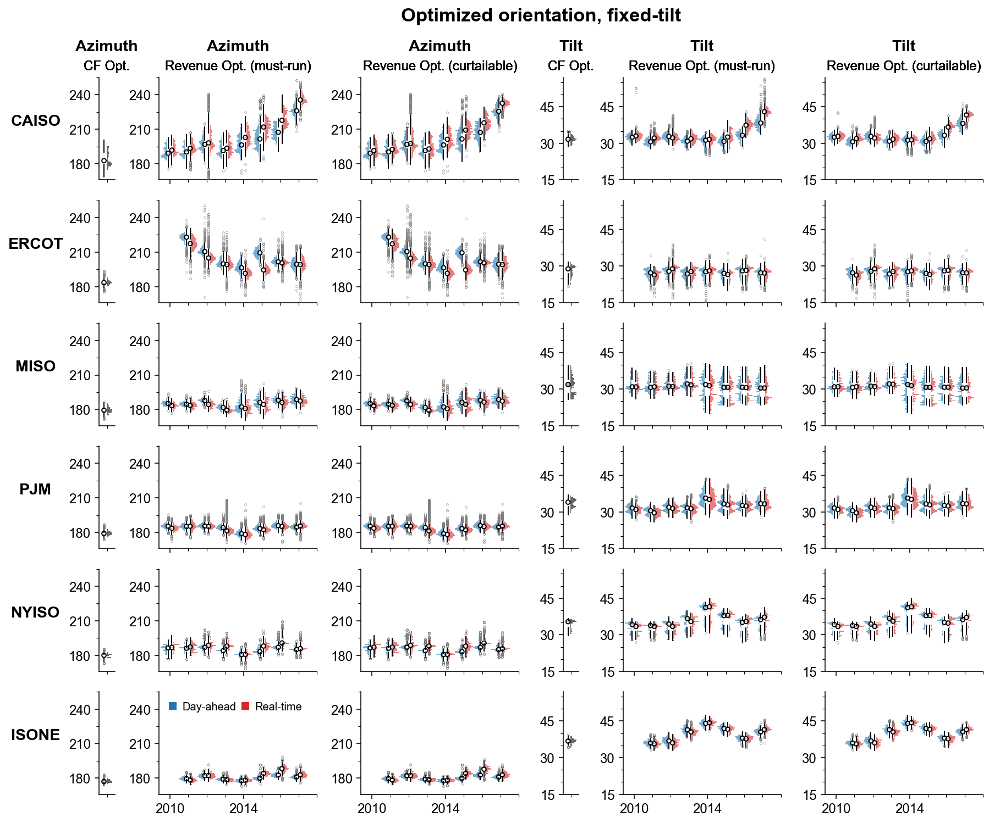

In [31]:
########## Starting absolute values for track CF-opt
### Data-indexed parameters
data = [
    'OptCF_Azimuth(da)(mustrun)',
    'OptRev_Azimuth(da)(mustrun)',
    'OptRev_Azimuth(rt)(mustrun)',
    'OptRev_Azimuth(da)(curtail)',
    'OptRev_Azimuth(rt)(curtail)',
    'OptCF_Tilt(da)(mustrun)',
    'OptRev_Tilt(da)(mustrun)',
    'OptRev_Tilt(rt)(mustrun)',
    'OptRev_Tilt(da)(curtail)',
    'OptRev_Tilt(rt)(curtail)',
]
colindex = [0, 1, 1, 2, 2, 3, 4, 4, 5, 5,]
colindex = dict(zip(data, colindex))
direction = ['right','left','right','left','right',
             'right','left','right','left','right',]
direction = dict(zip(data, direction))
color = [mc['tmy'],mc['da'],mc['rt'],mc['da'],mc['rt'],
         mc['tmy'],mc['da'],mc['rt'],mc['da'],mc['rt'],]
color = dict(zip(data, color))
squeeze = [0.7, 0.35, 0.35, 0.35, 0.35, 
           0.7, 0.35, 0.35, 0.35, 0.35,]
squeeze = dict(zip(data, squeeze))
plotcols = [[2011,2017],slice(None),slice(None),slice(None),slice(None),
            [2011,2017],slice(None),slice(None),slice(None),slice(None),]
plotcols = dict(zip(data, plotcols))

### Column-indexed parameters
ylim = [
    [166, 255],
    [166, 255],
    [166, 255],
    [15, 57],
    [15, 57],
    [15, 57],
]
xlim = [
    [2017, 2018.9],
    [2009.4, 2018],
    [2009.4, 2018],
    [2017, 2018.9],
    [2009.4, 2018],
    [2009.4, 2018],
]

majlocs = [30, 30, 30, 15, 15, 15, ]
minlocs = [2, 2, 2, 3, 3, 3, ]

ylabel = [
    'Azimuth',
    'Azimuth',
    'Azimuth',
    'Tilt',
    'Tilt',
    'Tilt',
]

note = [
    'CF Opt.',
    'Revenue Opt. (must-run)',
    'Revenue Opt. (curtailable)',
    'CF Opt.',
    'Revenue Opt. (must-run)',
    'Revenue Opt. (curtailable)',
]
y1 = 1.2     # 1.2 if using note,  1 if no note
y2 = 1.07  # 1.07 if using note, 1.04 if no note

gridspec_kw = {'width_ratios': [0.2, 2, 2, 0.2, 2, 2,], 'wspace':0.4}
ncols = len(gridspec_kw['width_ratios'])

### Plot it
plt.close()
f,ax = plt.subplots(6,ncols,sharex='col',sharey=False, gridspec_kw=gridspec_kw,
                    figsize=(sum(gridspec_kw['width_ratios'])*12/7, figheight), 
                   )
for row, iso in enumerate(isos):
    for datum in data:
        dfframe = (dfplot.loc[dfplot.ISOwecc==iso]
                   .pivot(index='ISO:Node',columns='yearlmp',values=datum))

        pvvm.plots.plotquarthist(
            ax=ax[(row,colindex[datum])], dfplot=dfframe[plotcols[datum]], 
            density=True, bootstrap=bootstrap, 
            histcolor=color[datum], hist_range=ylim[colindex[datum]],
            direction=direction[datum], squeeze=squeeze[datum],
            quartpad=(-0.1 if direction[datum] == 'left' else 0.1),
            histpad=(-0.15 if direction[datum] == 'left' else 0.15),
            format_axes=False,
        )

### Format axis
for row, iso in enumerate(isos):
    for col in range(ncols):
        ax[(row,0)].set_ylabel(iso, weight='bold', rotation=0, labelpad=30)
        ### x ticks
        ax[(row,col)].set_xticks([2010,2014])
        ax[(row,col)].set_xticklabels(
            ['2010','2014'], rotation=0, ha='center')
        ax[(row,col)].xaxis.set_minor_locator(AutoMinorLocator(4))
        ax[(row,col)].set_xlim(*xlim[col])
        ### Add title
        ax[(0,col)].set_title(ylabel[col], weight='bold', y=y1, size='x-large')
        ### Add annotation
        ax[(0,col)].annotate(
            note[col], xy=(0.5,1.05), xycoords='axes fraction',
            ha='center', va='bottom', fontsize='large')

        ### Format axis
        ax[(row,col)].set_ylim(*ylim[col])
        ax[(row,col)].yaxis.set_major_locator(MultipleLocator(majlocs[col]))
        ax[(row,col)].yaxis.set_minor_locator(AutoMinorLocator(minlocs[col]))
pvvm.plots.despine(ax)

### Legend
patches = [
    mpl.patches.Patch(
        facecolor=mc[market], edgecolor='none', 
        label=('Day-ahead' if market == 'da' else 'Real-time'))
    for market in ['da','rt']]
leg = ax[(-1,1)].legend(
    handles=patches, loc='upper left', frameon=False, ncol=2,
    columnspacing=0.5, handletextpad=0.5, handlelength=0.7,)

# plt.tight_layout()
## add big axis, hide frame, ticks, and labels
f.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.title('Optimized orientation, fixed-tilt', weight='bold', y=y2, fontsize='xx-large')

plt.show()

In [32]:
print('CAISO 2017')
display(dfplot.loc[(dfplot.ISOwecc=='CAISO')&(dfplot.yearlmp==2017),data].describe(percentiles=fractions))
print('median')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].median().unstack('ISOwecc'))
print('max')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].max().unstack('ISOwecc'))
for datum in data:
    print(datum)
    display(dfplot.groupby(['ISOwecc','yearlmp'])[datum].describe(percentiles=fractions).T)

CAISO 2017


,OptCF_Azimuth(da)(mustrun),OptRev_Azimuth(da)(mustrun),OptRev_Azimuth(rt)(mustrun),OptRev_Azimuth(da)(curtail),OptRev_Azimuth(rt)(curtail),OptCF_Tilt(da)(mustrun),OptRev_Tilt(da)(mustrun),OptRev_Tilt(rt)(mustrun),OptRev_Tilt(da)(curtail),OptRev_Tilt(rt)(curtail)
count,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000
mean,184.613530,226.312989,235.799180,225.792479,232.223856,31.610307,38.497415,43.217181,38.182560,41.462049
std,6.331337,4.734833,4.071666,4.426137,3.020238,1.174554,2.353140,2.082641,2.079906,1.433022
min,168.368400,208.259400,217.818500,208.126500,220.084200,28.692800,33.719100,36.953700,33.660700,36.362300
2.5%,174.967700,216.834040,228.288700,216.572060,224.933360,29.244100,34.734680,39.646380,34.612200,38.203560
25%,179.521200,223.327900,233.398800,222.908900,230.699200,30.914800,36.984000,42.116600,36.800200,40.743900
50%,182.658700,225.990800,235.445400,225.556900,232.543000,31.662200,38.299300,42.938400,38.111600,41.635800
75%,189.929100,229.231100,238.293600,228.674800,234.236400,32.408300,39.873100,44.184700,39.579600,42.374400
97.5%,196.117200,236.494540,244.089680,234.468600,237.494700,33.732000,43.654320,47.713800,42.293100,43.948660
max,200.324200,252.511100,258.640800,238.814700,240.760500,35.208800,53.609600,57.927100,46.326700,45.690200


median


OptCF_Azimuth(da)(mustrun)                                   \
ISOwecc                      CAISO      ERCOT      ISONE       MISO   
yearlmp                                                               
2010                     182.85950        NaN        NaN  180.02020   
2011                     182.85950  183.48340  177.10000  179.93855   
2012                     182.85950  183.49160  177.10000  179.93670   
2013                     182.85950  183.48340  177.16770  179.93215   
2014                     182.70765  183.48340  177.10920  179.51770   
2015                     182.65870  183.47325  177.11885  179.51770   
2016                     182.65870  183.48060  177.11780  179.31965   
2017                     182.65870  183.47780  177.08580  179.33225   

                                         OptRev_Azimuth(da)(mustrun)  \
ISOwecc      NYISO       PJM WECC -CAISO                       CAISO   
yearlmp                                                                
2010     179.97350  178.9469         NaN                   189.09155   
2011     179.94565  178.9633         NaN                   190.22680   
2012     179.91780  179.0359         NaN                   196.83100   
2013     179.91780  179.0237         NaN                   191.41150   
2014     179.94565  179.0239         NaN                   196.28360   
2015     179.91780  179.0239    176.6678                   201.51140   
2016     179.94565  179.0576    175.6269                   207.35340   
2017     179.94565  179.0587    178.4129                   225.99080   

                                                                          \
ISOwecc      ERCOT     ISONE       MISO      NYISO       PJM WECC -CAISO   
yearlmp                                                                    
2010           NaN       NaN  185.20700  186.38850  185.3944         NaN   
2011     222.96080  179.4847  184.63325  186.09170  185.2421         NaN   
2012     210.42100  182.1204  187.71980  186.86535  185.5009         NaN   
2013     199.81260  179.0987  181.78220  183.99810  184.0627         NaN   
2014     196.34470  177.7055  182.22825  180.56500  178.7690         NaN   
2015     209.39860  179.8746  186.17940  183.08700  183.3174   189.10480   
2016     201.53365  182.6667  188.13190  186.87060  185.8379   197.75705   
2017     199.45370  181.0400  188.64090  185.01690  184.5971   217.38150   

        OptRev_Azimuth(rt)(mustrun)                                   \
ISOwecc                       CAISO      ERCOT      ISONE       MISO   
yearlmp                                                                
2010                       191.8876        NaN        NaN  183.34080   
2011                       193.4248  217.39130  178.30520  183.51755   
2012                       198.1356  204.87860  182.16800  184.37420   
2013                       193.4898  199.14450  178.59320  179.33340   
2014                       202.8121  191.54400  178.20565  180.79725   
2015                       211.9209  194.44200  184.20400  184.39200   
2016                       217.7250  200.52335  188.29590  186.10000   
2017                       235.4454  199.09790  182.82960  187.34370   

                                          OptRev_Azimuth(da)(curtail)  \
ISOwecc      NYISO        PJM WECC -CAISO                       CAISO   
yearlmp                                                                 
2010     186.80150  183.57140         NaN                   189.08495   
2011     187.17415  185.31665         NaN                   190.22520   
2012     188.62590  185.24380         NaN                   196.79485   
2013     187.91875  181.24930         NaN                   191.41150   
2014     180.78495  178.14510         NaN                   196.28735   
2015     187.98720  182.20400    184.5094                   201.50190   
2016     190.67270  185.04970    209.5976                   207.22050   
2017     185.71100  185.55055    235.9535                   225.55690   


max


OptCF_Azimuth(da)(mustrun)                                        \
ISOwecc                      CAISO    ERCOT     ISONE     MISO     NYISO   
yearlmp                                                                    
2010                      200.3242      NaN       NaN  186.815  185.7652   
2011                      200.3242  193.924  182.2855  186.815  185.7652   
2012                      200.3242  193.924  182.2855  186.815  185.7652   
2013                      200.3242  193.924  183.5227  186.815  185.7652   
2014                      200.3242  193.924  183.5227  186.815  185.7652   
2015                      200.3242  193.924  183.5227  186.815  185.7652   
2016                      200.3242  193.924  183.5227  186.815  185.7652   
2017                      200.3242  193.924  183.5227  186.815  185.7652   

                              OptRev_Azimuth(da)(mustrun)                      \
ISOwecc       PJM WECC -CAISO                       CAISO     ERCOT     ISONE   
yearlmp                                                                         
2010     187.0084         NaN                    203.0964       NaN       NaN   
2011     187.0084         NaN                    205.2315  237.6268  185.3909   
2012     187.0084         NaN                    214.7674  250.4336  187.4748   
2013     187.0084         NaN                    206.9637  227.3251  184.7187   
2014     187.0084         NaN                    214.3079  209.5750  182.2823   
2015     187.0084    195.0602                    236.0143  221.9458  191.6743   
2016     187.0084    195.0602                    219.2098  221.9569  189.9027   
2017     187.0084    196.7155                    252.5111  215.9665  189.9117   

                                                  OptRev_Azimuth(rt)(mustrun)  \
ISOwecc      MISO     NYISO       PJM WECC -CAISO                       CAISO   
yearlmp                                                                         
2010     194.0741  193.3475  195.8039         NaN                    205.0437   
2011     193.2689  194.5615  193.5793         NaN                    207.1296   
2012     195.2608  202.4769  195.1589         NaN                    240.5607   
2013     189.2500  193.9252  196.1463         NaN                    208.7176   
2014     205.7640  187.6079  188.4843         NaN                    224.9102   
2015     197.2449  193.4627  194.0264    212.0025                    239.3812   
2016     197.0652  200.1599  196.2292    217.6408                    239.5015   
2017     198.9783  192.5879  195.7794    234.1381                    258.6408   

                                                                       \
ISOwecc     ERCOT     ISONE      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                                                 
2010          NaN       NaN  189.2190  196.8200  192.3163         NaN   
2011     230.4955  184.0411  191.2672  194.9198  195.1934         NaN   
2012     243.1014  192.0146  195.9897  200.4531  195.9943         NaN   
2013     227.1377  185.4995  188.7444  199.6329  207.9853         NaN   
2014     211.7599  182.3004  201.3445  190.5220  204.2635         NaN   
2015     238.9267  189.9292  202.3802  201.2787  202.2951    207.0136   
2016     226.9745  198.7042  196.3130  209.5217  195.1880    229.0691   
2017     216.2665  192.2369  196.8801  200.1029  205.3014    268.0486   

        OptRev_Azimuth(da)(curtail)                                          \
ISOwecc                       CAISO     ERCOT     ISONE      MISO     NYISO   
yearlmp                                                                       
2010                       203.0965       NaN       NaN  194.0741  193.3475   
2011                       205.2284  237.6268  185.3909  193.2136  194.5615   
2012                       214.7674  250.4336  187.4748  195.2608  202.4769   
2013                       206.9637  227.3251  184.7187  189.0939  193.9252   
2014                       214

OptCF_Azimuth(da)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2203.000000  2234.000000   
mean      184.784422   184.780772   184.743928   184.668910   184.625658   
std         6.329045     6.331391     6.321225     6.318535     6.319824   
min       168.368400   168.368400   168.368400   168.368400   168.368400   
2.5%      174.979003   174.981400   174.981400   174.968385   174.967700   
25%       179.610800   179.610800   179.596650   179.580900   179.568300   
50%       182.859500   182.859500   182.859500   182.859500   182.707650   
75%       190.023300   190.023300   189.937800   189.929100   189.882350   
97.5%     196.211000   196.211000   196.211000   196.206310   196.133615   
max       200.324200   200.324200   200.324200   200.324200   200.324200   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean      184.621536   184.618062   184.613530   183.728347   183.733619   
std         6.318641     6.319364     6.331337     2.449782     2.450419   
min       168.368400   168.368400   168.368400   175.637800   175.637800   
2.5%      174.967700   174.967700   174.967700   178.803600   178.812055   
25%       179.562725   179.546000   179.521200   182.349300   182.350400   
50%       182.658700   182.658700   182.658700   183.483400   183.491600   
75%       189.843050   189.823400   189.929100   185.022500   185.027800   
97.5%     196.128925   196.126580   196.117200   189.176300   189.171445   
max       200.324200   200.324200   200.324200   193.924000   193.924000   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean      183.729803   183.726376   183.716132   183.716984   183.717720   
std         2.450925     2.453753     2.459618     2.459784     2.464699   
min       175.637800   175.637800   175.637800   175.637800   175.637800   
2.5%      178.811940   178.814720   178.803600   178.803600   178.803600   
25%       182.350400   182.348200   182.336100   182.336100   182.328750   
50%       183.483400   183.483400   183.473250   183.480600   183.477800   
75%       185.027800   185.022500   185.022500   185.022500   185.034250   
97.5%     189.170735   189.170380   189.170202   189.170202   189.171445   
max       193.924000   193.924000   193.924000   193.924000   193.924000   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN  177.280703  177.283441  177.355053  177.322469  177.327681   
std       NaN    1.657133    1.630715    1.637373    1.640075    1.604641   
min       NaN  173.379800  173.379800  173.379800  173.379800  173.379800   
2.5%      NaN  174.127100  174.248910  174.348760  174.370025  174.316275   
25%       NaN  176.178900  176.214200  176.280900  176.234525  176.285725   
50%       NaN  177.100000  177.100000  177.167700  177.109200  177.118850   
75%       NaN  178.322700  178.322700  178.350600  178.341450  178.350600   
97.5%     NaN  181.359310  181.184100  181.077700  181.016900  180.977275   
max       NaN  182.285500  182.285500  183.522700  183.522700  183.522700   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean     177.314551  177.269676  180.133160  180.177276  180.180880   
std        1.586874    1.557755    2.291087    2.295

OptRev_Azimuth(da)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2203.000000  2234.000000   
mean      190.172515   191.435390   197.133760   192.353465   196.765930   
std         4.733824     5.296078     5.460843     5.080868     5.749565   
min       175.340900   176.405300   180.605700   173.960700   171.891400   
2.5%      183.127505   183.450000   187.849843   183.998045   187.632712   
25%       186.435775   187.331400   192.949150   188.231750   191.762475   
50%       189.091550   190.226800   196.831000   191.411500   196.283600   
75%       193.507125   195.459200   200.599075   196.207200   201.428675   
97.5%     199.657700   201.808600   208.262428   202.387590   207.194850   
max       203.096400   205.231500   214.767400   206.963700   214.307900   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean      201.921176   207.431811   226.312989   222.554475   210.921695   
std         7.318307     5.788595     4.734833     3.751428     5.677455   
min       182.139600   190.686300   208.259400   192.539900   119.510100   
2.5%      191.087187   196.137100   216.834040   214.761765   201.199075   
25%       196.647400   202.757100   223.327900   220.762050   208.724000   
50%       201.511400   207.353400   225.990800   222.960800   210.421000   
75%       206.602950   212.047200   229.231100   224.934050   213.054850   
97.5%     216.846275   217.065800   236.494540   228.438245   221.701710   
max       236.014300   219.209800   252.511100   237.626800   250.433600   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean      200.569615   196.711416   209.389675   201.817638   199.465265   
std         3.908703     3.668117     3.258881     3.113769     4.160837   
min       190.768900   179.893800   197.914300   192.973700   177.030800   
2.5%      194.341000   189.987220   203.361928   196.454435   191.912025   
25%       197.909450   194.192100   207.082925   199.929350   196.624650   
50%       199.812600   196.344700   209.398600   201.533650   199.453700   
75%       202.947950   199.220400   211.806100   203.746700   202.335100   
97.5%     208.028230   203.873100   215.098478   208.162045   206.626935   
max       227.325100   209.575000   221.945800   221.956900   215.966500   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN  179.864122  182.207962  179.255217  177.765261  180.021849   
std       NaN    1.889165    1.952703    1.416455    1.441744    1.966422   
min       NaN  175.968400  177.570100  175.728300  173.078000  175.108100   
2.5%      NaN  176.813910  178.757700  177.031560  175.326797  177.342700   
25%       NaN  178.733400  180.832000  178.270300  176.703175  178.819250   
50%       NaN  179.484700  182.120400  179.098700  177.705500  179.874600   
75%       NaN  180.847500  183.353950  179.997400  178.640525  180.758400   
97.5%     NaN  184.819380  186.430540  182.485900  180.880410  183.641800   
max       NaN  185.390900  187.474800  184.718700  182.282300  191.674300   

ISOwecc                               MISO                          \
yearlmp       2016        2017        2010        2011        2012   
count    829.00000  966.000000  179.000000  192.000000  197.000000   
mean     182.86952  181.343592  185.330886  184.672530  187.607686   
std        1.93331    1.808426    2.270712    2.269169  

OptRev_Azimuth(rt)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2203.000000  2234.000000   
mean      192.863685   194.056246   200.428547   194.294435   203.275124   
std         4.590793     4.802732    11.877469     6.059847     6.269247   
min       177.838700   174.238700   160.269700   175.642200   174.474400   
2.5%      185.976873   184.407000   173.023383   184.825530   193.033900   
25%       189.324400   191.075300   194.474775   189.635700   198.133750   
50%       191.887600   193.424800   198.135600   193.489800   202.812100   
75%       196.432475   197.159400   206.819150   198.347500   207.884600   
97.5%     201.661900   202.701900   231.479788   206.104195   215.343800   
max       205.043700   207.129600   240.560700   208.717600   224.910200   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean      211.631095   218.677032   235.799180   217.333955   205.696552   
std         6.978609     6.483776     4.071666     5.172406     5.766333   
min       183.909000   197.535800   217.818500   186.845700   189.777000   
2.5%      199.083225   207.528640   228.288700   206.080935   197.907700   
25%       206.580875   213.594200   233.398800   214.112500   202.755100   
50%       211.920900   217.725000   235.445400   217.391300   204.878600   
75%       216.633000   224.409900   238.293600   221.167850   207.380000   
97.5%     222.698625   230.520460   244.089680   226.163450   219.122300   
max       239.381200   239.501500   258.640800   230.495500   243.101400   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean      199.593010   191.666016   194.832649   200.717598   199.032793   
std         5.285122     3.821839     4.098195     4.096775     5.756059   
min       176.206200   172.358300   179.346200   184.346300   158.955300   
2.5%      188.991965   184.720100   187.992218   193.554688   186.773965   
25%       196.772650   189.416900   192.223625   198.738400   195.745500   
50%       199.144500   191.544000   194.442000   200.523350   199.097900   
75%       202.497650   193.946400   197.088575   202.273125   202.939550   
97.5%     210.307100   199.498680   203.609355   211.971107   208.459400   
max       227.137700   211.759900   238.926700   226.974500   216.266500   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN  178.604776  182.163869  178.761399  178.252055  184.248032   
std       NaN    1.972163    2.126328    1.778669    1.464278    2.013315   
min       NaN  174.413500  177.281300  174.167300  173.683900  179.170600   
2.5%      NaN  175.009500  178.253525  175.779600  175.615000  180.643500   
25%       NaN  177.290300  180.749350  177.578300  177.281350  182.910625   
50%       NaN  178.305200  182.168000  178.593200  178.205650  184.204000   
75%       NaN  179.702900  183.412250  179.495100  179.062600  185.562575   
97.5%     NaN  183.127020  186.729470  183.166100  181.433030  188.549750   
max       NaN  184.041100  192.014600  185.499500  182.300400  189.929200   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean     187.989698  182.991861  183.187047  183.538641  184.328933   
std        2.781292    2.320403    2.346776    2.572

OptRev_Azimuth(da)(curtail)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2203.000000  2234.000000   
mean      190.170495   191.459930   197.106450   192.352177   196.769575   
std         4.734683     5.270091     5.437742     5.079368     5.743449   
min       175.337700   176.375100   180.592100   173.960700   171.890200   
2.5%      183.150165   183.544600   187.544403   183.997870   187.631392   
25%       186.434300   187.353900   192.995400   188.230850   191.763050   
50%       189.084950   190.225200   196.794850   191.411500   196.287350   
75%       193.506525   195.456700   200.566625   196.202900   201.427900   
97.5%     199.657700   201.730500   208.237943   202.387590   207.193985   
max       203.096500   205.228400   214.767400   206.963700   214.307800   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean      201.893079   207.359627   225.792479   222.559863   210.939877   
std         7.296453     5.733881     4.426137     3.755298     5.498849   
min       182.139600   190.671200   208.126500   192.530000   138.981700   
2.5%      191.087975   196.262370   216.572060   214.756390   200.899145   
25%       196.644000   202.718500   222.908900   220.763050   208.724000   
50%       201.501900   207.220500   225.556900   222.962700   210.473800   
75%       206.590025   212.005200   228.674800   224.933700   213.084700   
97.5%     216.846275   216.898100   234.468600   228.393905   221.701650   
max       236.014300   218.942500   238.814700   237.626800   250.433600   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean      200.568184   196.713805   209.391117   201.807599   199.469483   
std         3.908129     3.666889     3.256895     3.077095     4.130284   
min       190.768900   179.893800   197.914300   192.973700   182.854100   
2.5%      194.341000   189.987220   203.361928   196.609358   191.924510   
25%       197.909450   194.190600   207.082925   199.953025   196.618150   
50%       199.813200   196.346900   209.398600   201.528350   199.453700   
75%       202.947950   199.191400   211.806100   203.739425   202.335100   
97.5%     208.034605   203.798400   215.098478   208.161978   206.627045   
max       227.325100   209.575000   221.945800   220.964700   215.966600   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN  179.864121  182.208520  179.255464  177.765300  180.021670   
std       NaN    1.889166    1.952892    1.416390    1.441690    1.966365   
min       NaN  175.968400  177.570100  175.728300  173.078000  175.108100   
2.5%      NaN  176.813910  178.757700  177.031560  175.326797  177.342600   
25%       NaN  178.733400  180.832000  178.270300  176.703500  178.819250   
50%       NaN  179.484700  182.120400  179.098700  177.705500  179.874350   
75%       NaN  180.847500  183.353950  179.997400  178.640525  180.758200   
97.5%     NaN  184.819380  186.430540  182.485900  180.880410  183.641800   
max       NaN  185.390900  187.474800  184.718700  182.282300  191.674300   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean     182.869323  181.342236  185.323825  184.670352  187.613206   
std        1.933056    1.805898    2.274120    2.268

OptRev_Azimuth(rt)(curtail)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2203.000000  2234.000000   
mean      192.419556   193.190410   200.780726   193.775473   201.874735   
std         4.702467     4.439599    10.535536     5.836348     5.967621   
min       176.891100   179.317900   179.337300   175.180000   173.988400   
2.5%      185.378520   185.386300   186.452105   184.839625   192.780600   
25%       188.727050   190.004400   194.272225   189.162450   196.856425   
50%       191.472900   192.429100   197.555100   192.863800   201.224300   
75%       196.120775   196.240100   206.011875   197.658350   206.373325   
97.5%     201.466358   201.567800   231.673400   205.103000   212.672180   
max       204.880000   206.639100   240.535300   207.925600   224.193000   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean      209.344089   215.746731   232.223856   217.207918   205.600715   
std         6.092274     5.206692     3.020238     5.270372     5.810476   
min       186.012900   195.925700   220.084200   189.388500   189.477300   
2.5%      199.094738   206.428880   224.933360   205.386980   197.779675   
25%       205.205075   211.879200   230.699200   214.035850   202.663800   
50%       209.182600   215.506400   232.543000   217.175300   204.661000   
75%       213.358400   219.259000   234.236400   221.174700   207.423350   
97.5%     218.906213   225.662500   237.494700   226.154075   219.152500   
max       238.730800   229.308800   240.760500   230.219500   243.097700   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean      199.597918   191.679516   194.891780   200.748629   199.115903   
std         5.262522     3.802079     4.038446     4.001652     5.397037   
min       176.793600   172.359300   179.342300   184.775900   161.297400   
2.5%      189.494650   184.738080   188.322770   193.972232   189.141645   
25%       196.780150   189.489300   192.369025   198.797950   195.723550   
50%       199.122000   191.535300   194.495900   200.571650   199.049100   
75%       202.482550   193.976700   197.030375   202.249475   202.869050   
97.5%     210.302595   199.438920   203.557652   211.948830   208.273320   
max       227.128200   211.773900   238.986800   226.608700   216.146700   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN  178.612782  182.162535  178.759938  178.205422  184.284183   
std       NaN    1.968565    2.115878    1.778720    1.461869    2.010019   
min       NaN  174.413500  177.281300  174.167200  173.672800  179.169100   
2.5%      NaN  175.009500  178.405750  175.779600  175.600200  180.679575   
25%       NaN  177.290300  180.742650  177.576800  177.220075  182.966400   
50%       NaN  178.305200  182.168000  178.593200  178.162800  184.173800   
75%       NaN  179.702900  183.400100  179.493700  178.993425  185.599025   
97.5%     NaN  183.127020  186.729470  183.166100  181.371900  188.596113   
max       NaN  184.041100  192.014600  185.499500  182.262000  190.000400   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean     187.462607  182.979407  183.126053  183.660206  184.207398   
std        2.771401    2.269687    2.264569    2.502

OptCF_Tilt(da)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2203.000000  2234.000000   
mean       31.633125    31.636149    31.631682    31.619229    31.614647   
std         1.176165     1.177897     1.176649     1.173946     1.174922   
min        28.692800    28.692800    28.692800    28.692800    28.692800   
2.5%       29.253600    29.253600    29.253600    29.253600    29.247225   
25%        30.934500    30.943300    30.930150    30.928700    30.926700   
50%        31.682700    31.682000    31.679450    31.676800    31.675200   
75%        32.435850    32.436500    32.433900    32.409100    32.408300   
97.5%      33.732000    33.775800    33.775800    33.732000    33.732000   
max        35.208800    35.208800    35.208800    35.208800    35.208800   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean       31.612739    31.612102    31.610307    28.292342    28.289521   
std         1.176129     1.176252     1.174554     1.796051     1.800043   
min        28.692800    28.692800    28.692800    21.678000    21.678000   
2.5%       29.247475    29.247600    29.244100    24.784270    24.701335   
25%        30.926250    30.926100    30.914800    26.933950    26.931200   
50%        31.675200    31.675200    31.662200    28.899700    28.891500   
75%        32.408300    32.408300    32.408300    29.760100    29.760800   
97.5%      33.732000    33.732000    33.732000    30.703435    30.716665   
max        35.208800    35.208800    35.208800    31.572000    31.572000   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean       28.292366    28.296933    28.286637    28.284956    28.281295   
std         1.801218     1.801404     1.804111     1.805076     1.807607   
min        21.678000    21.678000    21.678000    21.678000    21.678000   
2.5%       24.707405    24.710440    24.711957    24.711957    24.701335   
25%        26.928000    26.933900    26.923600    26.898625    26.895400   
50%        28.899700    28.918100    28.891300    28.891300    28.891100   
75%        29.768000    29.769800    29.763575    29.763575    29.762650   
97.5%      30.720035    30.719880    30.719803    30.719803    30.720345   
max        31.572000    31.572000    31.572000    31.572000    31.572000   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN   36.638339   36.636416   36.639161   36.632402   36.741684   
std       NaN    1.026728    1.013185    1.033411    1.022697    1.012513   
min       NaN   34.046300   34.046300   34.046300   34.046300   34.046300   
2.5%      NaN   34.487800   34.487800   34.487800   34.487800   34.613000   
25%       NaN   35.962300   35.968400   35.968400   35.968400   36.057600   
50%       NaN   36.696600   36.680800   36.647800   36.643600   36.734650   
75%       NaN   37.319800   37.319800   37.322600   37.319800   37.377075   
97.5%     NaN   38.838930   38.827515   38.710400   38.682400   38.639650   
max       NaN   39.647300   39.647300   39.647300   39.647300   39.647300   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean      36.770468   36.773347   34.263909   34.263430   34.266644   
std        1.001989    0.963586    2.013093    2.072

OptRev_Tilt(da)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2203.000000  2234.000000   
mean       32.434073    30.633941    32.835953    30.765654    31.016143   
std         1.191404     1.370207     1.345048     1.343109     1.537241   
min        29.341200    27.594800    29.575500    27.449100    25.430300   
2.5%       30.093837    28.346300    30.395188    28.162050    27.038660   
25%        31.613900    29.604200    31.901800    30.006300    30.361775   
50%        32.503950    30.606300    32.829900    30.847600    31.285200   
75%        33.324400    31.588900    33.752850    31.626300    32.006975   
97.5%      34.697930    33.749200    35.358770    33.179060    33.334300   
max        35.426100    37.506100    37.698200    35.062000    34.704800   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean       30.673733    33.017629    38.497415    27.158319    27.499473   
std         1.555587     1.718495     2.353140     1.633360     1.658016   
min        26.079300    28.415900    33.719100    20.065000    21.519300   
2.5%       26.903613    29.168180    34.734680    23.792285    24.175300   
25%        29.813600    31.974400    36.984000    26.145300    26.426750   
50%        30.758350    33.263900    38.299300    27.264700    27.899400   
75%        31.690625    34.333700    39.873100    28.510250    28.723800   
97.5%      33.383212    35.664300    43.654320    29.589710    29.853600   
max        35.397700    36.711600    53.609600    34.564400    33.454600   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean       26.510159    27.108373    26.559197    27.498930    26.800499   
std         1.734769     2.105055     1.591631     1.960881     1.584643   
min        20.845500    13.562100    22.031500    19.448500    21.152200   
2.5%       22.584300    22.701340    23.058705    23.102500    23.555700   
25%        25.373750    26.085500    25.437975    26.284900    25.727850   
50%        26.770600    27.694800    27.041500    28.082200    27.243900   
75%        27.950350    28.525700    27.789200    28.988350    27.983850   
97.5%      29.037400    30.042540    28.760005    29.986728    29.120540   
max        29.735300    32.713200    30.904400    32.802500    34.511100   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN   36.095719   36.766789   41.460856   44.048760   41.896108   
std       NaN    1.142663    1.249320    1.413296    1.147406    1.075686   
min       NaN   33.052900   33.693800   38.209100   41.187100   39.217100   
2.5%      NaN   33.900930   34.321300   38.741100   41.808170   39.860700   
25%       NaN   35.459400   35.867400   40.514400   43.275275   41.149550   
50%       NaN   35.974800   36.864600   41.501600   44.057000   41.997200   
75%       NaN   36.688600   37.723250   42.192200   44.824125   42.686100   
97.5%     NaN   38.875460   39.273955   44.616600   46.418548   43.681712   
max       NaN   39.716500   40.364000   45.267600   47.144900   44.151100   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean      37.856136   40.551380   31.803550   31.325470   31.795204   
std        1.176071    1.184998    2.556460    2.426

OptRev_Tilt(rt)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2203.000000  2234.000000   
mean       33.013682    32.280974    32.587352    31.747961    31.375414   
std         1.447432     1.361375     2.100029     1.422111     1.669575   
min        30.106700    29.164100    27.794800    28.461500    24.964700   
2.5%       30.804460    29.872500    29.651142    29.107265    26.725038   
25%        32.082500    31.420000    31.282800    30.624050    30.578500   
50%        32.996450    32.153300    32.235900    31.826800    31.598300   
75%        33.845525    33.074200    33.437225    32.785800    32.487800   
97.5%      35.317377    35.402700    38.904422    34.430595    33.989800   
max        52.632000    38.618900    41.422900    35.911900    35.323100   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean       32.692273    37.283220    43.217181    26.120193    28.354953   
std         2.480109     1.753088     2.082641     1.584116     2.242693   
min        26.201300    32.503700    36.953700    17.561400    14.827000   
2.5%       27.612838    33.503300    39.646380    22.932245    23.961500   
25%        31.062600    36.095700    42.116600    24.994850    27.085800   
50%        32.560900    37.408700    42.938400    26.359300    28.916500   
75%        34.734200    38.531500    44.184700    27.406850    29.664450   
97.5%      36.677412    40.418200    47.713800    28.564540    32.014145   
max        39.079600    42.940300    57.927100    29.948900    39.014900   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean       27.503510    27.585834    25.907481    27.613885    26.707719   
std         1.882021     1.962514     1.917089     2.143363     1.873789   
min        21.503700    21.883300    19.993300    20.314600    19.848100   
2.5%       23.622800    22.957500    21.856578    22.717668    22.503700   
25%        26.132150    26.561800    24.369325    26.285100    25.507200   
50%        27.770400    28.069400    26.571100    28.254350    27.173300   
75%        29.094550    28.883700    27.365450    29.147500    28.004000   
97.5%      30.450630    30.605420    28.451600    30.280983    29.528200   
max        31.493000    35.047000    35.322100    34.489900    41.200600   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN   35.794053   35.997743   40.585449   44.226671   41.592995   
std       NaN    1.186228    1.288861    1.437732    1.041059    1.099977   
min       NaN   33.008900   33.027600   37.319900   41.112500   38.802800   
2.5%      NaN   33.559130   33.559820   37.741800   42.052485   39.295412   
25%       NaN   35.025700   35.033700   39.707400   43.558750   40.879075   
50%       NaN   35.660800   36.064800   40.559600   44.302500   41.679900   
75%       NaN   36.541700   37.045150   41.181400   44.905800   42.415700   
97.5%     NaN   38.597700   38.557300   43.828500   46.041900   43.448125   
max       NaN   39.372500   39.382500   44.773100   46.874400   44.323600   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean      37.554075   41.550309   31.509001   31.378751   31.751390   
std        1.255332    1.227493    2.312640    2.210

OptRev_Tilt(da)(curtail)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2203.000000  2234.000000   
mean       32.433031    30.631897    32.819397    30.766198    31.015674   
std         1.190383     1.365908     1.327217     1.341794     1.537130   
min        29.340800    27.592800    29.629200    27.449100    25.430500   
2.5%       30.093637    28.344400    30.395188    28.162050    27.038660   
25%        31.613400    29.602000    31.901800    30.006300    30.360575   
50%        32.503750    30.605100    32.829500    30.854500    31.282450   
75%        33.324225    31.605900    33.717950    31.626300    32.006950   
97.5%      34.697052    33.708900    35.343955    33.179060    33.330000   
max        35.424400    37.329800    37.548200    35.061000    34.704800   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean       30.680011    32.991855    38.182560    27.153895    27.496116   
std         1.552760     1.720233     2.079906     1.629645     1.657036   
min        26.079300    28.481500    33.660700    20.065000    21.542500   
2.5%       26.903613    29.218360    34.612200    23.792285    24.167290   
25%        29.813075    31.917000    36.800200    26.145300    26.426600   
50%        30.757400    33.253900    38.111600    27.259100    27.898500   
75%        31.690625    34.314300    39.579600    28.508150    28.723800   
97.5%      33.400500    35.664300    42.293100    29.589710    29.853560   
max        34.965200    36.711600    46.326700    33.128000    33.485800   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean       26.509645    27.105094    26.558860    27.493676    26.807097   
std         1.734656     2.106024     1.591909     1.969213     1.579673   
min        20.845500    13.562100    22.030900    19.448500    21.152200   
2.5%       22.584300    22.700220    23.058705    23.063207    23.555700   
25%        25.373750    26.079700    25.435400    26.253175    25.735400   
50%        26.777200    27.697500    27.041500    28.087750    27.270300   
75%        27.950350    28.525700    27.789025    28.984500    27.983850   
97.5%      29.037400    30.012900    28.760005    29.986728    29.119240   
max        29.735300    32.724300    30.907500    32.802500    33.899200   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN   36.095717   36.766594   41.460805   44.048905   41.896432   
std       NaN    1.142661    1.249490    1.413307    1.147314    1.075551   
min       NaN   33.052900   33.693800   38.209100   41.187100   39.217000   
2.5%      NaN   33.900930   34.321300   38.741100   41.808170   39.860600   
25%       NaN   35.459400   35.867400   40.514400   43.275275   41.149525   
50%       NaN   35.974800   36.864600   41.501600   44.057000   41.997000   
75%       NaN   36.688600   37.723250   42.192200   44.824125   42.686100   
97.5%     NaN   38.875460   39.273955   44.616600   46.418548   43.681637   
max       NaN   39.716500   40.364000   45.267600   47.144900   44.151100   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean      37.856348   40.553512   31.801593   31.326927   31.785395   
std        1.175765    1.171746    2.551486    2.425

OptRev_Tilt(rt)(curtail)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2203.000000  2234.000000   
mean       32.862700    31.960747    32.392670    31.690125    31.172152   
std         1.250700     1.304190     1.847937     1.383531     1.602483   
min        29.915200    28.911500    28.717700    28.442900    25.063300   
2.5%       30.618153    29.593400    29.710100    29.089950    26.752715   
25%        31.969150    31.103100    31.228400    30.723400    30.467375   
50%        32.864500    31.871500    32.144500    31.692100    31.404500   
75%        33.704500    32.796400    33.297100    32.663050    32.215225   
97.5%      35.128905    34.948100    38.055503    34.275715    33.615600   
max        42.595700    36.629200    40.893700    35.661200    34.667100   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean       31.766336    36.439825    41.462049    26.099639    28.348577   
std         1.811785     1.552193     1.433022     1.574081     2.226812   
min        26.291200    31.896100    36.362300    16.872900    15.102900   
2.5%       27.730337    33.059340    38.203560    22.970145    23.952410   
25%        30.629600    35.391500    40.743900    24.989950    27.051200   
50%        31.822400    36.650500    41.635800    26.309600    28.927600   
75%        33.052100    37.484200    42.374400    27.373300    29.653200   
97.5%      34.890000    39.129800    43.948660    28.543425    32.000005   
max        36.427900    41.413900    45.690200    29.940900    39.014500   

ISOwecc                                                                 ISONE  \
yearlmp         2013        2014         2015         2016         2017  2010   
count    1567.000000  1569.00000  1570.000000  1570.000000  1563.000000   0.0   
mean       27.505172    27.57895    25.913518    27.643429    26.733333   NaN   
std         1.885069     1.96881     1.918536     2.121665     1.834009   NaN   
min        21.505000    22.00310    20.373900    20.207700    19.755100   NaN   
2.5%       23.578750    22.84280    21.856478    22.744630    22.508300   NaN   
25%        26.133050    26.55460    24.386625    26.289975    25.540650   NaN   
50%        27.772300    28.06870    26.567400    28.296400    27.223300   NaN   
75%        29.093250    28.86750    27.365350    29.168375    28.042250   NaN   
97.5%      30.500315    30.59834    28.456400    30.288245    29.524600   NaN   
max        31.521800    35.04380    35.281600    34.358700    36.360100   NaN   

ISOwecc                                                              \
yearlmp        2011        2012        2013        2014        2015   
count    437.000000  499.000000  593.000000  612.000000  746.000000   
mean      35.791992   35.995246   40.585806   44.246919   41.600065   
std        1.185922    1.290526    1.437980    1.045128    1.096856   
min       33.009800   33.027600   37.319900   41.142000   38.810400   
2.5%      33.571700   33.559820   37.741800   42.062385   39.288800   
25%       35.025400   35.022400   39.707400   43.573075   40.862775   
50%       35.618200   36.064800   40.559600   44.327900   41.673700   
75%       36.541700   37.046500   41.181400   44.929500   42.428050   
97.5%     38.597700   38.557200   43.832500   46.065195   43.471500   
max       39.372500   39.382200   44.776900   46.907700   44.341200   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean      37.547775   41.469155   31.555894   31.412097   31.737759   
std        1.252827    1.142840    2.263263    2.246465    1.923

### CF and revenue impacts

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]


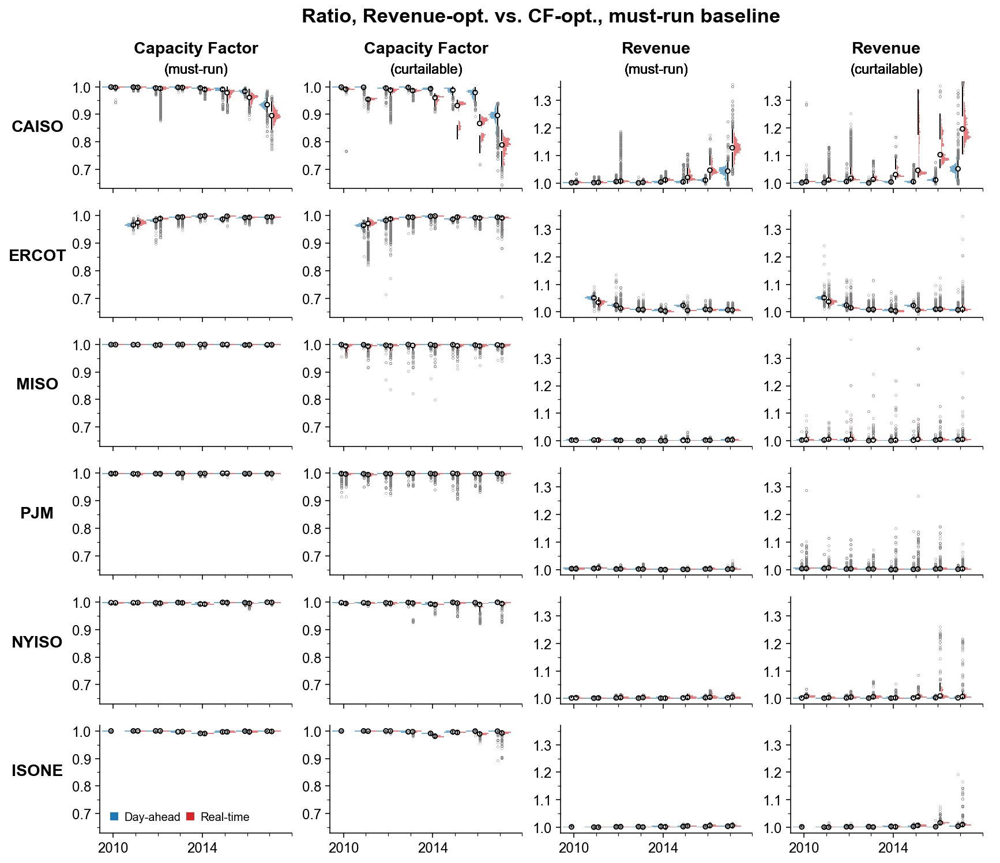

In [33]:
########## Baseline = mustrun
### Data-indexed parameters
data = [
    'CF_OptRev/OptCF_hist,da,f,mustrun',
    'CF_OptRev/OptCF_hist,rt,f,mustrun',
    'CF_OptRev/OptCF_hist,da,f,curtail,baselinemustrun',
    'CF_OptRev/OptCF_hist,rt,f,curtail,baselinemustrun',
    'Rev_OptRev/OptCF_hist,da,f,mustrun',
    'Rev_OptRev/OptCF_hist,rt,f,mustrun',
    'Rev_OptRev/OptCF_hist,da,f,curtail,baselinemustrun',
    'Rev_OptRev/OptCF_hist,rt,f,curtail,baselinemustrun',
]
colindex = [0, 0, 1, 1, 2, 2, 3, 3,]
colindex = dict(zip(data, colindex))
direction = ['left','right','left','right',
             'left','right','left','right',]
direction = dict(zip(data, direction))
color = [mc['da'],mc['rt'],mc['da'],mc['rt'],
         mc['da'],mc['rt'],mc['da'],mc['rt'],]
color = dict(zip(data, color))
squeeze = [0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35,]
squeeze = dict(zip(data, squeeze))
plotcols = [slice(None),slice(None),slice(None),slice(None),
            slice(None),slice(None),slice(None),slice(None),]
plotcols = dict(zip(data, plotcols))

### Column-indexed parameters
ylim = [
    [0.63, 1.02],
    [0.63, 1.02],
    [0.98,1.37],
    [0.98,1.37],
]
xlim = [
    [2009.4, 2018],
    [2009.4, 2018],
    [2009.4, 2018],
    [2009.4, 2018],
]

majlocs = [0.1, 0.1, 0.1, 0.1]
minlocs = [2, 2, 2, 2,]

ylabel = [
    'Capacity Factor',
    'Capacity Factor',
    'Revenue',
    'Revenue',
]

note = [
    '(must-run)',
    '(curtailable)',
    '(must-run)',
    '(curtailable)',
]
y1 = 1.2     # 1.2 if using note,  1 if no note
y2 = 1.07  # 1.07 if using note, 1.04 if no note

gridspec_kw = {'width_ratios': [2, 2, 2, 2,]}#, 'wspace':0.4}
ncols = len(gridspec_kw['width_ratios'])

### Plot it
plt.close()
f,ax = plt.subplots(6,ncols,sharex='col',sharey=False, gridspec_kw=gridspec_kw,
                    figsize=(sum(gridspec_kw['width_ratios'])*12/7, figheight), 
                   )
for row, iso in enumerate(isos):
    for datum in data:
        dfframe = (dfplot.loc[dfplot.ISOwecc==iso]
                   .pivot(index='ISO:Node',columns='yearlmp',values=datum))

        pvvm.plots.plotquarthist(
            ax=ax[(row,colindex[datum])], dfplot=dfframe[plotcols[datum]], 
            density=True, bootstrap=bootstrap, 
            histcolor=color[datum], hist_range=ylim[colindex[datum]],
            direction=direction[datum], squeeze=squeeze[datum],
            quartpad=(-0.1 if direction[datum] == 'left' else 0.1),
            histpad=(-0.15 if direction[datum] == 'left' else 0.15),
            format_axes=False,
        )

### Format axis
for row, iso in enumerate(isos):
    for col in range(ncols):
        ax[(row,0)].set_ylabel(iso, weight='bold', rotation=0, labelpad=30)
        ### x ticks
        ax[(row,col)].set_xticks([2010,2014])
        ax[(row,col)].set_xticklabels(
            ['2010','2014'], rotation=0, ha='center')
        ax[(row,col)].xaxis.set_minor_locator(AutoMinorLocator(4))
        ax[(row,col)].set_xlim(*xlim[col])
        ### Add title
        ax[(0,col)].set_title(ylabel[col], weight='bold', y=y1, size='x-large')
        ### Add annotation
        ax[(0,col)].annotate(
            note[col], xy=(0.5,1.05), xycoords='axes fraction',
            ha='center', va='bottom', fontsize='large')

        ### Format axis
        ax[(row,col)].set_ylim(*ylim[col])
        ax[(row,col)].yaxis.set_major_locator(MultipleLocator(majlocs[col]))
        ax[(row,col)].yaxis.set_minor_locator(AutoMinorLocator(minlocs[col]))
pvvm.plots.despine(ax)

### Legend
patches = [
    mpl.patches.Patch(
        facecolor=mc[market], edgecolor='none', 
        label=('Day-ahead' if market == 'da' else 'Real-time'))
    for market in ['da','rt']]
leg = ax[(-1,0)].legend(
    handles=patches, loc='lower left', frameon=False, ncol=2,
    columnspacing=0.5, handletextpad=0.5, handlelength=0.7,)

# plt.tight_layout()
## add big axis, hide frame, ticks, and labels
f.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.title('Ratio, Revenue-opt. vs. CF-opt., must-run baseline', weight='bold', y=y2, fontsize='xx-large')

plt.show()

In [34]:
print('CAISO 2017')
display(dfplot.loc[(dfplot.ISOwecc=='CAISO')&(dfplot.yearlmp==2017),data].describe(percentiles=fractions))
print('median')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].median().unstack('ISOwecc'))
print('max')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].max().unstack('ISOwecc'))
for datum in data:
    print(datum)
    display(dfplot.groupby(['ISOwecc','yearlmp'])[datum].describe(percentiles=fractions).T)

CAISO 2017


,"CF_OptRev/OptCF_hist,da,f,mustrun","CF_OptRev/OptCF_hist,rt,f,mustrun","CF_OptRev/OptCF_hist,da,f,curtail,baselinemustrun","CF_OptRev/OptCF_hist,rt,f,curtail,baselinemustrun","Rev_OptRev/OptCF_hist,da,f,mustrun","Rev_OptRev/OptCF_hist,rt,f,mustrun","Rev_OptRev/OptCF_hist,da,f,curtail,baselinemustrun","Rev_OptRev/OptCF_hist,rt,f,curtail,baselinemustrun"
count,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000,2209.000000
mean,0.935713,0.896420,0.890050,0.781320,1.042364,1.130232,1.053642,1.224193
std,0.017484,0.023111,0.028419,0.028541,0.018882,0.039487,0.033171,0.101965
min,0.821078,0.774044,0.696302,0.640909,0.993515,1.032940,0.998301,1.105384
2.5%,0.900771,0.856013,0.815125,0.715304,1.005221,1.058584,1.010603,1.129142
25%,0.926839,0.883491,0.885285,0.765099,1.033260,1.110689,1.041737,1.168903
50%,0.934574,0.895030,0.895518,0.788514,1.043464,1.128227,1.051820,1.196672
75%,0.942720,0.910913,0.904803,0.803383,1.052679,1.146930,1.060932,1.244334
97.5%,0.974518,0.945262,0.930582,0.817736,1.077262,1.202694,1.110678,1.420512
max,0.987178,0.966279,0.941928,0.841168,1.222468,1.414609,1.559459,2.159810


median


CF_OptRev/OptCF_hist,da,f,mustrun                                \
ISOwecc                             CAISO     ERCOT     ISONE      MISO   
yearlmp                                                                   
2010                             0.998748       NaN  0.999933  0.999281   
2011                             0.998575  0.965722  1.000060  0.998788   
2012                             0.995396  0.982514  1.000151  0.997335   
2013                             0.997552  0.994285  0.996971  0.999728   
2014                             0.995700  0.997577  0.991220  0.999496   
2015                             0.990244  0.986939  0.996699  0.999311   
2016                             0.983132  0.992566  0.999431  0.997871   
2017                             0.934574  0.994648  0.999301  0.998500   

                                        CF_OptRev/OptCF_hist,rt,f,mustrun  \
ISOwecc     NYISO       PJM WECC -CAISO                             CAISO   
yearlmp                                                                     
2010     0.997796  0.998742         NaN                          0.997344   
2011     0.997443  0.998193         NaN                          0.997797   
2012     0.997441  0.998510         NaN                          0.993732   
2013     0.998587  0.999346         NaN                          0.997202   
2014     0.993239  0.998816         NaN                          0.990090   
2015     0.999161  0.999762    0.994087                          0.978461   
2016     0.997944  0.998749    0.985828                          0.961154   
2017     0.999544  0.999214    0.950324                          0.895030   

                                                                       \
ISOwecc     ERCOT     ISONE      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                                                 
2010          NaN       NaN  0.999289  0.997175  0.999025         NaN   
2011     0.974514  0.999944  0.999063  0.997963  0.997861         NaN   
2012     0.989014  1.000105  0.998778  0.996178  0.998416         NaN   
2013     0.994854  0.997923  0.999652  0.997300  0.999646         NaN   
2014     0.999400  0.990672  0.999722  0.992544  0.999025         NaN   
2015     0.997624  0.996650  0.999324  0.998190  0.999864    0.996920   
2016     0.993484  0.996959  0.998613  0.995692  0.998833    0.970385   
2017     0.994937  0.998242  0.998846  0.999012  0.998726    0.869636   

        CF_OptRev/OptCF_hist,da,f,curtail,baselinemustrun                      \
ISOwecc                                             CAISO     ERCOT     ISONE   
yearlmp                                                                         
2010                                             0.998659       NaN  0.999920   
2011                                             0.997985  0.964373  1.000053   
2012                                             0.995232  0.982129  1.000141   
2013                                             0.997444  0.994234  0.996971   
2014                                             0.992633  0.997415  0.991199   
2015                                             0.987560  0.986779  0.996658   
2016                                             0.978965  0.992310  0.999430   
2017                                             0.895518  0.994245  0.999206   

                                                   \
ISOwecc      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                             
2010     0.999082  0.997796  0.998638         NaN   
2011     0.998698  0.997443  0.998148         NaN   
2012     0.996983  0.997441  0.998486         NaN   
2013     0.999489  0.998585  0.999339         NaN   
2014     0.999027  0.993239  0.998762         NaN   
2015     0.998959  0.999124  0.999710    0.994064   
2016     0.997587  0.997890  0.998666    0.985722   
2017     0.998117  0.999412  0.999177    0.891771   

        CF_OptRev/OptCF_hist,rt,f,curtail,baselinemust

max


CF_OptRev/OptCF_hist,da,f,mustrun                                \
ISOwecc                             CAISO     ERCOT     ISONE      MISO   
yearlmp                                                                   
2010                             1.000885       NaN  1.000979  1.000870   
2011                             1.000464  0.992659  1.000948  1.000680   
2012                             1.000136  0.994097  1.001589  1.000779   
2013                             1.000394  0.998447  0.998488  1.000967   
2014                             1.000641  1.000869  0.995355  1.000447   
2015                             0.998203  0.993558  0.999503  1.001492   
2016                             0.997060  0.996633  1.001765  1.001313   
2017                             0.987178  0.999898  1.001463  1.000558   

                                        CF_OptRev/OptCF_hist,rt,f,mustrun  \
ISOwecc     NYISO       PJM WECC -CAISO                             CAISO   
yearlmp                                                                     
2010     1.001024  1.002165         NaN                          1.000612   
2011     1.000713  1.001381         NaN                          1.001070   
2012     1.000575  1.000563         NaN                          1.000158   
2013     1.002098  1.001326         NaN                          1.000800   
2014     0.999747  1.000945         NaN                          0.999862   
2015     1.002645  1.001623    0.999814                          0.998154   
2016     1.000533  1.001238    1.000592                          0.989867   
2017     1.001635  1.001686    0.999567                          0.966279   

                                                                       \
ISOwecc     ERCOT     ISONE      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                                                 
2010          NaN       NaN  1.000925  1.001009  1.002160         NaN   
2011     0.998827  1.000560  1.000492  1.000518  1.001151         NaN   
2012     0.997603  1.001923  1.000904  1.000542  1.000546         NaN   
2013     0.999948  0.999369  1.000720  1.003276  1.001118         NaN   
2014     1.001532  0.995070  1.000726  0.999739  1.000961         NaN   
2015     1.000206  1.000978  1.000674  1.002823  1.001383    1.000216   
2016     0.999290  1.001243  1.001278  1.001123  1.001243    0.999775   
2017     0.999976  1.001362  1.000717  1.001731  1.001927    0.998234   

        CF_OptRev/OptCF_hist,da,f,curtail,baselinemustrun                      \
ISOwecc                                             CAISO     ERCOT     ISONE   
yearlmp                                                                         
2010                                             1.000764       NaN  1.000979   
2011                                             0.999805  0.982423  1.000948   
2012                                             0.999821  0.994097  1.001589   
2013                                             1.000180  0.998447  0.998488   
2014                                             0.999313  1.000869  0.995355   
2015                                             0.998203  0.993558  0.999309   
2016                                             0.997060  0.996444  1.001765   
2017                                             0.941928  0.999747  1.001463   

                                                   \
ISOwecc      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                             
2010     1.000864  1.001024  1.002165         NaN   
2011     1.000680  1.000713  1.001381         NaN   
2012     1.000779  1.000575  1.000563         NaN   
2013     1.000967  1.002098  1.001326         NaN   
2014     1.000447  0.999747  1.000945         NaN   
2015     1.001492  1.002645  1.001623    0.999814   
2016     1.001313  1.000436  1.001238    1.000347   
2017     1.000558  1.001635  1.001686    0.948706   

        CF_OptRev/OptCF_hist,rt,f,curtail,baselinemust

CF_OptRev/OptCF_hist,da,f,mustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        0.998796     0.998487     0.994592     0.997408     0.995259   
std         0.000854     0.001168     0.003908     0.001275     0.002663   
min         0.994485     0.983943     0.970262     0.979743     0.975555   
2.5%        0.997000     0.997062     0.981131     0.994868     0.988660   
25%         0.998253     0.998202     0.993816     0.996829     0.994232   
50%         0.998748     0.998575     0.995396     0.997552     0.995700   
75%         0.999440     0.998987     0.996528     0.998272     0.996746   
97.5%       1.000312     0.999628     0.999052     0.999455     0.999034   
max         1.000885     1.000464     1.000136     1.000394     1.000641   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        0.988713     0.982427     0.935713     0.966208     0.981868   
std         0.009309     0.005395     0.017484     0.005558     0.006738   
min         0.918174     0.954858     0.821078     0.935534     0.898403   
2.5%        0.963387     0.969911     0.900771     0.956369     0.967658   
25%         0.986914     0.979571     0.926839     0.962453     0.980647   
50%         0.990244     0.983132     0.934574     0.965722     0.982514   
75%         0.993780     0.985903     0.942720     0.969907     0.984632   
97.5%       0.996649     0.991407     0.974518     0.978213     0.989772   
max         0.998203     0.997060     0.987178     0.992659     0.994097   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        0.993702     0.997210     0.986896     0.992160     0.994420   
std         0.003561     0.002017     0.002285     0.002210     0.002694   
min         0.959453     0.977599     0.978384     0.970989     0.974496   
2.5%        0.983358     0.993070     0.982318     0.986915     0.988583   
25%         0.993180     0.996352     0.985333     0.991407     0.993451   
50%         0.994285     0.997577     0.986939     0.992566     0.994648   
75%         0.995235     0.998447     0.988545     0.993382     0.995999   
97.5%       0.996992     0.999742     0.991056     0.995188     0.998049   
max         0.998447     1.000869     0.993558     0.996633     0.999898   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       0.999888    1.000027    1.000016    0.996843    0.991127   
std        0.000495    0.000325    0.000778    0.000905    0.001262   
min        0.998227    0.998934    0.997553    0.993021    0.988006   
2.5%       0.998703    0.999312    0.998202    0.994823    0.988580   
25%        0.999616    0.999881    0.999613    0.996305    0.990333   
50%        0.999933    1.000060    1.000151    0.996971    0.991220   
75%        1.000222    1.000229    1.000569    0.997512    0.991863   
97.5%      1.000753    1.000536    1.001276    0.998200    0.993754   
max        1.000979    1.000948    1.001589    0.998488    0.995355   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       0.996739    0.999449    0.999312    0.999154    0.998784   
std        0.001148    0.000744    0.000798    0.000904    0.000778   
min        0.994074    0.997085    0.996659    0.9956

CF_OptRev/OptCF_hist,rt,f,mustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        0.997275     0.997449     0.988007     0.996816     0.989203   
std         0.002789     0.002262     0.019639     0.002114     0.005117   
min         0.943378     0.985167     0.875259     0.981692     0.955062   
2.5%        0.993664     0.991076     0.916268     0.991084     0.978264   
25%         0.996473     0.996487     0.989655     0.995678     0.986987   
50%         0.997344     0.997797     0.993732     0.997202     0.990090   
75%         0.998577     0.998950     0.996423     0.998419     0.992413   
97.5%       1.000093     1.000247     0.999735     0.999876     0.996034   
max         1.000612     1.001070     1.000158     1.000800     0.999862   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        0.974862     0.957673     0.896420     0.974435     0.987381   
std         0.012789     0.014243     0.023111     0.006919     0.008153   
min         0.907179     0.882312     0.774044     0.954631     0.920048   
2.5%        0.947777     0.924494     0.856013     0.961282     0.966363   
25%         0.966972     0.950459     0.883491     0.969665     0.986726   
50%         0.978461     0.961154     0.895030     0.974514     0.989014   
75%         0.984150     0.967370     0.910913     0.979444     0.991251   
97.5%       0.990318     0.978746     0.945262     0.987306     0.994515   
max         0.998154     0.989867     0.966279     0.998827     0.997603   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        0.994134     0.999015     0.997136     0.992793     0.994352   
std         0.004200     0.001550     0.002289     0.003465     0.003191   
min         0.947713     0.981910     0.960395     0.963861     0.973992   
2.5%        0.984231     0.994886     0.991841     0.981638     0.986982   
25%         0.993208     0.998623     0.996762     0.992013     0.992944   
50%         0.994854     0.999400     0.997624     0.993484     0.994937   
75%         0.996110     0.999916     0.998260     0.994660     0.996325   
97.5%       0.998349     1.000521     0.999355     0.996653     0.999120   
max         0.999948     1.001532     1.000206     0.999290     0.999976   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    0.999948    0.999971    0.997789    0.990734    0.996829   
std       NaN    0.000209    0.000877    0.000799    0.001400    0.001375   
min       NaN    0.999055    0.994092    0.994131    0.987475    0.993118   
2.5%      NaN    0.999572    0.998001    0.995845    0.988021    0.994274   
25%       NaN    0.999843    0.999486    0.997442    0.989814    0.995825   
50%       NaN    0.999944    1.000105    0.997923    0.990672    0.996650   
75%       NaN    1.000062    1.000548    0.998318    0.991639    0.997810   
97.5%     NaN    1.000313    1.001223    0.999057    0.993602    0.999689   
max       NaN    1.000560    1.001923    0.999369    0.995070    1.000978   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       0.997013    0.998173    0.999351    0.998895    0.998566   
std        0.001710    0.001211    0.000748    0.000

CF_OptRev/OptCF_hist,da,f,curtail,baselinemustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        0.998629     0.997390     0.994000     0.997138     0.992286   
std         0.001072     0.003723     0.005647     0.001701     0.003015   
min         0.991658     0.927782     0.932775     0.978054     0.972427   
2.5%        0.996368     0.992921     0.978058     0.991997     0.983390   
25%         0.998131     0.997462     0.993667     0.996559     0.991110   
50%         0.998659     0.997985     0.995232     0.997444     0.992633   
75%         0.999351     0.998415     0.996416     0.998189     0.993806   
97.5%       1.000266     0.999162     0.998796     0.999414     0.996629   
max         1.000764     0.999805     0.999821     1.000180     0.999313   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        0.986128     0.975258     0.890050     0.964369     0.981009   
std         0.010172     0.012293     0.028419     0.007056     0.009792   
min         0.918174     0.892388     0.696302     0.851269     0.714140   
2.5%        0.962322     0.948286     0.815125     0.951304     0.965778   
25%         0.981663     0.968339     0.885285     0.960942     0.980190   
50%         0.987560     0.978965     0.895518     0.964373     0.982129   
75%         0.993375     0.984364     0.904803     0.968621     0.984177   
97.5%       0.996366     0.990641     0.930582     0.975757     0.988432   
max         0.998203     0.997060     0.941928     0.982423     0.994097   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        0.993507     0.996898     0.986716     0.991702     0.993368   
std         0.004005     0.002902     0.002410     0.003036     0.004721   
min         0.934740     0.951365     0.972641     0.954112     0.919628   
2.5%        0.981433     0.991581     0.981741     0.984017     0.982780   
25%         0.993052     0.996100     0.985154     0.991016     0.992504   
50%         0.994234     0.997415     0.986779     0.992310     0.994245   
75%         0.995199     0.998397     0.988404     0.993260     0.995669   
97.5%       0.996952     0.999735     0.990829     0.995007     0.997564   
max         0.998447     1.000869     0.993558     0.996444     0.999747   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       0.999862    1.000018    0.999964    0.996817    0.991085   
std        0.000530    0.000348    0.000906    0.000938    0.001277   
min        0.997141    0.998204    0.992490    0.993021    0.988006   
2.5%       0.998500    0.999187    0.998160    0.994758    0.988545   
25%        0.999587    0.999869    0.999576    0.996278    0.990238   
50%        0.999920    1.000053    1.000141    0.996971    0.991199   
75%        1.000197    1.000224    1.000567    0.997486    0.991841   
97.5%      1.000753    1.000536    1.001276    0.998200    0.993754   
max        1.000979    1.000948    1.001589    0.998488    0.995355   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       0.996689    0.999361    0.998683    0.998553    0.998318   
std        0.001140    0.001070    0.005175    0.003685    0.001755   
min        0.991329    0.982377    0.892283    0.9551

CF_OptRev/OptCF_hist,rt,f,curtail,baselinemustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        0.990817     0.952255     0.980815     0.984604     0.955739   
std         0.010060     0.007122     0.020121     0.006498     0.011120   
min         0.764028     0.911917     0.866171     0.949298     0.909114   
2.5%        0.985821     0.929036     0.904338     0.965369     0.931191   
25%         0.990052     0.950753     0.980286     0.982307     0.948887   
50%         0.991157     0.954237     0.987609     0.985819     0.960239   
75%         0.993029     0.956934     0.990423     0.988375     0.964902   
97.5%       0.994753     0.960072     0.995376     0.991029     0.968144   
max         0.995601     0.961598     0.996629     0.991689     0.974773   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        0.903383     0.851808     0.781320     0.961689     0.979910   
std         0.041499     0.032560     0.028541     0.031552     0.021080   
min         0.810432     0.716126     0.640909     0.821193     0.772478   
2.5%        0.829372     0.785184     0.715304     0.861428     0.917689   
25%         0.859286     0.821576     0.765099     0.964506     0.982792   
50%         0.931639     0.866740     0.788514     0.971661     0.987500   
75%         0.939327     0.879409     0.803383     0.976843     0.990240   
97.5%       0.945681     0.890594     0.817736     0.986346     0.994031   
max         0.951362     0.898813     0.841168     0.991314     0.996632   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        0.992010     0.997348     0.993827     0.987737     0.984961   
std         0.006993     0.003822     0.003571     0.008086     0.016509   
min         0.935146     0.952453     0.959092     0.949335     0.705733   
2.5%        0.969437     0.988715     0.985665     0.965863     0.947622   
25%         0.991720     0.997276     0.992173     0.985947     0.986380   
50%         0.993857     0.998269     0.994492     0.991067     0.991269   
75%         0.995569     0.998907     0.996185     0.992682     0.993168   
97.5%       0.997467     0.999727     0.998498     0.994711     0.995514   
max         0.999603     1.000699     0.999391     0.996503     0.999094   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    0.999002    0.999486    0.996875    0.981360    0.994613   
std       NaN    0.000460    0.001005    0.001893    0.002080    0.001418   
min       NaN    0.996584    0.989940    0.981283    0.977059    0.991058   
2.5%      NaN    0.997542    0.997498    0.993178    0.978098    0.991879   
25%       NaN    0.998852    0.998981    0.996714    0.979981    0.993582   
50%       NaN    0.999117    0.999711    0.997194    0.980942    0.994545   
75%       NaN    0.999286    1.000147    0.997672    0.982313    0.995689   
97.5%     NaN    0.999565    1.000852    0.998424    0.986226    0.997424   
max       NaN    0.999678    1.001381    0.998622    0.987913    0.998863   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       0.988500    0.990158    0.990829    0.988374    0.988810   
std        0.003542    0.011083    0.009833    0.014

Rev_OptRev/OptCF_hist,da,f,mustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        1.001344     1.001853     1.006515     1.000761     1.004292   
std         0.000871     0.002095     0.004925     0.001000     0.003049   
min         0.999336     0.999226     0.999689     0.998285     0.998917   
2.5%        0.999825     0.999891     1.001293     0.999345     1.000983   
25%         1.000710     1.001041     1.003850     1.000210     1.002496   
50%         1.001266     1.001628     1.005298     1.000617     1.003777   
75%         1.001889     1.002258     1.006884     1.001184     1.005314   
97.5%       1.003143     1.004323     1.023274     1.002684     1.013509   
max         1.005628     1.024543     1.031087     1.021769     1.027635   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        1.005681     1.010948     1.042364     1.050829     1.024779   
std         0.007238     0.004669     0.018882     0.007012     0.008004   
min         0.997706     0.996916     0.993515     1.003153     1.005186   
2.5%        0.999173     1.002508     1.005221     1.034801     1.013942   
25%         1.002432     1.007936     1.033260     1.047552     1.022108   
50%         1.004217     1.010591     1.043464     1.051259     1.024391   
75%         1.006613     1.013577     1.052679     1.054676     1.026336   
97.5%       1.019296     1.021914     1.077262     1.063472     1.039740   
max         1.069368     1.030858     1.222468     1.093176     1.134148   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        1.008881     1.007083     1.023438     1.010143     1.008054   
std         0.004071     0.002174     0.002952     0.003213     0.003899   
min         1.003081     1.000202     1.013966     1.003978     1.000095   
2.5%        1.005134     1.004002     1.018019     1.005743     1.003525   
25%         1.007421     1.005919     1.021463     1.008484     1.005990   
50%         1.008389     1.006847     1.023337     1.009690     1.007203   
75%         1.009224     1.007853     1.025263     1.011082     1.008563   
97.5%       1.019471     1.011714     1.029595     1.019061     1.018603   
max         1.052779     1.029071     1.038548     1.041762     1.035323   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       1.001691    1.000690    1.002030    1.002555    1.003705   
std        0.000649    0.000362    0.000912    0.000969    0.001840   
min        1.000307    0.999594    1.000015    0.998162    0.996743   
2.5%       1.000505    0.999929    1.000419    0.999268    1.000220   
25%        1.001230    1.000531    1.001547    1.002129    1.002628   
50%        1.001588    1.000664    1.001971    1.002587    1.003339   
75%        1.002116    1.000897    1.002434    1.003068    1.004712   
97.5%      1.002875    1.001463    1.004832    1.004290    1.007505   
max        1.003642    1.002037    1.007462    1.005178    1.009941   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       1.003073    1.002293    1.004049    1.002629    1.002438   
std        0.001587    0.000970    0.001074    0.001411    0.001313   
min        0.998383    0.999769    0.998923    0.9994

Rev_OptRev/OptCF_hist,rt,f,mustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        1.002688     1.003360     1.016450     1.003037     1.012454   
std         0.002277     0.003423     0.029898     0.002270     0.004969   
min         0.998308     0.998994     0.997390     0.999009     1.001471   
2.5%        0.999760     0.999770     1.000962     1.000056     1.005265   
25%         1.001406     1.001234     1.005282     1.001578     1.009397   
50%         1.002519     1.002440     1.007272     1.002618     1.011600   
75%         1.003555     1.004238     1.010560     1.003988     1.014891   
97.5%       1.006609     1.013850     1.126914     1.008574     1.022666   
max         1.036135     1.024102     1.187379     1.016021     1.043214   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        1.024681     1.053300     1.130232     1.033844     1.014690   
std         0.015200     0.021244     0.039487     0.007243     0.008238   
min         0.999447     1.013205     1.032940     1.004131     1.002671   
2.5%        1.005476     1.024108     1.058584     1.018466     1.006874   
25%         1.013718     1.038686     1.110689     1.029160     1.011317   
50%         1.020153     1.046734     1.128227     1.034713     1.013150   
75%         1.032562     1.065843     1.146930     1.038690     1.014868   
97.5%       1.056382     1.099080     1.202694     1.046780     1.035964   
max         1.106972     1.174392     1.414609     1.052069     1.089397   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        1.008818     1.003079     1.006100     1.009235     1.007866   
std         0.004198     0.002073     0.003525     0.005089     0.004615   
min         1.000497     0.993792     0.992758     0.999948     0.997546   
2.5%        1.002641     0.999879     1.002680     1.003665     1.001905   
25%         1.007401     1.002084     1.004502     1.006430     1.005478   
50%         1.008552     1.002867     1.005624     1.008081     1.006908   
75%         1.009712     1.003852     1.006750     1.010144     1.008694   
97.5%       1.016889     1.007617     1.014883     1.025347     1.021794   
max         1.063175     1.028569     1.060230     1.044713     1.035030   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    1.000499    1.002215    1.001037    1.002254    1.005186   
std       NaN    0.000466    0.001075    0.000878    0.001970    0.001718   
min       NaN    0.999817    1.000013    0.997450    0.995219    1.001508   
2.5%      NaN    0.999924    1.000691    0.998724    0.998729    1.002264   
25%       NaN    1.000173    1.001597    1.000601    1.001001    1.004043   
50%       NaN    1.000401    1.002076    1.000911    1.001802    1.005136   
75%       NaN    1.000692    1.002603    1.001488    1.003443    1.006125   
97.5%     NaN    1.001540    1.006213    1.003091    1.006272    1.008733   
max       NaN    1.002406    1.008574    1.003808    1.007982    1.010324   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       1.006589    1.006313    1.002142    1.002381    1.001636   
std        0.002301    0.001543    0.001463    0.001

Rev_OptRev/OptCF_hist,da,f,curtail,baselinemustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        1.001415     1.002330     1.007064     1.000855     1.004452   
std         0.001027     0.002871     0.006460     0.001174     0.003177   
min         0.999341     0.999243     0.999689     0.998285     0.998932   
2.5%        0.999826     0.999906     1.001843     0.999345     1.000990   
25%         1.000717     1.001138     1.004035     1.000221     1.002594   
50%         1.001283     1.001747     1.005423     1.000655     1.003891   
75%         1.001979     1.002473     1.007019     1.001233     1.005477   
97.5%       1.003483     1.010954     1.026204     1.003323     1.014081   
max         1.009463     1.028702     1.071279     1.021894     1.027648   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        1.006482     1.012630     1.053642     1.051509     1.025275   
std         0.007640     0.006799     0.033171     0.009838     0.014526   
min         0.997738     0.996916     0.998301     1.012164     1.005186   
2.5%        0.999650     1.002850     1.010603     1.035433     1.015066   
25%         1.002809     1.008826     1.041737     1.047873     1.022309   
50%         1.004822     1.011377     1.051820     1.051538     1.024493   
75%         1.007494     1.014976     1.060932     1.054878     1.026484   
97.5%       1.026925     1.030293     1.110678     1.063882     1.041061   
max         1.069368     1.076988     1.559459     1.242170     1.514284   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        1.008982     1.007456     1.023552     1.010702     1.008680   
std         0.004212     0.003820     0.003051     0.005241     0.005074   
min         1.003383     1.000202     1.013966     1.004242     1.001092   
2.5%        1.005142     1.004105     1.018189     1.005929     1.004003   
25%         1.007484     1.005961     1.021498     1.008543     1.006188   
50%         1.008450     1.006913     1.023361     1.009805     1.007433   
75%         1.009337     1.008087     1.025315     1.011196     1.008995   
97.5%       1.020644     1.014280     1.029847     1.022904     1.020938   
max         1.060958     1.073666     1.044821     1.097889     1.082642   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       1.001697    1.000690    1.002039    1.002566    1.003711   
std        0.000648    0.000362    0.000910    0.000978    0.001836   
min        1.000307    0.999594    1.000015    0.998162    0.996743   
2.5%       1.000505    0.999929    1.000419    0.999268    1.000220   
25%        1.001236    1.000531    1.001547    1.002142    1.002655   
50%        1.001588    1.000665    1.001983    1.002590    1.003339   
75%        1.002116    1.000897    1.002446    1.003103    1.004712   
97.5%      1.002875    1.001463    1.004832    1.004301    1.007505   
max        1.003642    1.002037    1.007462    1.005979    1.009941   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       1.003099    1.002323    1.004324    1.002925    1.002536   
std        0.001659    0.001251    0.006241    0.002824    0.001435   
min        0.998385    0.999769    1.001323    0.9994

Rev_OptRev/OptCF_hist,rt,f,curtail,baselinemustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        1.006924     1.017260     1.034871     1.016763     1.038748   
std         0.013094     0.017952     0.038904     0.011475     0.017882   
min         1.001017     1.004788     1.005489     1.005814     1.014471   
2.5%        1.002245     1.005830     1.008270     1.007605     1.020739   
25%         1.003977     1.008302     1.013275     1.009732     1.025042   
50%         1.005564     1.011347     1.017422     1.013285     1.030792   
75%         1.006701     1.018720     1.033033     1.021152     1.052427   
97.5%       1.022447     1.073989     1.159545     1.046390     1.079502   
max         1.291673     1.131301     1.253264     1.082055     1.166288   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        1.102288     1.124199     1.224193     1.038122     1.018380   
std         0.079572     0.048512     0.101965     0.009986     0.011168   
min         1.021935     1.056934     1.105384     1.016020     1.007096   
2.5%        1.029307     1.071240     1.129142     1.023062     1.009727   
25%         1.036476     1.085945     1.168903     1.032350     1.012968   
50%         1.046212     1.103048     1.196672     1.037183     1.014763   
75%         1.176875     1.159690     1.244334     1.041997     1.018074   
97.5%       1.269531     1.220001     1.420512     1.059230     1.050340   
max         1.338491     1.443184     2.159810     1.138445     1.114905   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        1.010248     1.004491     1.008869     1.012915     1.014924   
std         0.006423     0.005160     0.007187     0.008909     0.017603   
min         1.001471     0.993890     0.993313     1.001296     0.999223   
2.5%        1.005054     1.000093     1.004027     1.005346     1.004812   
25%         1.007979     1.002452     1.005543     1.008086     1.007334   
50%         1.009234     1.003326     1.006872     1.010248     1.009585   
75%         1.010599     1.004768     1.009041     1.014142     1.016854   
97.5%       1.025488     1.017158     1.029729     1.037032     1.045928   
max         1.115892     1.059748     1.068929     1.125101     1.347413   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    1.000705    1.002337    1.001078    1.002446    1.007051   
std       NaN    0.001537    0.001295    0.000947    0.002073    0.001685   
min       NaN    0.999817    1.000013    0.997681    0.995390    1.002972   
2.5%      NaN    0.999943    1.000731    0.998724    0.998819    1.004176   
25%       NaN    1.000180    1.001685    1.000601    1.001110    1.005886   
50%       NaN    1.000432    1.002134    1.000928    1.001974    1.006976   
75%       NaN    1.000813    1.002690    1.001504    1.004084    1.007973   
97.5%     NaN    1.002368    1.006301    1.003595    1.006475    1.010649   
max       NaN    1.016929    1.016805    1.004362    1.008139    1.011737   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       1.017867    1.014087    1.009200    1.009378    1.013954   
std        0.006325    0.022729    0.012343    0.010

## Results synthesis for CAISO 2017

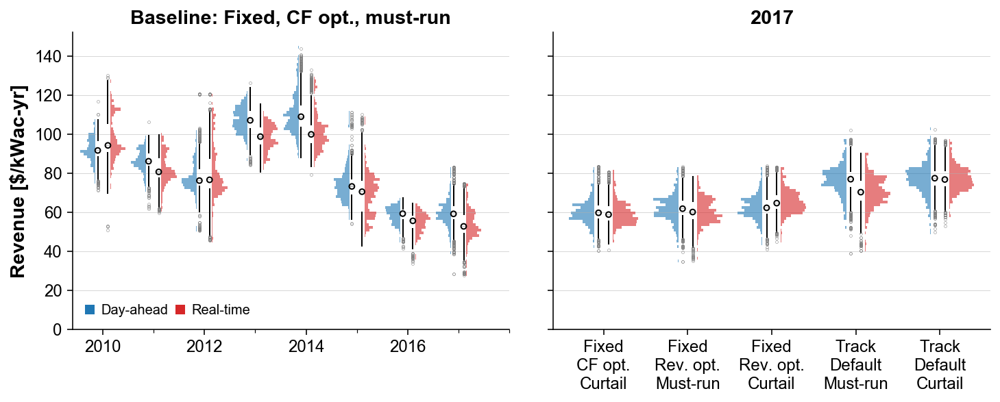

In [43]:
### Rename labels
def labelfy(datum):
    out = ''
    
    if '_f' in datum:
        out += 'Fixed\n'
    else:
        out += 'Track\n'
    
    if ('optrev' in datum) and ('_f' in datum):
        out += 'Rev. opt.\n'
    elif '_f' in datum:
        out += 'CF opt.\n'
    else:
        out += 'Default\n'
    
    if '(curtail)' in datum:
        out += 'Curtail'
    else:
        out += 'Must-run'
    
    return out

columnorder = [
    'Fixed\nCF opt.\nCurtail', 
    'Fixed\nRev. opt.\nMust-run',
    'Fixed\nRev. opt.\nCurtail', 
    'Track\nDefault\nMust-run',
    'Track\nDefault\nCurtail',
]

########## Absolute values
iso = 'CAISO'
year = 2017

squeeze = 0.3
ncols = 2
gridspec_kw = {'width_ratios': [2, 2], 'wspace': 0.1}
figsize = (12,4)
dpi = None

###### Column 0: Historical, baseline
datum = 'Revenue'
markets = ['da','rt']
data_baseline = [
    ### Column 0, vs years
    'Revenue_hist_optcf_f(da)(mustrun)',
    'Revenue_hist_optcf_f(rt)(mustrun)',
]

### Data-indexed parameters
ylim = [0,145]
ylabel = 'Revenue [$/kWac-yr]'

###### Column 1: single year, TOS
data_tos = [
    ### Column 1, single year, row 0
    'Revenue_dispatched_hist_optcf_f(da)(curtail)',
    'Revenue_dispatched_hist_optcf_f(rt)(curtail)',
    'Revenue_hist_optrev_f(da)(mustrun)',
    'Revenue_hist_optrev_f(rt)(mustrun)',
    'Revenue_dispatched_hist_optrev_f(da)(curtail)',
    'Revenue_dispatched_hist_optrev_f(rt)(curtail)',
    'Revenue_hist_default_t(da)(mustrun)',
    'Revenue_hist_default_t(rt)(mustrun)',
    'Revenue_hist_default_t(da)(curtail)',
    'Revenue_hist_default_t(rt)(curtail)',
]
dfright = pd.melt(
    dfplot.loc[(dfplot.ISOwecc==iso)&(dfplot.yearlmp==year),['ISO:Node']+data_tos],
    id_vars=['ISO:Node']
)
dfright['market'] = dfright.variable.map(lambda x: 'da' if '(da)' in x else 'rt')
dfright['label'] = dfright.variable.map(labelfy)
dfright['datum'] = dfright.variable.map(lambda x: x.split('_')[0])

### Plot it
plt.close()
f,ax = plt.subplots(1,ncols,sharex='col',sharey='row', gridspec_kw=gridspec_kw, 
                    figsize=figsize, dpi=dpi,
                   )
### Column 0: Baseline data vs years (fixed, CFopt, must-run)
medians = []
for column in data_baseline:
    dfframe = (dfplot.loc[dfplot.ISOwecc==iso]
               .pivot(index='ISO:Node',columns='yearlmp',values=column))

    pvvm.plots.plotquarthist(
        ax=ax[0], dfplot=dfframe, bootstrap=bootstrap, density=True,
        hist_range=ylim,
        histcolor=(mc['da'] if '(da)' in column else mc['rt']), 
        direction=('left' if '(da)' in column else 'right'), 
        squeeze=squeeze,
        quartpad=(-0.1 if '(da)' in column else 0.1),
        histpad=(-0.15 if '(da)' in column else 0.15),
        # medianmarker='_', mediansize=10, medianfacecolor='k'
    )
### Column 1: Single-year data vs TOS strategy
for market in markets:
    dfframe = dfright.loc[
        (dfright.market==market)&(dfright.datum==datum)
    ].pivot(index='ISO:Node',columns='label',values='value')[columnorder]
    medians.append(dfframe[columnorder[-1]].median())

    pvvm.plots.plotquarthist(
        ax=ax[1], dfplot=dfframe, bootstrap=bootstrap, density=True,
        x_locations=range(dfframe.shape[1]),
        hist_range=ylim,
        histcolor=mc[market], 
        direction=('left' if market == 'da' else 'right'), 
        squeeze=squeeze,
        quartpad=(-0.06 if market == 'da' else 0.06),
        histpad=(-0.11 if market == 'da' else 0.11),
        # medianmarker='_', mediansize=10, medianfacecolor='k'
    )

### Format axis
### Left
ax[0].set_ylabel(ylabel, weight='bold')
ax[0].set_xlim(2009.4,2018)
ax[0].set_xticks([2010,2012,2014,2016])
ax[0].set_xticklabels(['2010','2012','2014','2016'], rotation=0, ha='center')
ax[0].xaxis.set_minor_locator(AutoMinorLocator(2))
ax[0].set_ylim(0)
### Right
ax[1].set_xlim(-0.6,4.6)

### Grid lines
for i in range(2):
#     ax[i].grid(which='major', axis='y', zorder=-1, lw=0.5, ls=(0,(3,6)))
    ax[i].grid(which='major', axis='y', zorder=-1, lw=0.25)
    
### Add title
ax[0].set_title('Baseline: Fixed, CF opt., must-run', weight='bold', size='x-large')
ax[1].set_title('2017', weight='bold', size='x-large')

pvvm.plots.despine(ax)

### Legend
patches = [
    mpl.patches.Patch(
        facecolor=mc[market], edgecolor='none', 
        label=('Day-ahead' if market == 'da' else 'Real-time'))
    for market in ['da','rt']]
leg = ax[0].legend(
    handles=patches, loc='lower left', frameon=False, ncol=2,
    columnspacing=0.5, handletextpad=0.5, handlelength=0.7)

plt.show()

In [44]:
for column in data_tos:
    print(column)
    display(dfplot.groupby(['ISOwecc','yearlmp'])[column].median().unstack('ISOwecc'))

Revenue_dispatched_hist_optcf_f(da)(curtail)


ISOwecc,CAISO,ERCOT,ISONE,MISO,NYISO,PJM,WECC -CAISO
yearlmp,,,,,,,
2010,91.642956,NaN,105.497863,77.502471,112.758798,91.734709,NaN
2011,86.127027,163.342554,94.790453,69.637654,102.834552,89.623317,NaN
2012,76.242205,82.804797,75.495416,60.435458,79.442607,70.136512,NaN
2013,107.023902,79.332946,109.051458,61.371157,102.792563,72.538165,NaN
2014,108.889073,88.995977,119.572237,76.502404,113.466331,87.085898,NaN
2015,73.412060,67.027475,81.934850,55.225698,79.654977,67.237333,60.160760
2016,59.386822,59.710989,61.372094,55.933880,61.697934,57.702296,50.694685
2017,59.750699,58.689548,60.681659,57.310864,60.449408,57.116127,51.386261


Revenue_dispatched_hist_optcf_f(rt)(curtail)


ISOwecc,CAISO,ERCOT,ISONE,MISO,NYISO,PJM,WECC -CAISO
yearlmp,,,,,,,
2010,94.591012,NaN,NaN,74.748461,119.518094,91.013086,NaN
2011,81.541409,147.651843,95.315083,67.586972,102.904595,90.658277,NaN
2012,77.769232,70.934357,75.994444,60.223217,81.283416,71.710441,NaN
2013,100.083051,74.627151,108.962743,60.506492,103.764344,73.816333,NaN
2014,102.343692,81.102552,111.813865,73.019874,108.493946,87.620288,NaN
2015,74.092169,54.074342,77.620474,54.325588,76.626139,64.543321,47.904429
2016,59.067273,55.466713,58.401227,55.127363,59.708533,57.139688,43.235054
2017,58.849745,55.630056,57.996400,57.961796,57.311387,57.362941,50.198177


Revenue_hist_optrev_f(da)(mustrun)


ISOwecc,CAISO,ERCOT,ISONE,MISO,NYISO,PJM,WECC -CAISO
yearlmp,,,,,,,
2010,91.780130,NaN,105.663158,77.839414,112.975635,92.040608,NaN
2011,86.265822,171.663151,94.886344,69.931324,103.184464,89.915369,NaN
2012,76.709604,84.879363,75.649929,60.659546,79.641184,70.261575,NaN
2013,107.137153,79.962283,109.387344,61.384973,102.860512,72.659026,NaN
2014,109.336825,89.566856,119.955737,76.380780,113.653407,87.089907,NaN
2015,73.490282,68.630289,82.175311,55.308050,79.783423,67.245947,60.315465
2016,59.958390,60.237333,61.515509,56.104792,61.752049,57.813635,51.169277
2017,61.861851,59.110446,60.935487,57.415140,60.635622,57.190056,51.403162


Revenue_hist_optrev_f(rt)(mustrun)


ISOwecc,CAISO,ERCOT,ISONE,MISO,NYISO,PJM,WECC -CAISO
yearlmp,,,,,,,
2010,94.457796,NaN,NaN,74.741102,117.636972,91.053349,NaN
2011,80.960072,152.318357,95.362220,67.565627,103.318216,90.694282,NaN
2012,77.364859,71.723508,76.173223,60.026348,81.424795,71.890506,NaN
2013,98.895664,75.228430,108.980108,60.332796,104.213755,73.925827,NaN
2014,101.134964,81.256712,111.983595,72.876636,108.828758,87.539732,NaN
2015,71.753935,54.244745,77.852748,54.124228,76.857902,64.438592,45.296315
2016,58.082556,55.733125,58.163408,54.740153,59.704050,57.255894,41.435422
2017,60.152692,55.827446,58.063913,57.723777,56.878965,57.451400,43.670894


Revenue_dispatched_hist_optrev_f(da)(curtail)


ISOwecc,CAISO,ERCOT,ISONE,MISO,NYISO,PJM,WECC -CAISO
yearlmp,,,,,,,
2010,91.789179,NaN,105.663158,77.839414,112.975635,92.040608,NaN
2011,86.268224,171.673538,94.886344,69.931324,103.184464,89.961304,NaN
2012,76.715458,84.879363,75.649929,60.661136,79.641184,70.261575,NaN
2013,107.137153,79.962283,109.387344,61.384973,102.860512,72.659026,NaN
2014,109.338862,89.597928,119.955737,76.531748,113.653407,87.089907,NaN
2015,73.586390,68.632155,82.175435,55.308727,79.783423,67.245947,60.315465
2016,60.015474,60.242900,61.515509,56.104792,61.752049,57.819155,51.169286
2017,62.298697,59.110446,60.935487,57.415140,60.635622,57.190056,52.088554


Revenue_dispatched_hist_optrev_f(rt)(curtail)


ISOwecc,CAISO,ERCOT,ISONE,MISO,NYISO,PJM,WECC -CAISO
yearlmp,,,,,,,
2010,94.766971,NaN,NaN,74.868690,119.748813,91.203533,NaN
2011,81.717005,152.839929,95.362220,67.705604,103.378367,91.077774,NaN
2012,78.568522,71.841250,76.173223,60.273039,81.444175,71.916389,NaN
2013,100.368017,75.278542,108.980108,60.526729,104.270211,73.941487,NaN
2014,103.310672,81.294423,111.998438,73.023562,108.864018,87.627690,NaN
2015,75.168976,54.400999,77.988920,54.333688,76.886210,64.577990,48.039159
2016,61.502654,55.926224,58.763805,55.277872,59.843490,57.309070,44.276462
2017,64.697122,56.012118,58.307083,58.139875,57.422286,57.523415,54.225021


Revenue_hist_default_t(da)(mustrun)


ISOwecc,CAISO,ERCOT,ISONE,MISO,NYISO,PJM,WECC -CAISO
yearlmp,,,,,,,
2010,109.37760,NaN,118.5928,90.77040,129.87750,106.89810,NaN
2011,102.10010,193.97660,104.4916,80.83840,114.73255,102.60605,NaN
2012,90.92750,97.70400,83.0162,70.27660,88.80570,80.90280,NaN
2013,126.72775,95.37130,116.2047,70.30390,112.78160,83.88555,NaN
2014,131.29445,107.04620,124.8249,87.30930,119.94860,97.96785,NaN
2015,88.43770,79.49995,88.4539,63.84860,86.88680,76.16690,72.9487
2016,73.72300,70.06105,67.8385,64.80445,68.98870,66.23390,63.1331
2017,76.93390,69.36600,65.3982,66.44190,68.53490,65.49140,66.4538


Revenue_hist_default_t(rt)(mustrun)


ISOwecc,CAISO,ERCOT,ISONE,MISO,NYISO,PJM,WECC -CAISO
yearlmp,,,,,,,
2010,111.2517,NaN,NaN,86.92090,132.97770,106.03490,NaN
2011,93.1784,173.00860,105.50010,77.71110,115.39015,104.07990,NaN
2012,92.6374,82.76530,84.50340,69.00330,91.31930,82.74450,NaN
2013,116.3315,89.29950,117.86840,69.03940,116.56040,84.98410,NaN
2014,123.2419,97.32225,116.99075,84.53320,113.77750,97.37860,NaN
2015,86.4133,63.83250,85.39750,62.22110,84.56890,72.98540,54.5495
2016,70.2491,64.79050,65.02210,63.61755,67.75440,65.74120,51.1222
2017,70.3169,65.61200,62.86090,66.82590,64.31565,65.82685,50.9204


Revenue_hist_default_t(da)(curtail)


ISOwecc,CAISO,ERCOT,ISONE,MISO,NYISO,PJM,WECC -CAISO
yearlmp,,,,,,,
2010,109.38250,NaN,118.5928,90.77040,129.87750,106.89810,NaN
2011,102.11430,194.01830,104.4916,80.83840,114.73255,102.60605,NaN
2012,90.93025,97.70690,83.0162,70.27660,88.80570,80.91480,NaN
2013,126.72775,95.37130,116.2047,70.30390,112.78160,83.88555,NaN
2014,131.30400,107.06850,124.8249,87.31920,119.94860,97.96785,NaN
2015,88.48905,79.50125,88.4555,63.95790,86.88680,76.17050,72.9487
2016,73.80240,70.08585,67.8386,64.80445,68.98870,66.23390,63.1331
2017,77.45070,69.38910,65.3982,66.47765,68.53490,65.49140,67.1264


Revenue_hist_default_t(rt)(curtail)


ISOwecc,CAISO,ERCOT,ISONE,MISO,NYISO,PJM,WECC -CAISO
yearlmp,,,,,,,
2010,111.95470,NaN,NaN,87.1449,135.25100,106.37000,NaN
2011,94.63030,173.41900,105.50010,77.9661,115.49405,104.23975,NaN
2012,94.52365,82.94470,84.50340,69.9133,91.36170,82.80290,NaN
2013,118.28190,89.36690,117.86840,69.1420,116.61170,85.04810,NaN
2014,126.15765,97.35920,116.99685,84.8838,113.88280,97.55180,NaN
2015,90.29275,63.96395,85.68730,62.6773,84.87550,73.22020,57.81550
2016,74.94720,64.97755,65.75870,64.0214,67.82570,65.78420,54.39795
2017,76.77800,65.92965,63.19395,67.0154,64.43620,65.90585,66.26690


## Orientation optimization, 1-axis tracking

### Orientation

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]


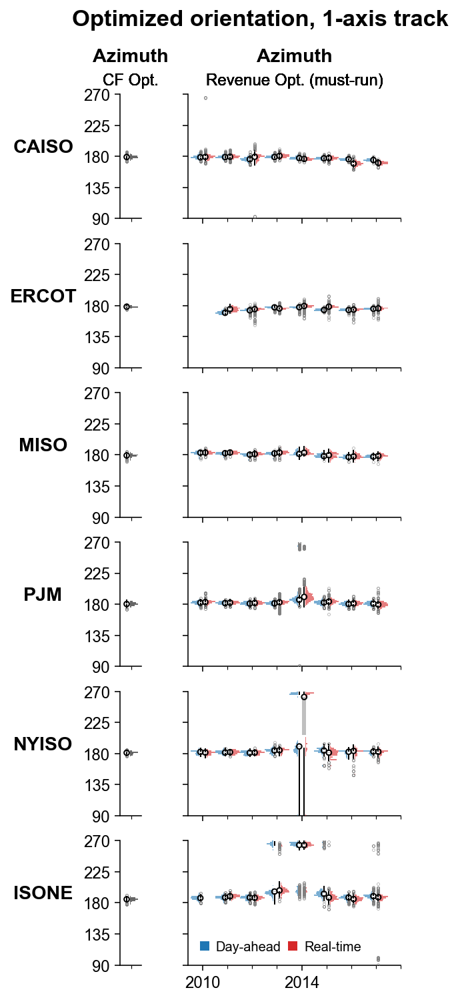

In [36]:
########## Starting absolute values for track CF-opt
systemtype = 'track'
pricecutoff = 'no'
yearsun = 'tmy'
program = 'PVvalueOptV4'

### Data-indexed parameters
data = [
    'OptCF_Azimuth(track)',
    'OptRev_Azimuth(track)(da)(mustrun)',
    'OptRev_Azimuth(track)(rt)(mustrun)',
]
colindex = [0, 1, 1,]
colindex = dict(zip(data, colindex))
direction = ['right','left','right',]
direction = dict(zip(data, direction))
color = [mc['tmy'],mc['da'],mc['rt'],]
color = dict(zip(data, color))
squeeze = [0.7, 0.35, 0.35,]
squeeze = dict(zip(data, squeeze))
plotcols = [[2011,2017],slice(None),slice(None),]
plotcols = dict(zip(data, plotcols))

### Column-indexed parameters
ylim = [
    [90, 270],
    [90, 270],
]
xlim = [
    [2017, 2018.9],
    [2009.4, 2018],
]

majlocs = [45, 45,]
minlocs = [1, 1,]

ylabel = [
    'Azimuth',
    'Azimuth',
]

note = [
    'CF Opt.',
    'Revenue Opt. (must-run)',
]
y1 = 1.2     # 1.2 if using note,  1 if no note
y2 = 1.07  # 1.07 if using note, 1.04 if no note

gridspec_kw = {'width_ratios': [0.2, 2,], 'wspace':0.4}
ncols = len(gridspec_kw['width_ratios'])

### Plot it
plt.close()
f,ax = plt.subplots(6,ncols,sharex='col',sharey=True, gridspec_kw=gridspec_kw,
                    figsize=(sum(gridspec_kw['width_ratios'])*12/7, figheight), 
                   )
for row, iso in enumerate(isos):
    for datum in data:
        dfframe = (dfplot.loc[dfplot.ISOwecc==iso]
                   .pivot(index='ISO:Node',columns='yearlmp',values=datum))

        pvvm.plots.plotquarthist(
            ax=ax[(row,colindex[datum])], dfplot=dfframe[plotcols[datum]], 
            density=True, bootstrap=5, 
            histcolor=color[datum], hist_range=ylim[colindex[datum]],
            direction=direction[datum], squeeze=squeeze[datum],
            quartpad=(-0.1 if direction[datum] == 'left' else 0.1),
            histpad=(-0.15 if direction[datum] == 'left' else 0.15),
            format_axes=False,
        )

### Format axis
for row, iso in enumerate(isos):
    for col in range(ncols):
        ax[(row,0)].set_ylabel(iso, weight='bold', rotation=0, labelpad=30)
        ### x ticks
        ax[(row,col)].set_xticks([2010,2014])
        ax[(row,col)].set_xticklabels(
            ['2010','2014'], rotation=0, ha='center')
        ax[(row,col)].xaxis.set_minor_locator(AutoMinorLocator(4))
        ax[(row,col)].set_xlim(*xlim[col])
        ### Add title
        ax[(0,col)].set_title(ylabel[col], weight='bold', y=y1, size='x-large')
        ### Add annotation
        ax[(0,col)].annotate(
            note[col], xy=(0.5,1.05), xycoords='axes fraction',
            ha='center', va='bottom', fontsize='large')

        ### Format axis
        ax[(row,col)].set_ylim(*ylim[col])
        ax[(row,col)].yaxis.set_major_locator(MultipleLocator(majlocs[col]))
        ax[(row,col)].yaxis.set_minor_locator(AutoMinorLocator(minlocs[col]))
pvvm.plots.despine(ax)

### Legend
patches = [
    mpl.patches.Patch(
        facecolor=mc[market], edgecolor='none', 
        label=('Day-ahead' if market == 'da' else 'Real-time'))
    for market in ['da','rt']]
leg = ax[(-1,-1)].legend(
    handles=patches, loc='lower left', frameon=False, ncol=2,
    columnspacing=0.5, handletextpad=0.5, handlelength=0.7,)

# plt.tight_layout()
## add big axis, hide frame, ticks, and labels
f.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.title('Optimized orientation, 1-axis track', weight='bold', y=y2, fontsize='xx-large')

plt.show()

In [38]:
print('CAISO 2017')
display(dfplot.loc[(dfplot.ISOwecc=='CAISO')&(dfplot.yearlmp==2017),data].describe(percentiles=fractions))
print('median')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].median().unstack('ISOwecc'))
print('max')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].max().unstack('ISOwecc'))
for datum in data:
    print(datum)
    display(dfplot.groupby(['ISOwecc','yearlmp'])[datum].describe(percentiles=fractions).T)

CAISO 2017


,OptCF_Azimuth(track),OptRev_Azimuth(track)(da)(mustrun),OptRev_Azimuth(track)(rt)(mustrun)
count,2209.000000,2209.000000,2209.000000
mean,179.010462,174.596272,170.409754
std,1.725166,1.544257,1.929457
min,172.581300,169.397900,163.715300
2.5%,175.767100,171.660620,166.723000
25%,177.990600,173.524600,169.114200
50%,178.988600,174.628600,170.378100
75%,180.043100,175.732000,171.763000
97.5%,182.775400,177.459500,174.119160
max,186.961600,179.733500,176.149900


median


OptCF_Azimuth(track)                                            \
ISOwecc                CAISO     ERCOT      ISONE       MISO     NYISO   
yearlmp                                                                  
2010               178.97240       NaN  185.05600  179.54370  181.1328   
2011               178.97240  178.3847  184.96160  179.57210  181.1328   
2012               178.97240  178.3822  184.94860  179.60610  181.1328   
2013               178.97240  178.3822  184.87650  179.63755  181.1328   
2014               178.98235  178.3769  184.86325  179.20680  181.1328   
2015               178.98235  178.3858  184.97710  179.20680  181.1328   
2016               178.98400  178.3858  185.08020  179.21950  181.1328   
2017               178.98860  178.3869  185.09420  179.21950  181.1328   

                               OptRev_Azimuth(track)(da)(mustrun)            \
ISOwecc        PJM WECC -CAISO                              CAISO     ERCOT   
yearlmp                                                                       
2010     180.41720         NaN                          178.58595       NaN   
2011     180.41390         NaN                          178.83910  169.6138   
2012     180.34830         NaN                          175.68760  173.1899   
2013     180.34185         NaN                          178.96795  177.4774   
2014     180.31040         NaN                          177.45800  177.6657   
2015     180.31020   181.61460                          177.12110  173.7177   
2016     180.28070   181.97755                          175.74770  173.6436   
2017     180.27610   181.15130                          174.62860  175.4276   

                                                                 \
ISOwecc      ISONE       MISO      NYISO        PJM WECC -CAISO   
yearlmp                                                           
2010     186.91200  183.16280  182.34860  182.21985         NaN   
2011     187.68390  182.52890  181.41745  181.61540         NaN   
2012     187.58490  180.40680  181.02490  180.94900         NaN   
2013     196.27420  182.19165  184.39430  181.25070         NaN   
2014     263.67295  181.44635  190.26280  186.44160         NaN   
2015     193.04880  178.29650  184.35460  182.45870    179.4361   
2016     187.69580  176.85090  182.54630  180.33620    178.8080   
2017     189.65600  177.52110  182.86015  180.85790    178.9640   

        OptRev_Azimuth(track)(rt)(mustrun)                                   \
ISOwecc                              CAISO      ERCOT      ISONE       MISO   
yearlmp                                                                       
2010                             179.13560        NaN        NaN  183.29540   
2011                             179.34280  174.99495  189.56430  183.44170   
2012                             179.31285  174.91210  187.28660  181.27530   
2013                             180.64480  175.85250  197.92920  183.40790   
2014                             176.21910  179.44475  263.56410  183.20460   
2015                             177.56240  178.49825  187.58875  179.60560   
2016                             169.46480  174.21235  185.44820  177.81440   
2017                             170.37810  176.01455  188.01640  178.61555   

                                           
ISOwecc      NYISO        PJM WECC -CAISO  
yearlmp                                    
2010     181.42395  183.09640         NaN  
2011     181.99635  182.24200         NaN  
2012     181.26600  181.82320         NaN  
2013     184.72880  182.75880         NaN  
2014     261.83265  190.60390         NaN  
2015     181.22120  183.89120    183.4163  
2016     183.79270  181.15270    173.5283  
2017     182.55705  179.44275    175.4903

max


OptCF_Azimuth(track)                                                   \
ISOwecc                CAISO    ERCOT     ISONE      MISO     NYISO       PJM   
yearlmp                                                                         
2010                186.9616      NaN  191.2858  184.8219  185.4557  185.7092   
2011                186.9616  181.269  191.2858  184.8219  185.4557  185.7092   
2012                186.9616  181.269  191.2858  184.8219  185.4557  185.7092   
2013                186.9616  181.269  191.2858  184.8219  185.4557  185.7092   
2014                186.9616  181.269  191.2858  184.8219  185.4557  185.7092   
2015                186.9616  181.269  191.2858  184.8219  185.4557  185.7092   
2016                186.9616  181.269  191.2858  184.8219  185.4557  185.7092   
2017                186.9616  181.269  191.2858  184.8219  185.4557  185.7092   

                    OptRev_Azimuth(track)(da)(mustrun)                      \
ISOwecc WECC -CAISO                              CAISO     ERCOT     ISONE   
yearlmp                                                                      
2010            NaN                           187.6270       NaN  194.2195   
2011            NaN                           187.9552  176.9438  194.6961   
2012            NaN                           186.5741  181.2621  195.1537   
2013            NaN                           185.8293  179.5786  268.6562   
2014            NaN                           184.7099  182.9918  269.7753   
2015       188.1054                           182.6962  179.2040  269.6479   
2016       188.1054                           182.0394  179.1025  196.2937   
2017       191.9505                           179.7335  180.5620  262.4102   

                                                   \
ISOwecc      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                             
2010     187.5372  187.3184  188.8358         NaN   
2011     185.6642  187.9583  186.4591         NaN   
2012     184.3992  186.5211  187.9490         NaN   
2013     187.1347  195.8164  188.0083         NaN   
2014     191.0909  269.4239  268.5646         NaN   
2015     185.8616  193.8626  191.5178    184.9359   
2016     183.0558  188.5322  185.9884    184.5777   
2017     181.9695  190.6527  188.3331    184.3893   

        OptRev_Azimuth(track)(rt)(mustrun)                                \
ISOwecc                              CAISO     ERCOT     ISONE      MISO   
yearlmp                                                                    
2010                              265.3918       NaN       NaN  189.8596   
2011                              189.8977  182.1243  198.0822  187.2886   
2012                              198.5139  183.2112  195.8348  188.5268   
2013                              190.4561  184.2788  266.8571  191.5648   
2014                              184.2766  189.8853  269.8379  191.9578   
2015                              184.8021  194.2804  268.3690  188.4462   
2016                              180.6193  182.1753  196.3411  189.9954   
2017                              176.1499  190.8237  267.5094  184.1256   

                                         
ISOwecc     NYISO       PJM WECC -CAISO  
yearlmp                                  
2010     186.8429  196.5247         NaN  
2011     185.9526  186.9667         NaN  
2012     188.1196  188.5675         NaN  
2013     192.6819  195.7096         NaN  
2014     269.5888  264.1737         NaN  
2015     194.4349  202.9547    190.7999  
2016     192.3094  191.2423    193.9057  
2017     194.3232  203.0064    190.7729

OptCF_Azimuth(track)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean      178.989961   178.983531   178.987637   178.998159   179.007179   
std         1.738383     1.747644     1.739322     1.729052     1.727049   
min       172.581300   172.581300   172.581300   172.581300   172.581300   
2.5%      175.733953   175.712400   175.712400   175.736705   175.746755   
25%       177.972600   177.972600   177.973900   177.988300   177.990600   
50%       178.972400   178.972400   178.972400   178.972400   178.982350   
75%       179.989300   179.987800   180.001725   180.026525   180.031000   
97.5%     182.775400   182.775400   182.775400   182.775400   182.775400   
max       186.961600   186.961600   186.961600   186.961600   186.961600   

ISOwecc                                              ERCOT               \
yearlmp         2015        2016         2017         2011         2012   
count    2236.000000  2237.00000  2209.000000  1559.000000  1563.000000   
mean      179.007143   179.00766   179.010462   178.290023   178.287402   
std         1.726302     1.72609     1.725166     1.045779     1.046590   
min       172.581300   172.58130   172.581300   173.835700   173.835700   
2.5%      175.747425   175.74776   175.767100   176.205380   176.207345   
25%       177.990600   177.99060   177.990600   177.552900   177.552250   
50%       178.982350   178.98400   178.988600   178.384700   178.382200   
75%       180.031000   180.03100   180.043100   178.962300   178.961900   
97.5%     182.775400   182.77540   182.775400   180.338625   180.337300   
max       186.961600   186.96160   186.961600   181.269000   181.269000   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean      178.288748   178.286875   178.293928   178.293972   178.295346   
std         1.046597     1.045123     1.045572     1.045501     1.046537   
min       173.835700   173.835700   173.835700   173.835700   173.835700   
2.5%      176.207435   176.207480   176.207503   176.207503   176.207345   
25%       177.553700   177.555000   177.558900   177.558900   177.558900   
50%       178.382200   178.376900   178.385800   178.385800   178.386900   
75%       178.962300   178.961800   178.962450   178.962450   178.964600   
97.5%     180.359825   180.358500   180.357837   180.357837   180.362475   
max       181.269000   181.269000   181.269000   181.269000   181.269000   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean     184.756251  184.703406  184.690696  184.649794  184.648735   
std        2.245942    2.286690    2.233978    2.247046    2.237022   
min      178.294800  178.294800  178.294800  178.038400  178.038400   
2.5%     179.321800  179.017500  179.017500  179.203980  179.081603   
25%      183.558300  183.449300  183.449450  183.439900  183.487250   
50%      185.056000  184.961600  184.948600  184.876500  184.863250   
75%      186.385600  186.342100  186.252050  186.231000  186.232525   
97.5%    188.208320  188.204890  188.164665  188.204400  188.203933   
max      191.285800  191.285800  191.285800  191.285800  191.285800   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean     184.783086  184.858498  184.932275  179.055477  179.030391   
std        2.192585    2.166196    2.122314    2.577188    2.635250   
min      177.048300  177.048300  177.048300  169.918900  169.9189

OptRev_Azimuth(track)(da)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean      178.713882   178.999812   175.495930   179.086554   177.576333   
std         1.864467     1.625216     2.310853     1.516823     1.455543   
min       172.377200   173.537100   167.257900   173.479600   172.471500   
2.5%      175.452193   176.070600   170.528108   176.401350   174.989812   
25%       177.615900   177.934100   174.019500   178.123000   176.585425   
50%       178.585950   178.839100   175.687600   178.967950   177.458000   
75%       179.845400   179.974300   177.087375   180.013300   178.463200   
97.5%     182.828800   182.244900   179.699373   182.370370   180.814328   
max       187.627000   187.955200   186.574100   185.829300   184.709900   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean      177.125808   175.782676   174.596272   169.861246   173.260760   
std         1.348115     1.513219     1.544257     1.851081     1.379359   
min       172.581300   170.985500   169.397900   166.111300   162.030200   
2.5%      174.562100   172.686900   171.660620   166.877345   171.218640   
25%       176.224950   174.849100   173.524600   168.498650   172.572550   
50%       177.121100   175.747700   174.628600   169.613800   173.189900   
75%       178.077500   176.727400   175.732000   171.213150   173.952700   
97.5%     179.761250   178.945280   177.459500   173.704110   175.837650   
max       182.696200   182.039400   179.733500   176.943800   181.262100   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean      177.362059   177.545527   173.838147   173.639293   175.331841   
std         1.055502     1.420970     1.029631     1.152666     1.362900   
min       169.723400   166.797500   170.108600   166.290700   162.741100   
2.5%      174.491000   175.078100   171.982600   171.486870   172.756500   
25%       176.882800   176.915900   173.205625   172.964100   174.528800   
50%       177.477400   177.665700   173.717700   173.643600   175.427600   
75%       178.004950   178.337700   174.379200   174.372150   176.179300   
97.5%     179.058010   179.727220   176.307325   175.741400   177.557005   
max       179.578600   182.991800   179.204000   179.102500   180.562000   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean     186.712780  187.473796  187.350811  216.386349  248.494249   
std        2.455959    2.331583    2.610775   33.350727   29.007532   
min      179.234900  180.594800  179.244600  178.922300  185.571400   
2.5%     181.086060  181.577020  181.054250  185.560600  192.989075   
25%      185.330100  186.373100  185.937800  192.758200  259.918325   
50%      186.912000  187.683900  187.584900  196.274200  263.672950   
75%      188.481200  189.040000  189.107350  263.185500  266.194550   
97.5%    190.927400  191.177080  191.838900  268.198500  268.159900   
max      194.219500  194.696100  195.153700  268.656200  269.775300   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean     195.225530  187.568029  189.867133  182.819345  182.112153   
std       13.556203    2.715838    6.143691    2.034358    1.799215   
min      174.972400  177.595300  177.231600  174.1121

OptRev_Azimuth(track)(rt)(mustrun)


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean      178.987086   179.472997   178.357221   180.696715   176.211363   
std         4.698432     2.462558     5.345981     2.148960     1.664582   
min       169.161100   171.600900    92.801100   174.122000   171.409400   
2.5%      173.063925   174.261500   170.884233   176.856070   172.986885   
25%       176.974500   178.058600   175.448300   179.056100   174.951975   
50%       179.135600   179.342800   179.312850   180.644800   176.219100   
75%       180.642800   180.759100   180.927375   182.156300   177.229900   
97.5%     184.336480   184.788200   185.862000   185.015190   179.495805   
max       265.391800   189.897700   198.513900   190.456100   184.276600   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean      177.466401   169.555050   170.409754   174.842097   174.804391   
std         1.822996     2.964351     1.929457     2.738249     2.329700   
min       169.861700   160.746700   163.715300   168.961600   152.150500   
2.5%      173.622587   163.372390   166.723000   170.043588   170.575715   
25%       176.301350   167.800900   169.114200   172.501150   173.928400   
50%       177.562400   169.464800   170.378100   174.994950   174.912100   
75%       178.809200   171.611800   171.763000   176.961225   175.945900   
97.5%     180.614562   175.403470   174.119160   179.601650   178.446550   
max       184.802100   180.619300   176.149900   182.124300   183.211200   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean      175.836472   179.446023   178.357593   174.047470   175.855528   
std         1.605088     2.299832     1.905888     1.884440     2.147298   
min       168.547600   161.409200   159.097500   155.914900   159.061300   
2.5%      172.420375   174.994798   174.469310   170.452220   171.922375   
25%       175.070850   178.530325   177.619925   173.357525   174.732975   
50%       175.852500   179.444750   178.498250   174.212350   176.014550   
75%       176.608950   180.440100   179.284725   174.989625   176.992925   
97.5%     178.422840   183.716845   181.101075   176.917755   179.260375   
max       184.278800   189.885300   194.280400   182.175300   190.823700   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN  189.569873  186.940394  204.275620  252.154475  188.184978   
std       NaN    2.365967    2.748492   20.153979   25.958367    6.686715   
min       NaN  183.835900  177.801200  181.957000  186.607800  170.906700   
2.5%      NaN  184.790220  180.427090  187.736200  193.363288  179.178237   
25%       NaN  188.008500  185.422200  195.529700  260.995000  184.963900   
50%       NaN  189.564300  187.286600  197.929200  263.564100  187.588750   
75%       NaN  191.276400  188.572400  201.531000  265.631250  190.710600   
97.5%     NaN  193.672570  191.327160  263.644800  268.196653  196.810300   
max       NaN  198.082200  195.834800  266.857100  269.837900  268.369000   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean     185.098017  187.865734  183.397075  183.211134  181.244416   
std        3.245155   16.523640    2.216181    1.817

### CF and revenue impacts

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]


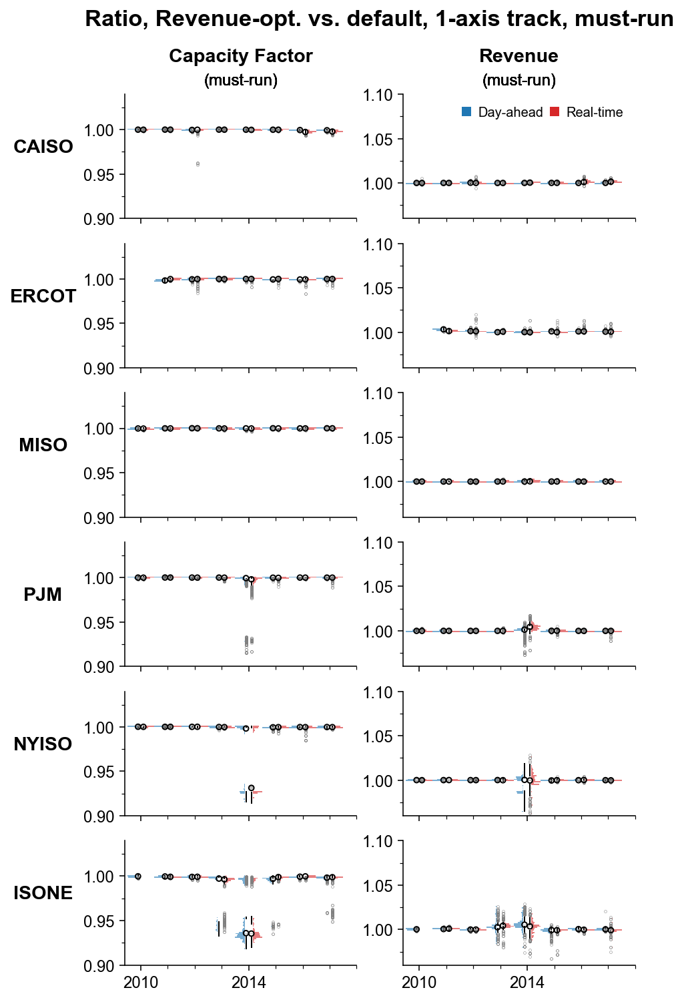

In [39]:
########## Starting absolute values for track CF-opt
### Data-indexed parameters
data = [
    'CF_track,optrev,da,mustrun/CF_track,default,da,mustrun',
    'CF_track,optrev,rt,mustrun/CF_track,default,rt,mustrun',
    'Rev_track,optrev,da,mustrun/Rev_track,default,da,mustrun',
    'Rev_track,optrev,rt,mustrun/Rev_track,default,rt,mustrun',
]
colindex = [0, 0, 1, 1,]
colindex = dict(zip(data, colindex))
direction = ['left','right','left','right',]
direction = dict(zip(data, direction))
color = [mc['da'],mc['rt'],mc['da'],mc['rt'],]
color = dict(zip(data, color))
squeeze = [0.35, 0.35, 0.35, 0.35,]
squeeze = dict(zip(data, squeeze))
plotcols = [slice(None),slice(None),slice(None),slice(None),]
plotcols = dict(zip(data, plotcols))

### Column-indexed parameters
ylim = [
    [0.90, 1.04],
    [0.96,1.10],
]
xlim = [
    [2009.4, 2018],
    [2009.4, 2018],
]

majlocs = [0.05,0.05,0.05,0.05,]
minlocs = [2,2,2,2,]

ylabel = [
    'Capacity Factor',
    'Revenue',
]

note = [
    '(must-run)',
    '(must-run)',
#     '(curtailable)',
#     '(curtailable)',
]
y1 = 1.2     # 1.2 if using note,  1 if no note
y2 = 1.07  # 1.07 if using note, 1.04 if no note

gridspec_kw = {'width_ratios': [2, 2,]}#, 'wspace':0.4}
ncols = len(gridspec_kw['width_ratios'])

### Plot it
plt.close()
f,ax = plt.subplots(6,ncols,sharex='col',sharey=False, gridspec_kw=gridspec_kw,
                    figsize=(sum(gridspec_kw['width_ratios'])*12/7, figheight), 
                   )
for row, iso in enumerate(isos):
    for datum in data:
        dfframe = (dfplot.loc[dfplot.ISOwecc==iso]
                   .pivot(index='ISO:Node',columns='yearlmp',values=datum))

        pvvm.plots.plotquarthist(
            ax=ax[(row,colindex[datum])], dfplot=dfframe[plotcols[datum]], 
            density=True, bootstrap=bootstrap, 
            histcolor=color[datum], hist_range=ylim[colindex[datum]],
            direction=direction[datum], squeeze=squeeze[datum],
            quartpad=(-0.1 if direction[datum] == 'left' else 0.1),
            histpad=(-0.15 if direction[datum] == 'left' else 0.15),
            format_axes=False,
        )

### Format axis
for row, iso in enumerate(isos):
    for col in range(ncols):
        ax[(row,0)].set_ylabel(iso, weight='bold', rotation=0, labelpad=30)
        ### x ticks
        ax[(row,col)].set_xticks([2010,2014])
        ax[(row,col)].set_xticklabels(
            ['2010','2014'], rotation=0, ha='center')
        ax[(row,col)].xaxis.set_minor_locator(AutoMinorLocator(4))
        ax[(row,col)].set_xlim(*xlim[col])
        ### Add title
        ax[(0,col)].set_title(ylabel[col], weight='bold', y=y1, size='x-large')
        ### Add annotation
        ax[(0,col)].annotate(
            note[col], xy=(0.5,1.05), xycoords='axes fraction',
            ha='center', va='bottom', fontsize='large')

        ### Format axis
        ax[(row,col)].set_ylim(*ylim[col])
        ax[(row,col)].yaxis.set_major_locator(MultipleLocator(majlocs[col]))
        ax[(row,col)].yaxis.set_minor_locator(AutoMinorLocator(minlocs[col]))
pvvm.plots.despine(ax)

### Legend
patches = [
    mpl.patches.Patch(
        facecolor=mc[market], edgecolor='none', 
        label=('Day-ahead' if market == 'da' else 'Real-time'))
    for market in ['da','rt']]
leg = ax[(0,-1)].legend(
    handles=patches, loc='upper right', frameon=False, ncol=2,
    columnspacing=0.5, handletextpad=0.5, handlelength=0.7,)

# plt.tight_layout()
## add big axis, hide frame, ticks, and labels
f.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.title('Ratio, Revenue-opt. vs. default, 1-axis track, must-run', 
          weight='bold', y=y2, fontsize='xx-large')

plt.show()

In [40]:
print('ISONE 2014')
display(dfplot.loc[(dfplot.ISOwecc=='ISONE')&(dfplot.yearlmp==2014),data].describe(percentiles=fractions))
print('median')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].median().unstack('ISOwecc'))
print('max')
display(dfplot.groupby(['ISOwecc','yearlmp'])[data].max().unstack('ISOwecc'))
for datum in data:
    print(datum)
    display(dfplot.groupby(['ISOwecc','yearlmp'])[datum].describe(percentiles=fractions).T)

ISONE 2014


,"CF_track,optrev,da,mustrun/CF_track,default,da,mustrun","CF_track,optrev,rt,mustrun/CF_track,default,rt,mustrun","Rev_track,optrev,da,mustrun/Rev_track,default,da,mustrun","Rev_track,optrev,rt,mustrun/Rev_track,default,rt,mustrun"
count,612.000000,612.000000,612.000000,612.000000
mean,0.950009,0.946429,1.006034,1.002358
std,0.026693,0.024231,0.007055,0.007336
min,0.918200,0.919893,0.974291,0.969552
2.5%,0.926324,0.926118,0.993690,0.987178
25%,0.932030,0.931881,1.002899,0.998801
50%,0.935889,0.935391,1.005401,1.003508
75%,0.952117,0.946606,1.008337,1.005644
97.5%,0.998058,0.997715,1.023781,1.016771
max,0.999892,0.999710,1.028671,1.023783


median


CF_track,optrev,da,mustrun/CF_track,default,da,mustrun            \
ISOwecc                                                  CAISO     ERCOT   
yearlmp                                                                    
2010                                              0.999985           NaN   
2011                                              1.000033      0.998260   
2012                                              0.999685      0.999595   
2013                                              1.000026      1.000004   
2014                                              0.999940      1.000019   
2015                                              0.999927      0.999478   
2016                                              0.999552      0.999408   
2017                                              0.999307      0.999938   

                                                             \
ISOwecc     ISONE      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                                       
2010     0.999817  0.999743  1.000120  0.999957         NaN   
2011     0.999637  0.999896  1.000037  1.000037         NaN   
2012     0.999169  1.000027  1.000018  0.999965         NaN   
2013     0.997261  0.999882  0.999821  0.999979         NaN   
2014     0.935889  0.999876  0.998162  0.999359         NaN   
2015     0.996990  1.000003  0.999513  0.999850    0.999989   
2016     0.999358  0.999861  0.999744  0.999960    0.999864   
2017     0.998319  0.999977  0.999785  0.999920    0.999879   

        CF_track,optrev,rt,mustrun/CF_track,default,rt,mustrun            \
ISOwecc                                                  CAISO     ERCOT   
yearlmp                                                                    
2010                                              0.999930           NaN   
2011                                              0.999993      0.999827   
2012                                              0.999886      0.999874   
2013                                              0.999967      0.999841   
2014                                              0.999779      0.999990   
2015                                              0.999944      1.000007   
2016                                              0.997386      0.999543   
2017                                              0.997834      0.999975   

                                                             \
ISOwecc     ISONE      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                                       
2010          NaN  0.999645  1.000018  0.999884         NaN   
2011     0.999259  0.999819  1.000029  1.000008         NaN   
2012     0.999282  0.999987  1.000080  0.999931         NaN   
2013     0.996403  0.999726  0.999714  0.999879         NaN   
2014     0.935391  0.999751  0.931320  0.998010         NaN   
2015     0.998985  0.999854  0.999666  0.999671    1.000085   
2016     0.999770  0.999854  0.999680  0.999920    0.998704   
2017     0.998821  0.999948  0.999661  0.999908    0.999192   

        Rev_track,optrev,da,mustrun/Rev_track,default,da,mustrun            \
ISOwecc                                                    CAISO     ERCOT   
yearlmp                                                                      
2010                                              1.000017             NaN   
2011                                              1.000026        1.003243   
2012                                              1.000277        1.001375   
2013                                              1.000001        1.000107   
2014                                              1.000070        1.000191   
2015                                              1.000084        1.001089   
2016                                              1.000000        1.000978   
2017                                              1.000096        1.000686   

                                                             \
ISOwecc     ISONE      M

max


CF_track,optrev,da,mustrun/CF_track,default,da,mustrun            \
ISOwecc                                                  CAISO     ERCOT   
yearlmp                                                                    
2010                                              1.001172           NaN   
2011                                              1.000752      1.000604   
2012                                              1.001394      1.000677   
2013                                              1.000664      1.000958   
2014                                              1.000597      1.000674   
2015                                              1.000596      1.000215   
2016                                              1.000345      1.000269   
2017                                              1.000641      1.000774   

                                                             \
ISOwecc     ISONE      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                                       
2010     1.000792  1.000794  1.000564  1.000627         NaN   
2011     1.000835  1.000761  1.000658  1.000732         NaN   
2012     1.000466  1.001388  1.000449  1.000473         NaN   
2013     1.000032  1.001649  1.000309  1.000529         NaN   
2014     0.999892  1.000269  1.000656  1.000427         NaN   
2015     1.000164  1.000819  1.000443  1.000436    1.001821   
2016     1.000411  1.000922  1.000303  1.000406    1.000633   
2017     1.000206  1.001420  1.000371  1.000549    1.001046   

        CF_track,optrev,rt,mustrun/CF_track,default,rt,mustrun            \
ISOwecc                                                  CAISO     ERCOT   
yearlmp                                                                    
2010                                              1.001016           NaN   
2011                                              1.001044      1.000943   
2012                                              1.000467      1.000692   
2013                                              1.000619      1.000989   
2014                                              1.000618      1.000593   
2015                                              1.000656      1.000478   
2016                                              1.000005      1.000327   
2017                                              1.000352      1.000698   

                                                             \
ISOwecc     ISONE      MISO     NYISO       PJM WECC -CAISO   
yearlmp                                                       
2010          NaN  1.000706  1.000544  1.000627         NaN   
2011     1.000672  1.000631  1.000683  1.000790         NaN   
2012     1.000496  1.001374  1.000460  1.000475         NaN   
2013     0.999847  1.001649  1.000311  1.000412         NaN   
2014     0.999710  1.000188  1.000880  1.000436         NaN   
2015     1.000146  1.000565  1.000458  1.000375    1.001572   
2016     1.000582  1.000957  1.000316  1.000394    1.001466   
2017     1.000245  1.001325  1.000398  1.000490    1.001047   

        Rev_track,optrev,da,mustrun/Rev_track,default,da,mustrun            \
ISOwecc                                                    CAISO     ERCOT   
yearlmp                                                                      
2010                                              1.001072             NaN   
2011                                              1.000690        1.004820   
2012                                              1.003277        1.005793   
2013                                              1.000678        1.002354   
2014                                              1.000690        1.004980   
2015                                              1.000787        1.002898   
2016                                              1.000819        1.004871   
2017                                              1.003549        1.007363   

                                                             \
ISOwecc     ISONE      M

CF_track,optrev,da,mustrun/CF_track,default,da,mustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        0.999989     1.000036     0.999626     1.000035     0.999946   
std         0.000157     0.000164     0.000437     0.000135     0.000156   
min         0.999507     0.999010     0.996916     0.999611     0.999337   
2.5%        0.999701     0.999810     0.998631     0.999817     0.999666   
25%         0.999889     0.999940     0.999459     0.999935     0.999844   
50%         0.999985     1.000033     0.999685     1.000026     0.999940   
75%         1.000091     1.000126     0.999855     1.000119     1.000047   
97.5%       1.000288     1.000412     1.000368     1.000366     1.000258   
max         1.001172     1.000752     1.001394     1.000664     1.000597   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        0.999904     0.999538     0.999243     0.998297     0.999530   
std         0.000213     0.000278     0.000488     0.000833     0.000461   
min         0.999000     0.998489     0.996503     0.996148     0.993974   
2.5%        0.999461     0.998916     0.998220     0.996782     0.998574   
25%         0.999774     0.999365     0.998920     0.997646     0.999354   
50%         0.999927     0.999552     0.999307     0.998260     0.999595   
75%         1.000046     0.999742     0.999574     0.999035     0.999780   
97.5%       1.000266     1.000001     1.000061     0.999684     1.000129   
max         1.000596     1.000345     1.000641     1.000604     1.000677   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        0.999986     0.999996     0.999471     0.999381     0.999887   
std         0.000232     0.000267     0.000285     0.000368     0.000360   
min         0.997341     0.996037     0.997873     0.995912     0.993465   
2.5%        0.999406     0.999629     0.998932     0.998653     0.999233   
25%         0.999901     0.999916     0.999289     0.999196     0.999784   
50%         1.000004     1.000019     0.999478     0.999408     0.999938   
75%         1.000106     1.000125     0.999668     0.999642     1.000075   
97.5%       1.000316     1.000274     1.000013     0.999940     1.000288   
max         1.000958     1.000674     1.000215     1.000269     1.000774   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       0.999752    0.999610    0.999057    0.980385    0.950009   
std        0.000504    0.000434    0.000792    0.025369    0.026693   
min        0.997061    0.998374    0.995640    0.932733    0.918200   
2.5%       0.998804    0.998800    0.997245    0.938519    0.926324   
25%        0.999488    0.999303    0.998592    0.948533    0.932030   
50%        0.999817    0.999637    0.999169    0.997261    0.935889   
75%        1.000058    0.999892    0.999749    0.998555    0.952117   
97.5%      1.000566    1.000387    1.000203    0.999769    0.998058   
max        1.000792    1.000835    1.000466    1.000032    0.999892   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       0.994812    0.999229    0.997968    0.999670    0.999895   
std        0.009748    0.000657    0.003020    0.000372    0.000259   
min        0.934893    0.995072    0.958328    0.9986

CF_track,optrev,rt,mustrun/CF_track,default,rt,mustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        0.999669     0.999969     0.999658     0.999953     0.999774   
std         0.004982     0.000238     0.001726     0.000172     0.000225   
min         0.884374     0.998256     0.960139     0.998812     0.998682   
2.5%        0.999191     0.999447     0.998218     0.999620     0.999330   
25%         0.999794     0.999879     0.999622     0.999857     0.999627   
50%         0.999930     0.999993     0.999886     0.999967     0.999779   
75%         1.000057     1.000097     1.000023     1.000059     0.999919   
97.5%       1.000260     1.000355     1.000220     1.000309     1.000172   
max         1.001016     1.001044     1.000467     1.000619     1.000618   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        0.999888     0.997326     0.997816     0.999640     0.999729   
std         0.000285     0.001135     0.000892     0.000542     0.000997   
min         0.998280     0.993306     0.993499     0.997640     0.984333   
2.5%        0.999152     0.994729     0.996035     0.998335     0.998386   
25%         0.999764     0.996661     0.997235     0.999338     0.999671   
50%         0.999944     0.997386     0.997834     0.999827     0.999874   
75%         1.000073     0.998117     0.998486     1.000043     1.000032   
97.5%       1.000274     0.999322     0.999333     1.000282     1.000275   
max         1.000656     1.000005     1.000352     1.000943     1.000692   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        0.999788     0.999919     0.999954     0.999424     0.999883   
std         0.000341     0.000485     0.000463     0.000833     0.000565   
min         0.997181     0.991247     0.990183     0.983468     0.990033   
2.5%        0.998832     0.999062     0.999378     0.998364     0.998995   
25%         0.999682     0.999877     0.999903     0.999271     0.999806   
50%         0.999841     0.999990     1.000007     0.999543     0.999975   
75%         0.999973     1.000101     1.000109     0.999745     1.000113   
97.5%       1.000242     1.000240     1.000238     1.000079     1.000304   
max         1.000989     1.000593     1.000478     1.000327     1.000698   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    0.999211    0.999139    0.991287    0.946429    0.998033   
std       NaN    0.000545    0.000777    0.014686    0.024231    0.005305   
min       NaN    0.997678    0.995294    0.937190    0.919893    0.943020   
2.5%      NaN    0.998111    0.997404    0.946293    0.926118    0.994446   
25%       NaN    0.998849    0.998686    0.994612    0.931881    0.997925   
50%       NaN    0.999259    0.999282    0.996403    0.935391    0.998985   
75%       NaN    0.999535    0.999766    0.997252    0.946606    0.999514   
97.5%     NaN    1.000187    1.000181    0.999339    0.997715    0.999997   
max       NaN    1.000672    1.000496    0.999847    0.999710    1.000146   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       0.999637    0.997008    0.999528    0.999729    0.999939   
std        0.000565    0.008189    0.000545    0.000

Rev_track,optrev,da,mustrun/Rev_track,default,da,mustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2118.000000  2121.000000  2150.000000  2204.000000  2234.000000   
mean        1.000039     1.000046     1.000427     1.000013     1.000105   
std         0.000122     0.000097     0.000486     0.000090     0.000134   
min         0.999513     0.999418     0.999624     0.999638     0.999775   
2.5%        0.999818     0.999917     0.999903     0.999861     0.999927   
25%         0.999985     0.999998     1.000075     0.999967     1.000011   
50%         1.000017     1.000026     1.000277     1.000001     1.000070   
75%         1.000078     1.000068     1.000619     1.000045     1.000178   
97.5%       1.000335     1.000313     1.001623     1.000211     1.000453   
max         1.001072     1.000690     1.003277     1.000678     1.000690   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1559.000000  1563.000000   
mean        1.000094     1.000028     1.000141     1.003246     1.001402   
std         0.000173     0.000217     0.000311     0.000742     0.000504   
min         0.999570     0.999124     0.999107     1.000480     1.000080   
2.5%        0.999798     0.999651     0.999705     1.001813     1.000647   
25%         0.999978     0.999894     0.999981     1.002699     1.001142   
50%         1.000084     1.000000     1.000096     1.003243     1.001375   
75%         1.000192     1.000120     1.000226     1.003915     1.001634   
97.5%       1.000475     1.000577     1.000955     1.004391     1.002098   
max         1.000787     1.000819     1.003549     1.004820     1.005793   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1569.000000  1570.000000  1570.000000  1563.000000   
mean        1.000148     1.000240     1.001117     1.001006     1.000764   
std         0.000203     0.000311     0.000307     0.000315     0.000451   
min         0.999857     0.999438     1.000299     1.000051     0.999852   
2.5%        0.999965     0.999998     1.000647     1.000513     1.000292   
25%         1.000060     1.000132     1.000905     1.000828     1.000534   
50%         1.000107     1.000191     1.001089     1.000978     1.000686   
75%         1.000186     1.000268     1.001269     1.001120     1.000881   
97.5%       1.000789     1.000603     1.001830     1.001869     1.001820   
max         1.002354     1.004980     1.002898     1.004871     1.007363   

ISOwecc       ISONE                                                  \
yearlmp        2010        2011        2012        2013        2014   
count    409.000000  437.000000  499.000000  593.000000  612.000000   
mean       1.000208    1.000573    0.999847    1.003006    1.006034   
std        0.000491    0.000434    0.000560    0.005256    0.007055   
min        0.998227    0.999381    0.997632    0.983600    0.974291   
2.5%       0.999214    0.999973    0.998596    0.990798    0.993690   
25%        0.999975    1.000305    0.999527    1.001058    1.002899   
50%        1.000232    1.000502    0.999896    1.002520    1.005401   
75%        1.000430    1.000811    1.000145    1.004620    1.008337   
97.5%      1.001142    1.001551    1.000819    1.017351    1.023781   
max        1.001377    1.002973    1.001102    1.025779    1.028671   

ISOwecc                                            MISO              \
yearlmp        2015        2016        2017        2010        2011   
count    746.000000  829.000000  966.000000  179.000000  192.000000   
mean       0.998664    1.000331    1.000162    1.000053    1.000062   
std        0.003073    0.000500    0.000914    0.000233    0.000152   
min        0.966893    0.998250    0.997615    0.9990

Rev_track,optrev,rt,mustrun/Rev_track,default,rt,mustrun


ISOwecc        CAISO                                                      \
yearlmp         2010         2011         2012         2013         2014   
count    2114.000000  2121.000000  2150.000000  2205.000000  2234.000000   
mean        1.000039     1.000059     1.000364     1.000049     1.000418   
std         0.000290     0.000194     0.000767     0.000189     0.000277   
min         0.997717     0.999441     0.993888     0.998633     0.999606   
2.5%        0.999596     0.999762     0.999648     0.999746     0.999992   
25%         0.999923     0.999968     0.999974     0.999962     1.000229   
50%         1.000006     1.000024     1.000042     1.000013     1.000377   
75%         1.000101     1.000106     1.000582     1.000108     1.000566   
97.5%       1.000673     1.000592     1.002819     1.000583     1.001075   
max         1.005547     1.001565     1.007822     1.001768     1.001584   

ISOwecc                                               ERCOT               \
yearlmp         2015         2016         2017         2011         2012   
count    2236.000000  2237.000000  2209.000000  1560.000000  1563.000000   
mean        1.000170     1.001361     1.001523     1.001475     1.001200   
std         0.000244     0.001318     0.000750     0.000964     0.001128   
min         0.999220     0.996528     0.999546     0.999200     0.993535   
2.5%        0.999772     0.999163     1.000470     0.999857     1.000036   
25%         1.000014     1.000402     1.001010     1.000754     1.000926   
50%         1.000120     1.001023     1.001412     1.001344     1.001156   
75%         1.000285     1.002433     1.001901     1.002350     1.001392   
97.5%       1.000695     1.003724     1.003406     1.003220     1.002498   
max         1.002090     1.007918     1.006125     1.003629     1.019852   

ISOwecc                                                                   \
yearlmp         2013         2014         2015         2016         2017   
count    1567.000000  1570.000000  1572.000000  1570.000000  1564.000000   
mean        1.000779     1.000030     1.000185     1.001243     1.000899   
std         0.000418     0.000552     0.000648     0.000928     0.000912   
min         0.998885     0.998074     0.995243     0.999125     0.995641   
2.5%        1.000061     0.999577     0.999847     1.000420     1.000081   
25%         1.000611     0.999960     1.000033     1.000886     1.000428   
50%         1.000766     1.000007     1.000103     1.001062     1.000620   
75%         1.000905     1.000051     1.000200     1.001317     1.001317   
97.5%       1.001870     1.000482     1.000795     1.003005     1.002888   
max         1.003758     1.013000     1.013555     1.013189     1.010200   

ISOwecc ISONE                                                              \
yearlmp  2010        2011        2012        2013        2014        2015   
count     0.0  437.000000  499.000000  593.000000  612.000000  746.000000   
mean      NaN    1.000937    0.999840    1.004304    1.002358    0.998684   
std       NaN    0.000581    0.000530    0.003802    0.007336    0.002826   
min       NaN    0.999329    0.997026    0.980139    0.969552    0.971525   
2.5%      NaN    1.000027    0.998743    0.997771    0.987178    0.995138   
25%       NaN    1.000567    0.999571    1.002966    0.998801    0.998340   
50%       NaN    1.000912    0.999907    1.004215    1.003508    0.999214   
75%       NaN    1.001290    1.000161    1.005822    1.005644    0.999848   
97.5%     NaN    1.002173    1.000673    1.011365    1.016771    1.000410   
max       NaN    1.003724    1.000950    1.020453    1.023783    1.002979   

ISOwecc                                MISO                          \
yearlmp        2016        2017        2010        2011        2012   
count    829.000000  966.000000  179.000000  192.000000  197.000000   
mean       0.999551    0.999056    1.000090    1.000097    1.000045   
std        0.000667    0.001964    0.000319    0.000

# Supplementary information

## Geographic data

In [15]:
dfmap = dfplot.merge(
    dfin[['ISO:Node','yearlmp','Latitude','Longitude']].drop_duplicates(['ISO:Node','yearlmp']),
    on=['ISO:Node','yearlmp'], how='left'
).copy()

##############################
OptRev_Azimuth(rt)(curtail)
##############################


/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


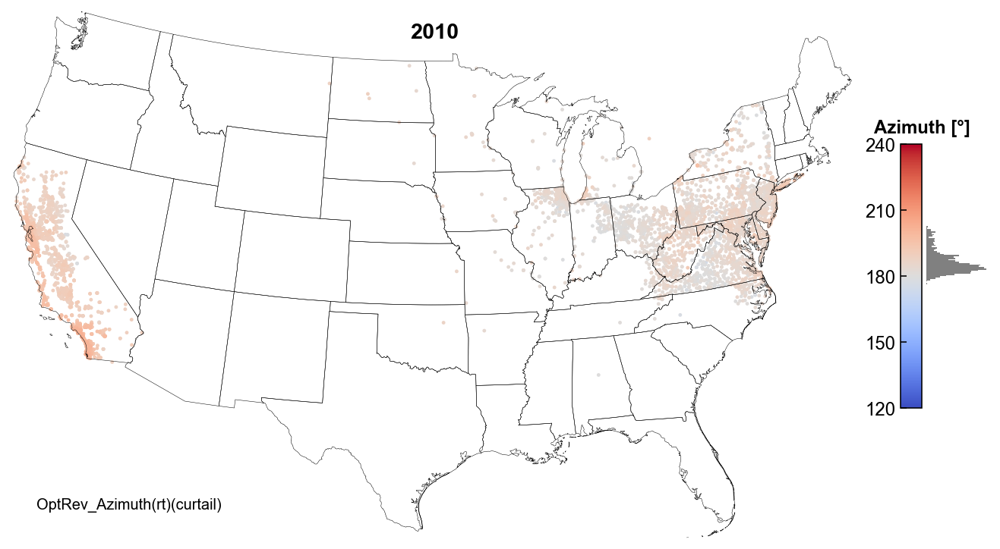

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


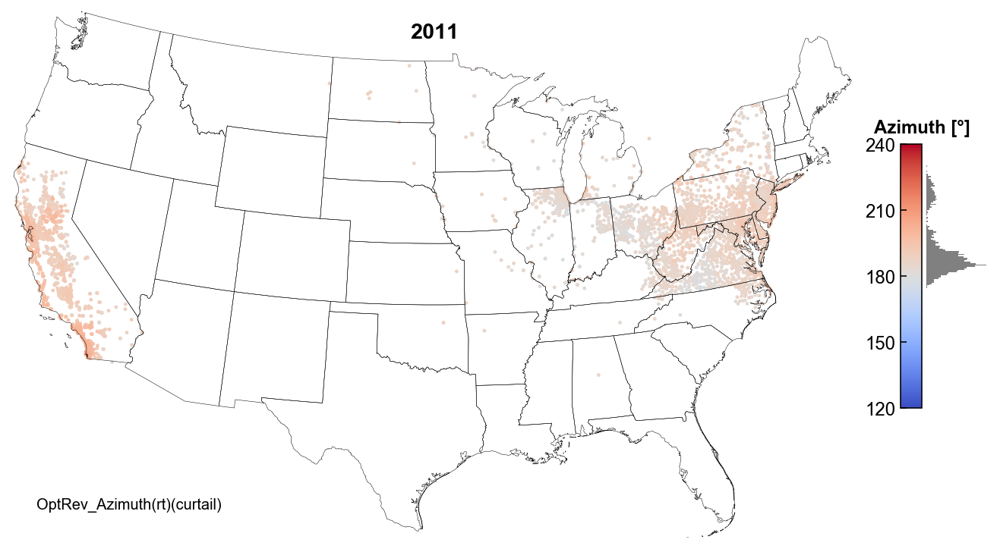

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


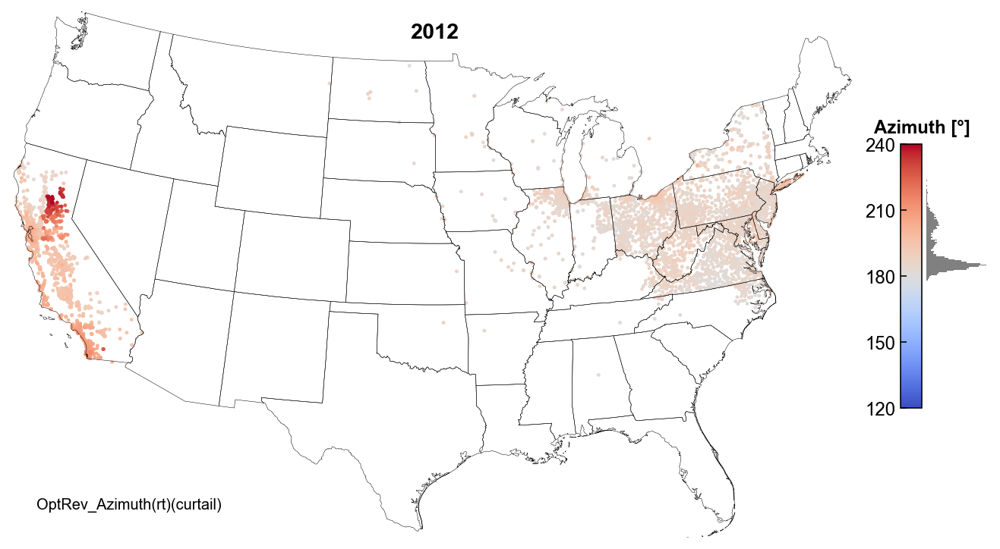

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


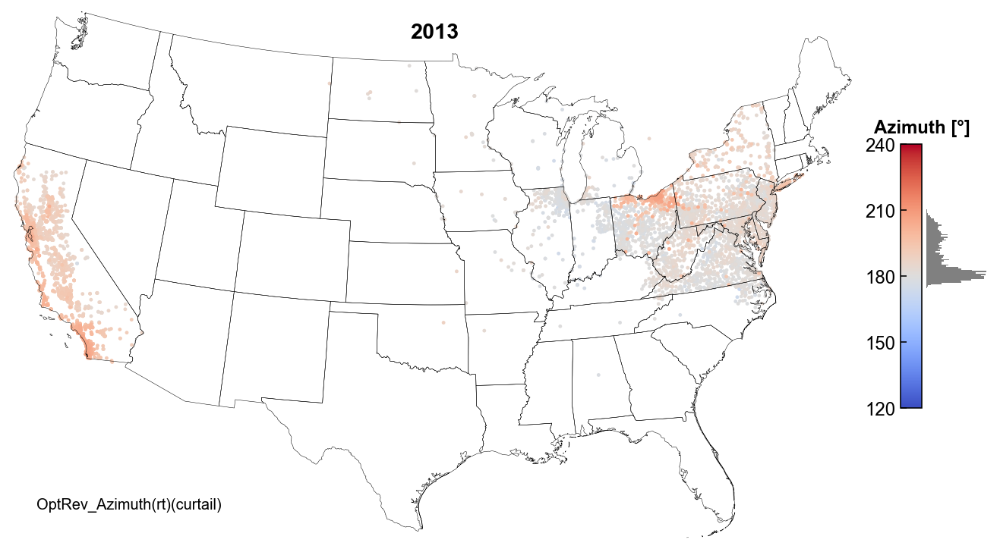

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


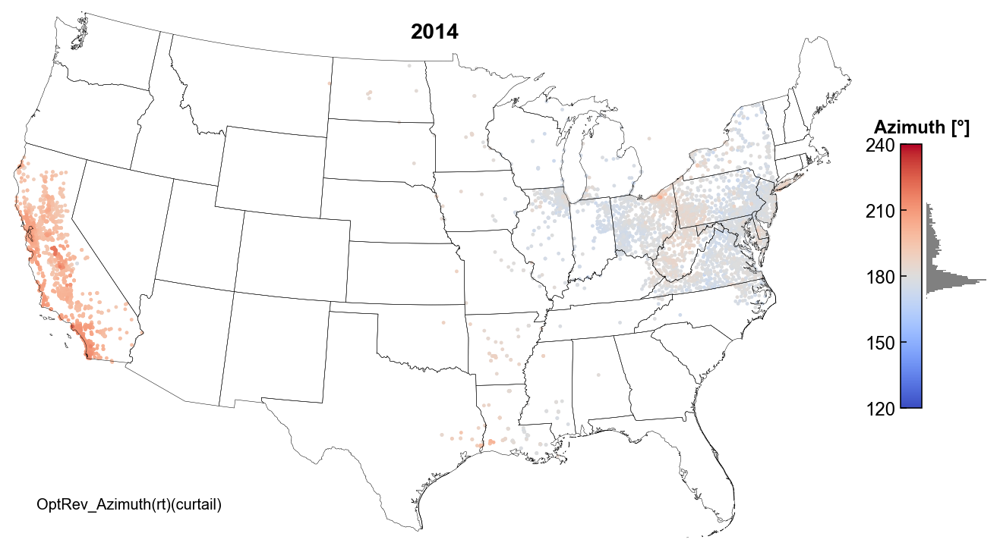

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


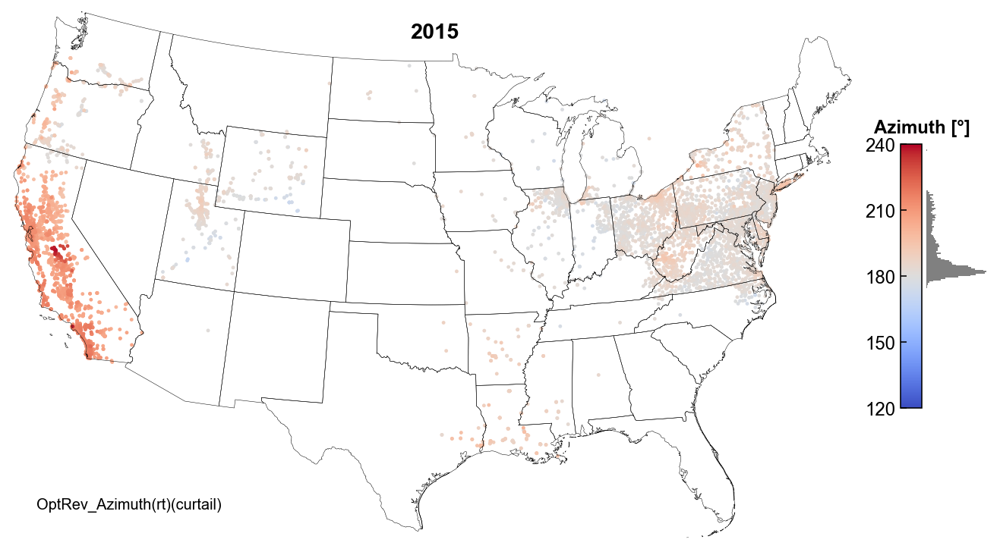

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


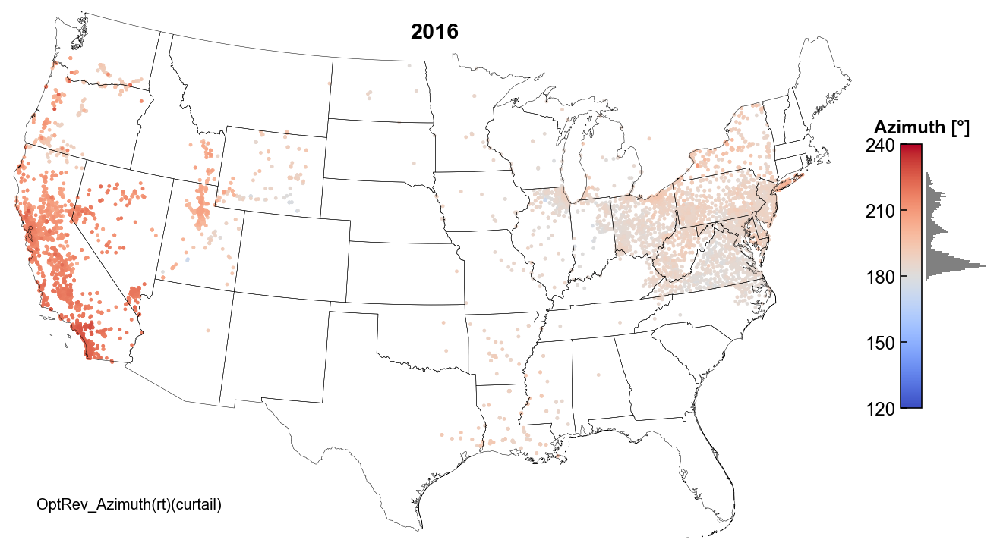

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


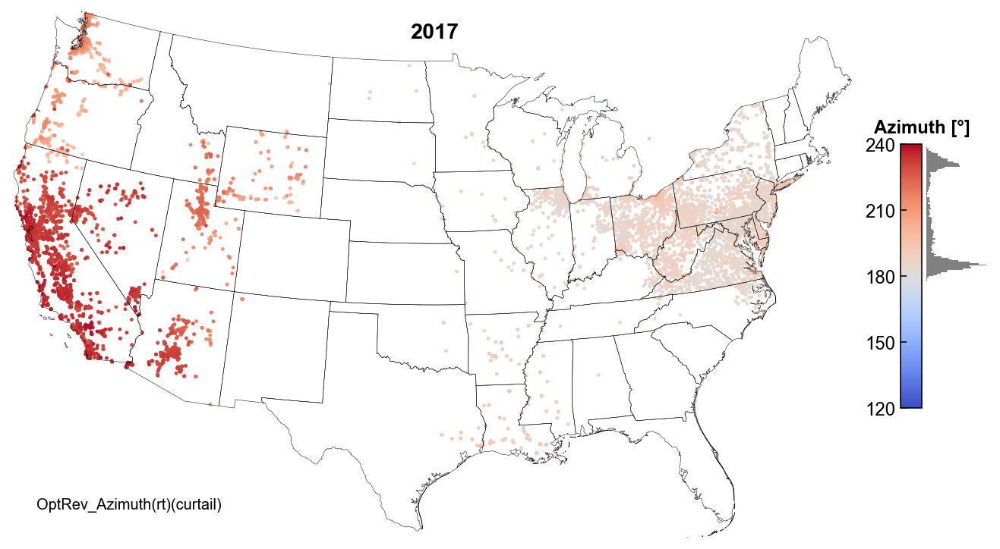

##############################
OptRev_Tilt(rt)(curtail)
##############################


/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


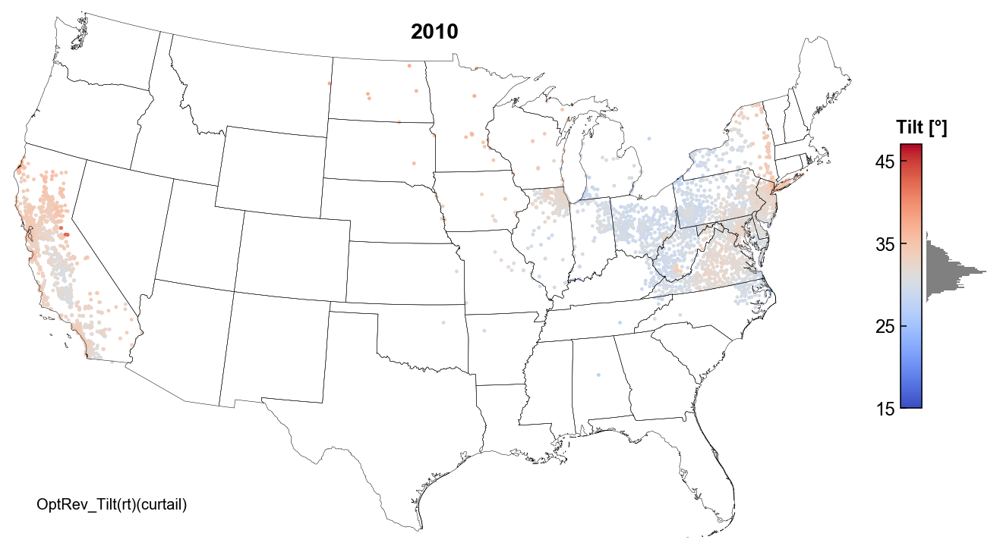

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


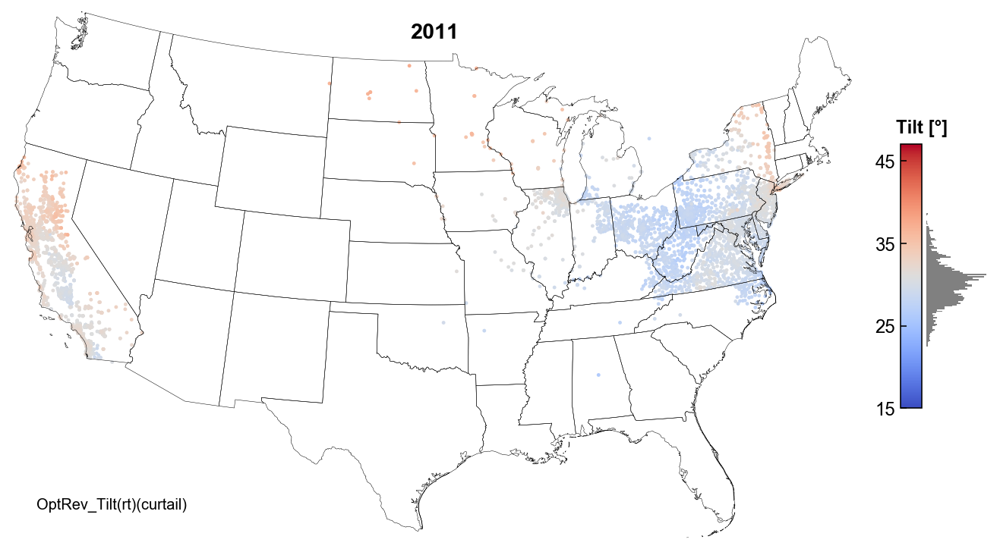

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


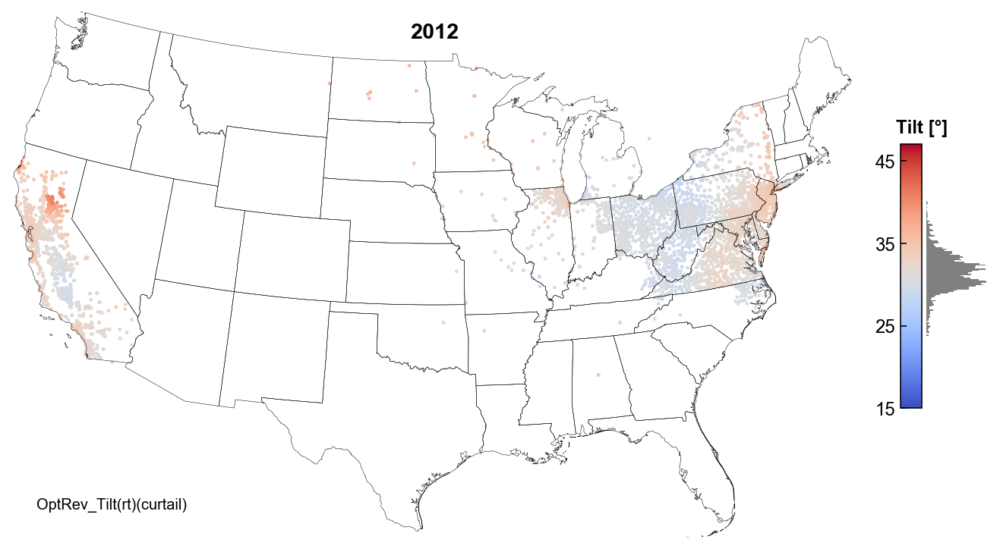

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


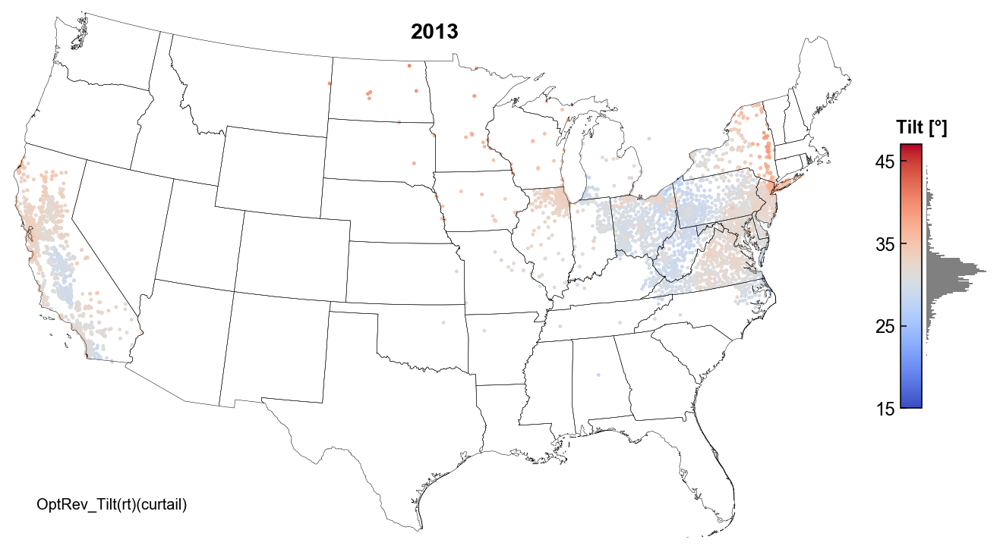

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


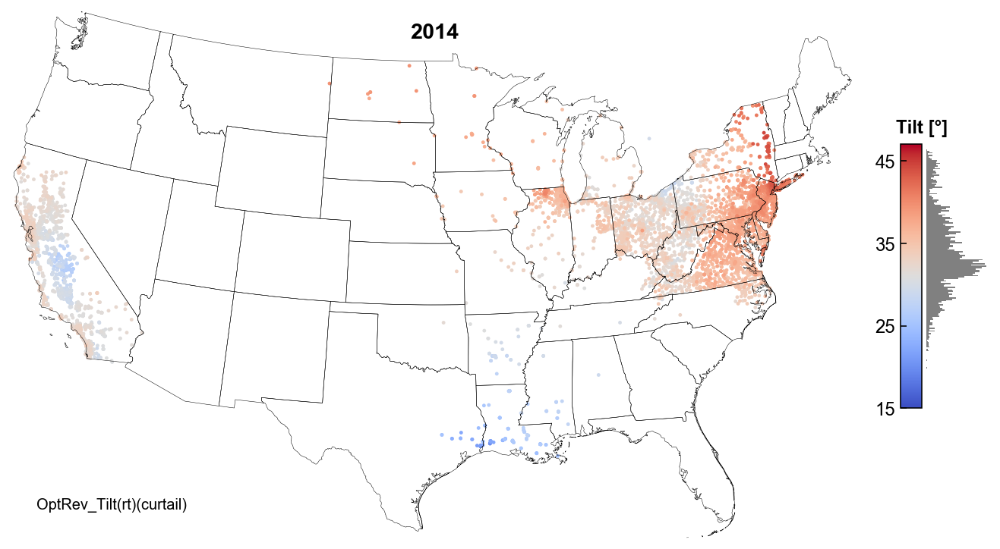

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


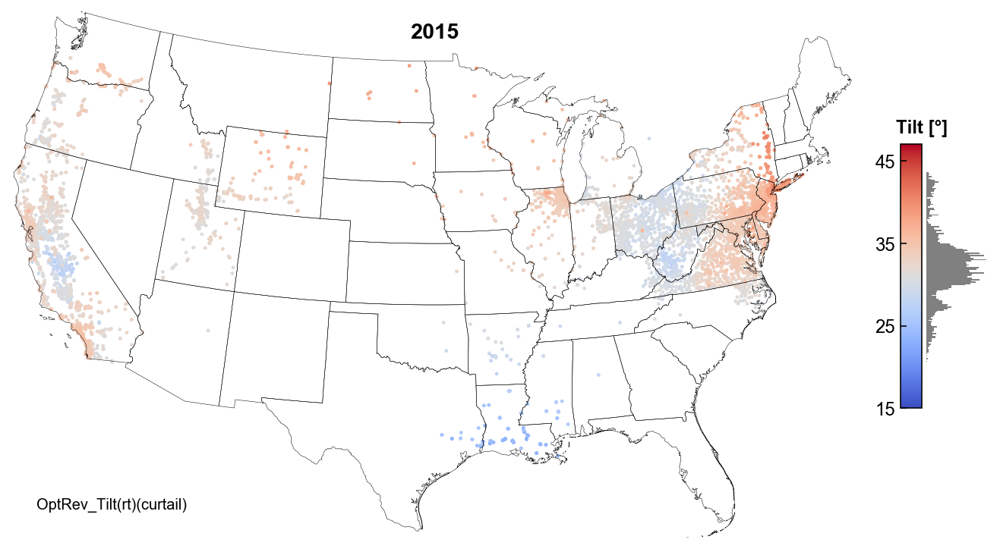

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


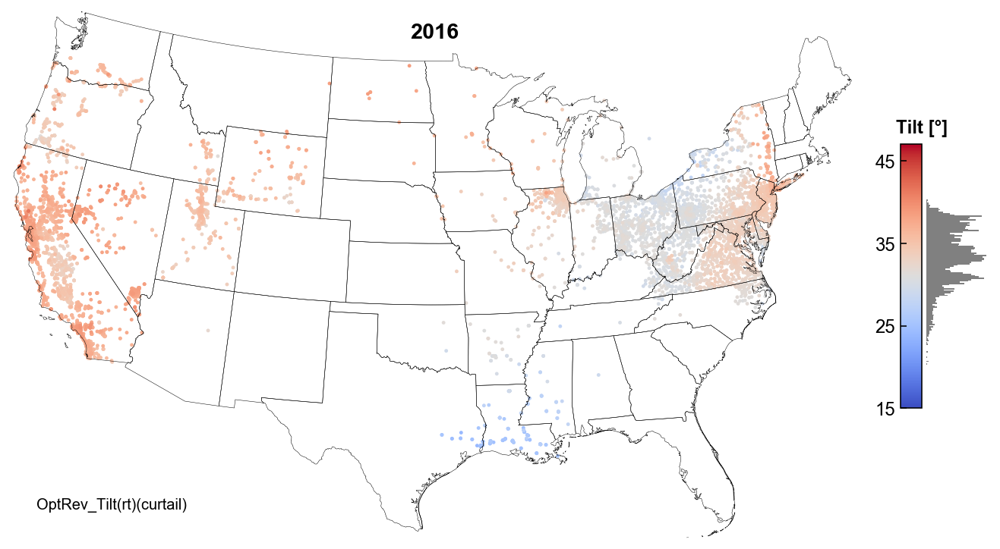

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


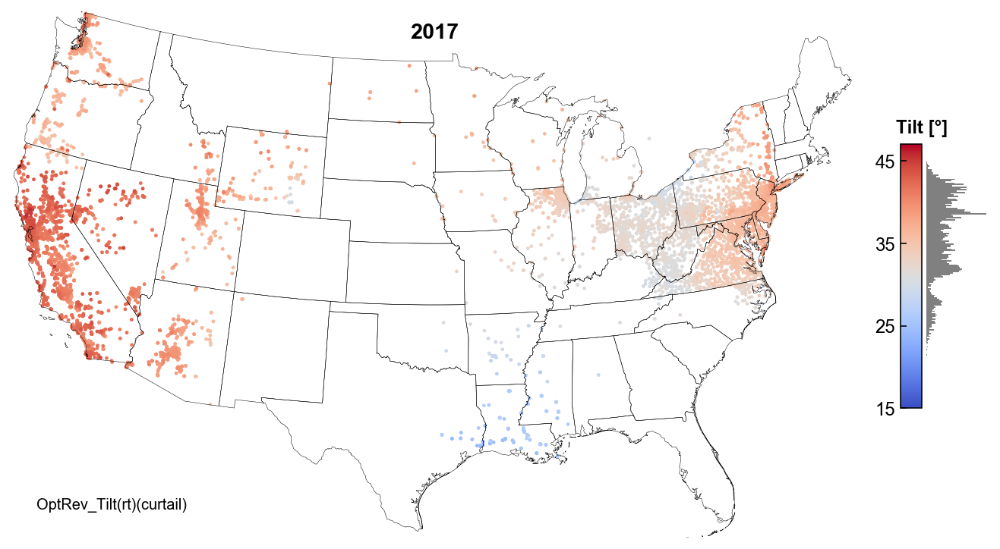

##############################
Revenue_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun
##############################


/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


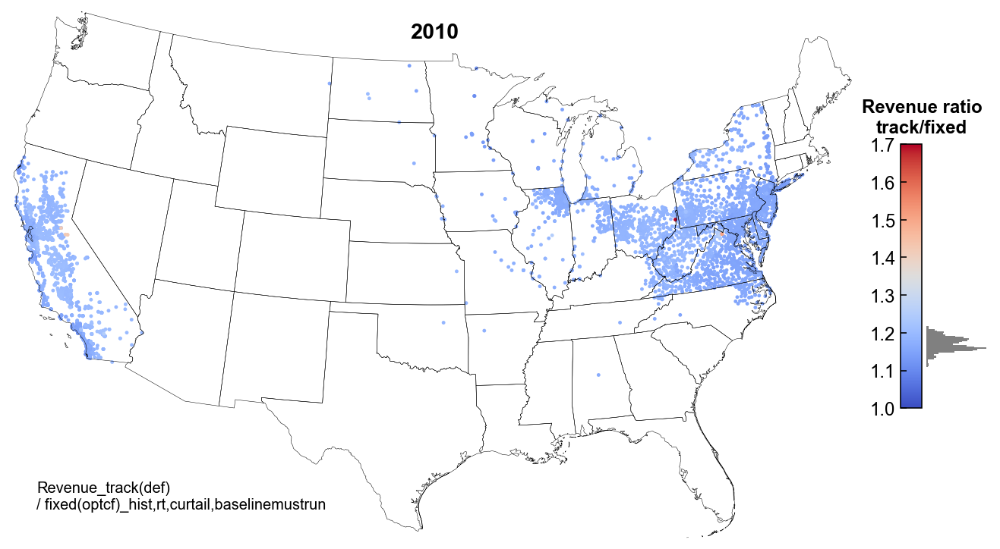

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


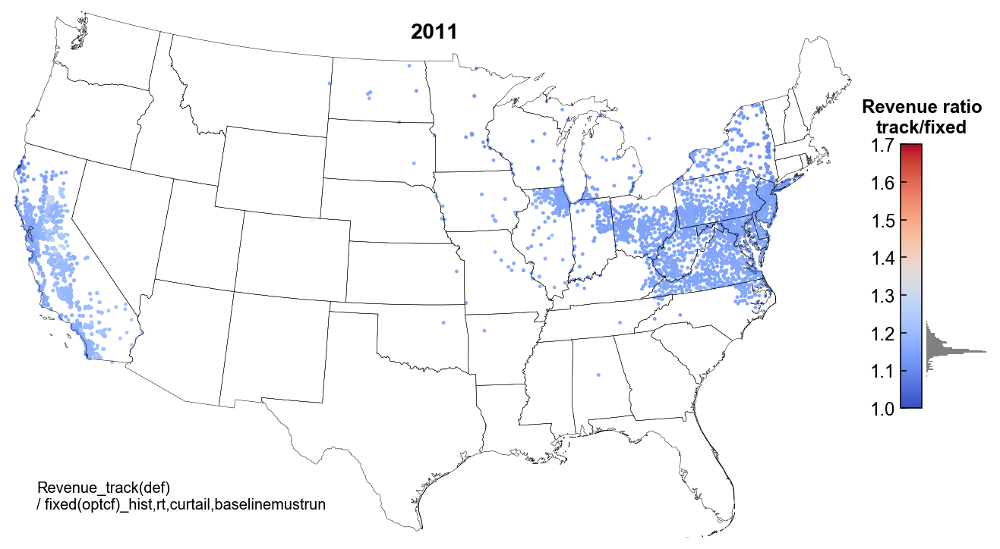

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


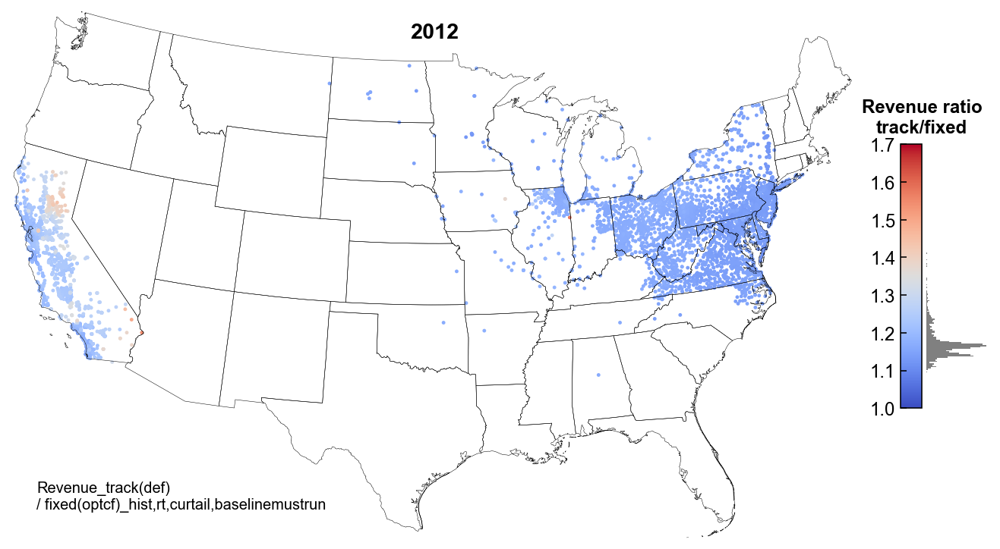

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


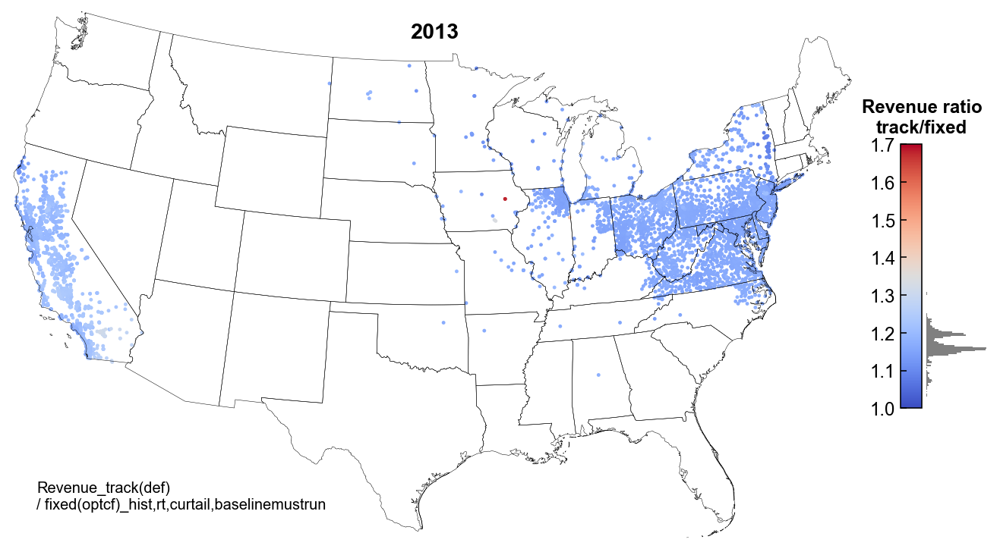

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


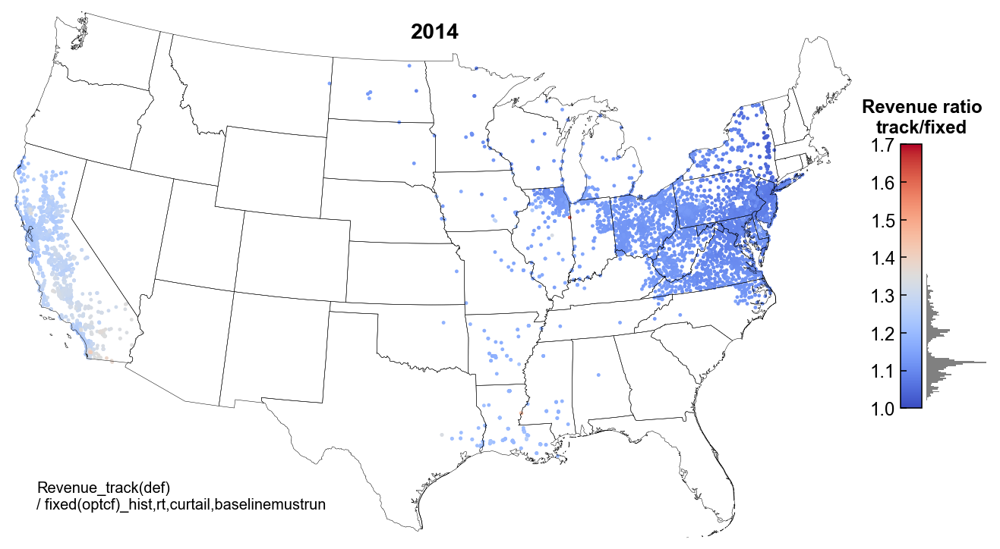

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


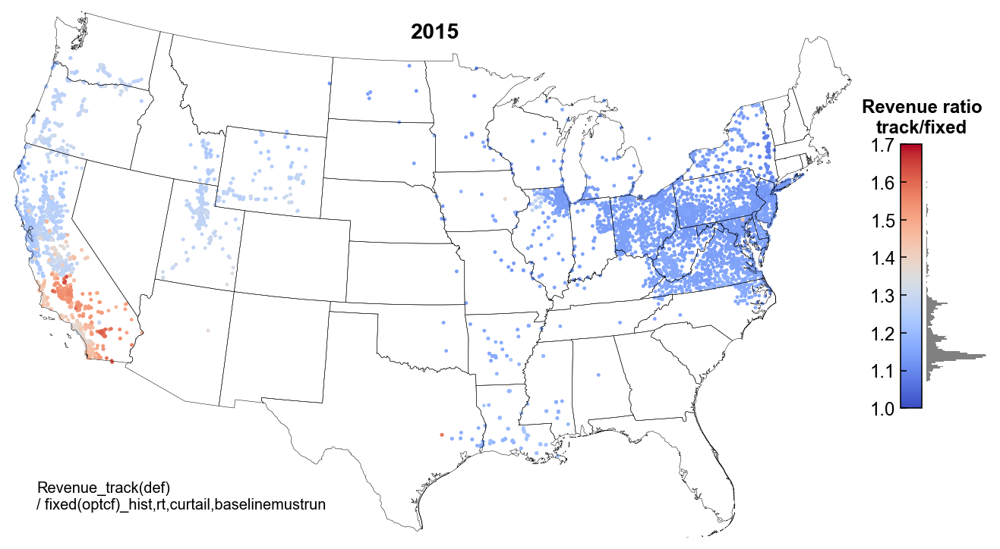

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


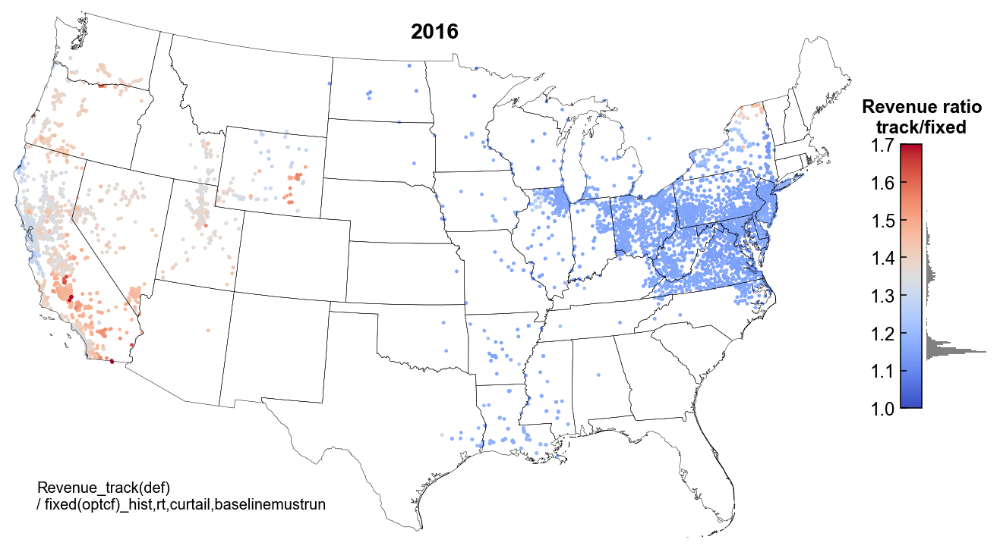

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


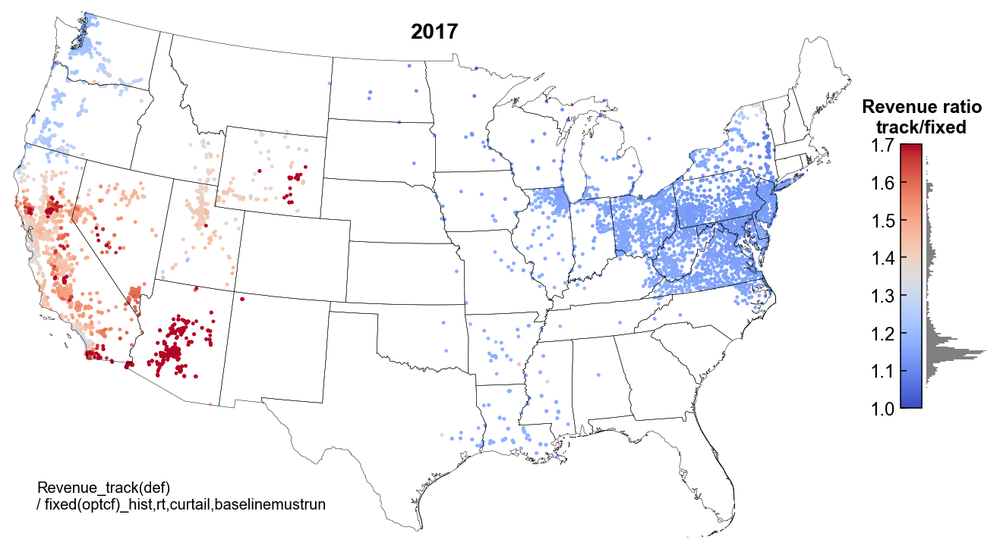

##############################
Rev_curtail/Rev_mustrun(fixed)(rt)
##############################


/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


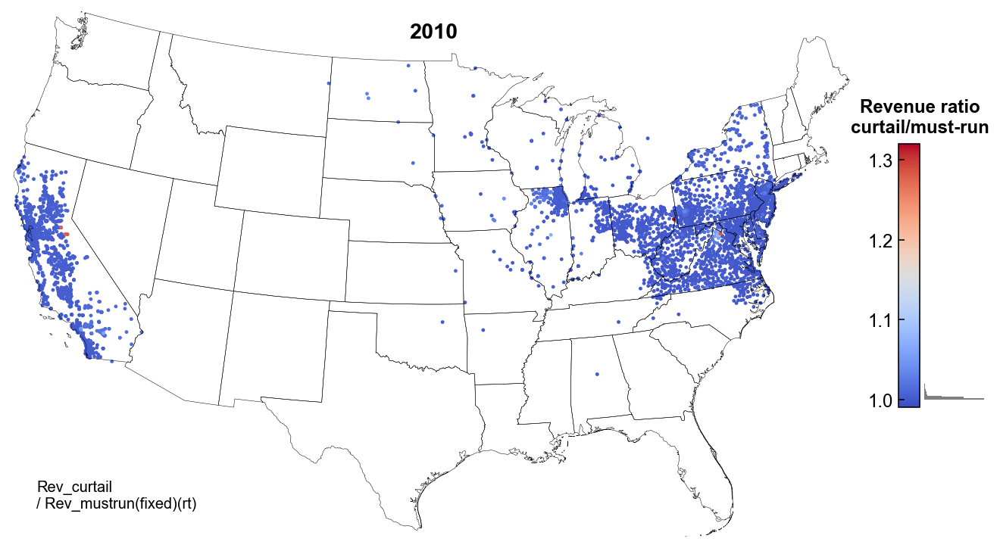

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


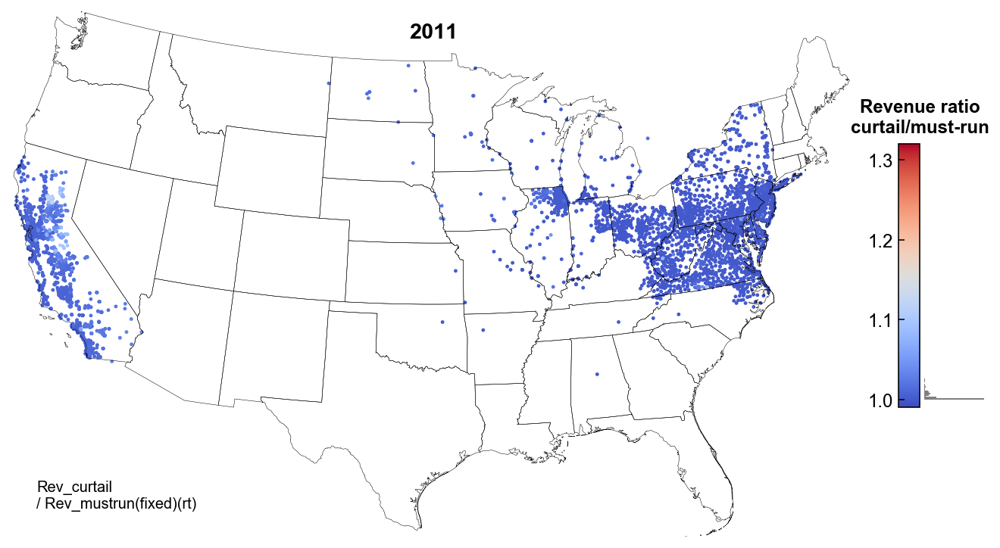

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


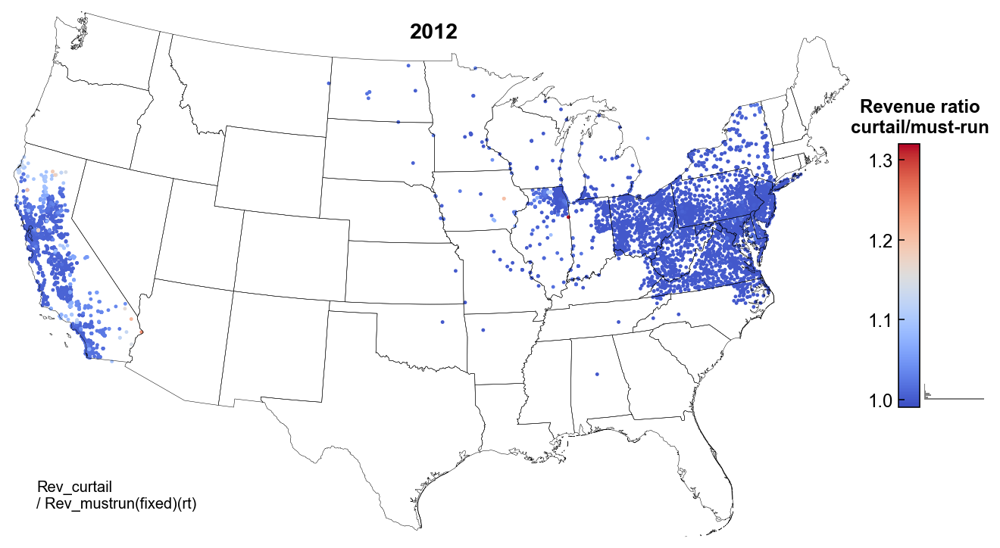

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


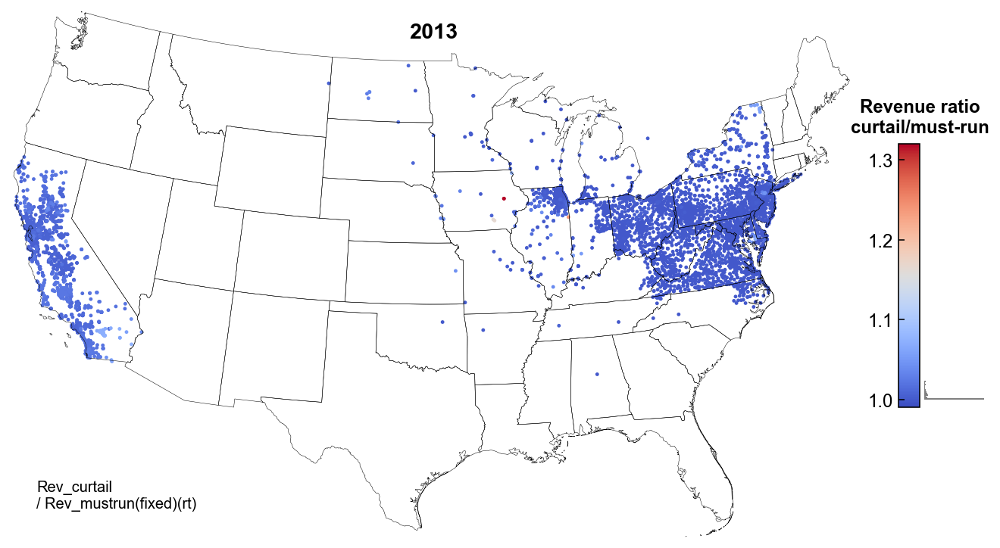

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


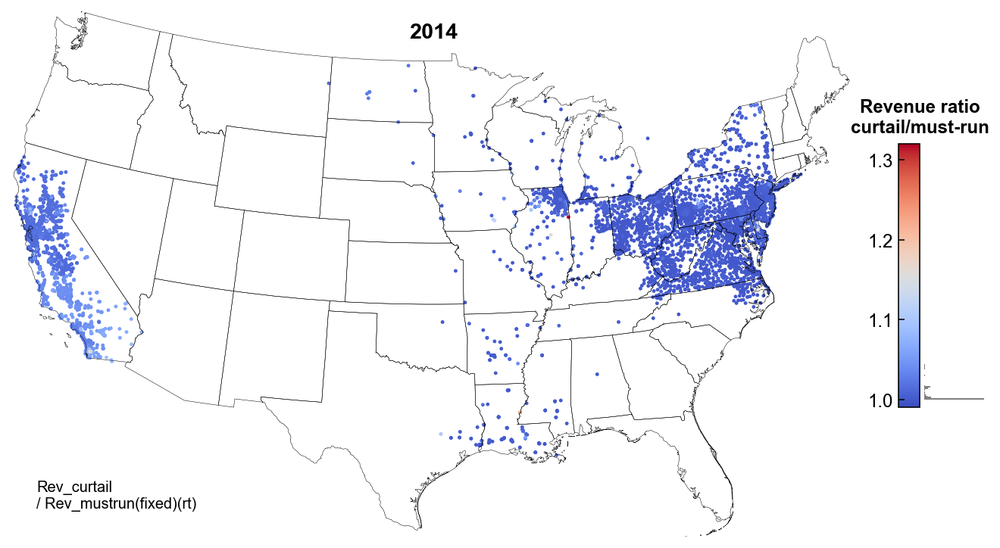

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


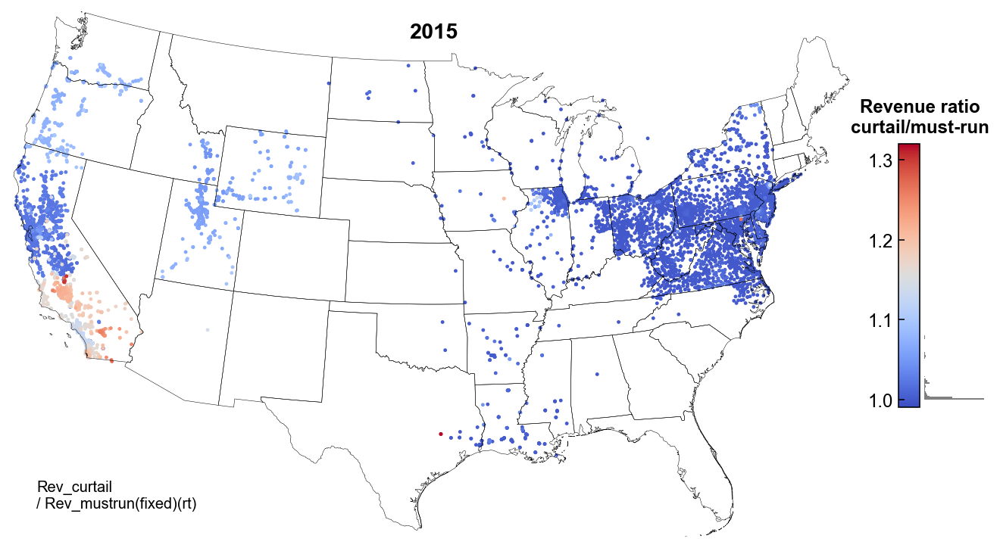

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


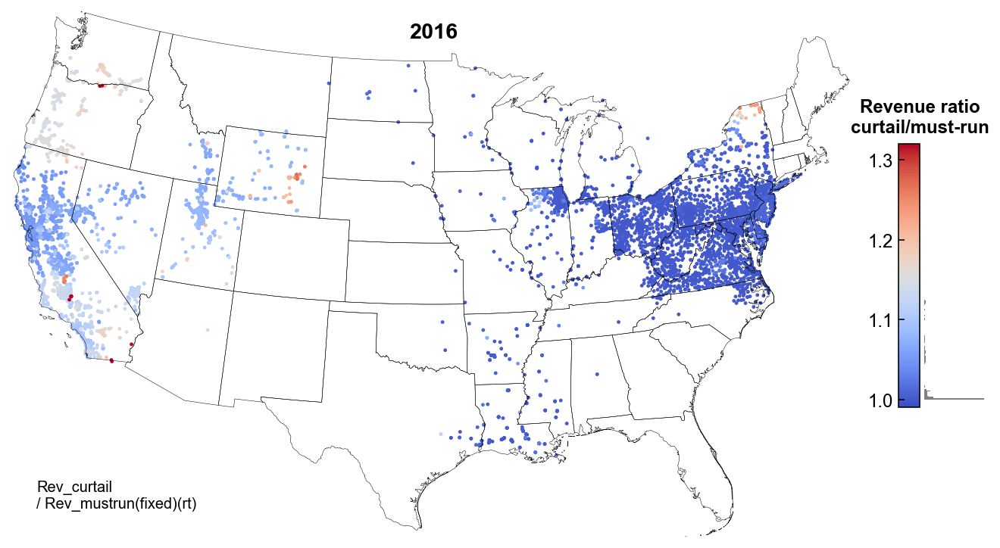

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


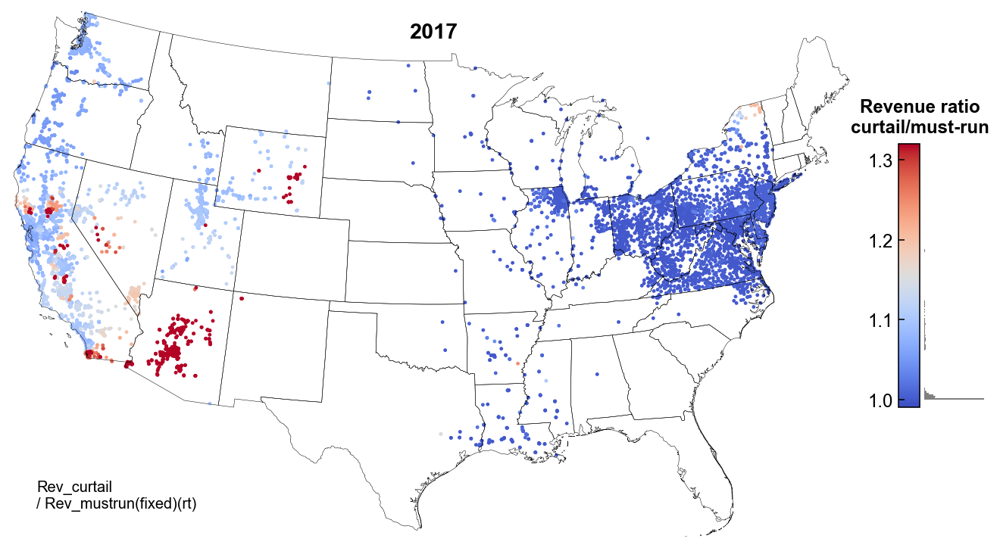

##############################
Rev_OptRev/OptCF_hist,rt,f,curtail,baselinemustrun
##############################


/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


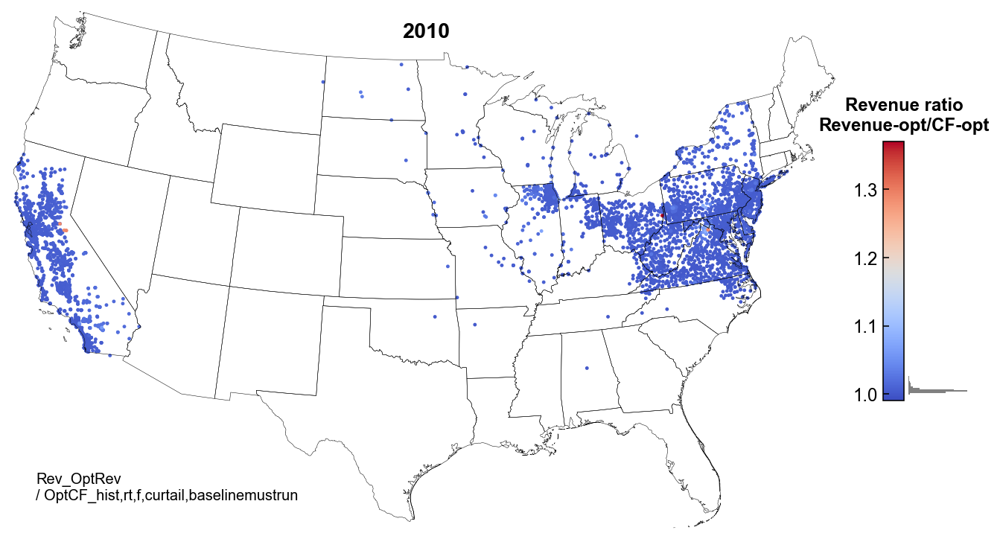

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


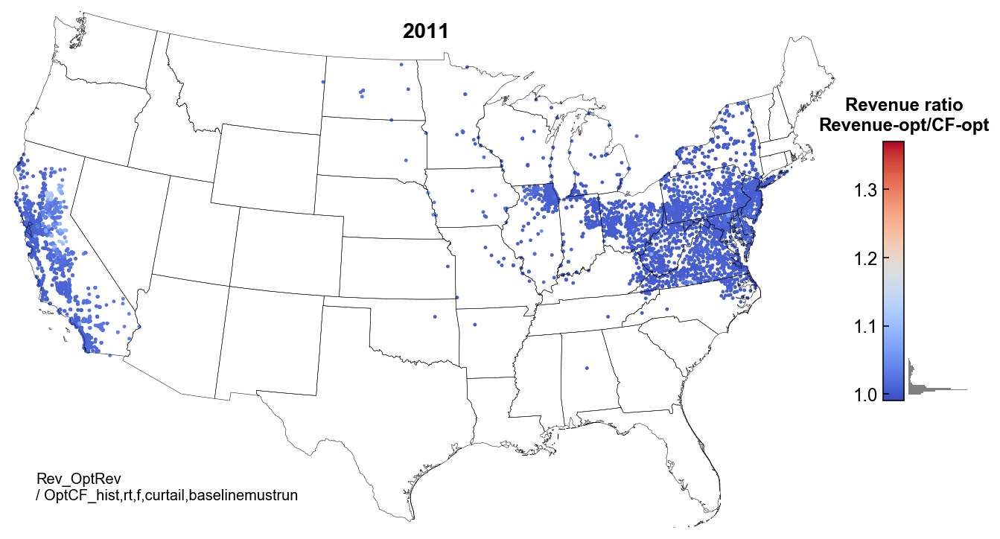

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


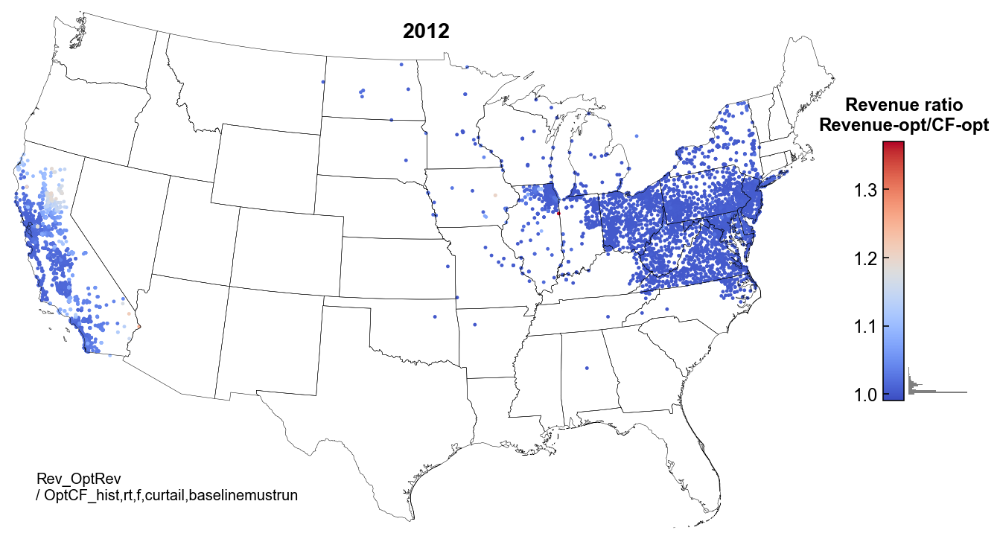

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


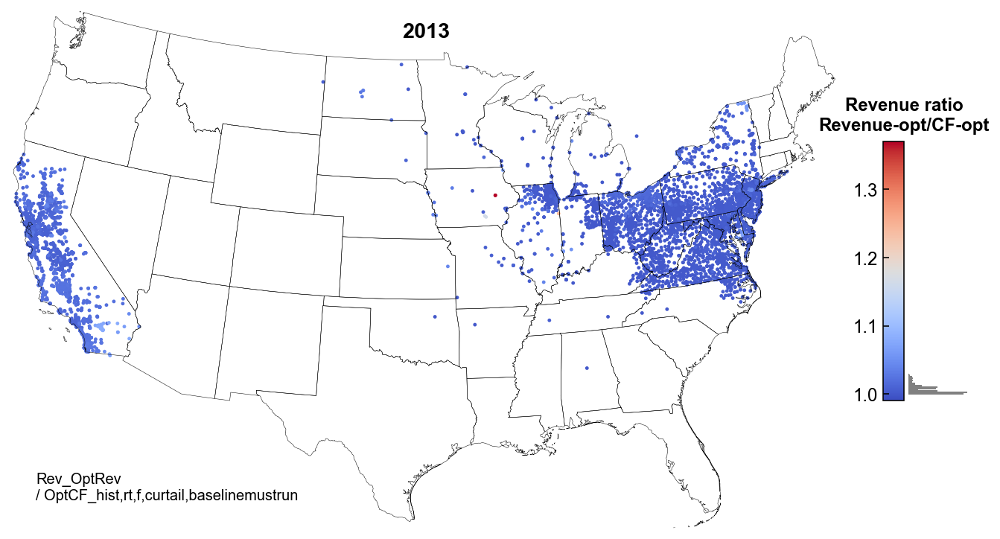

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


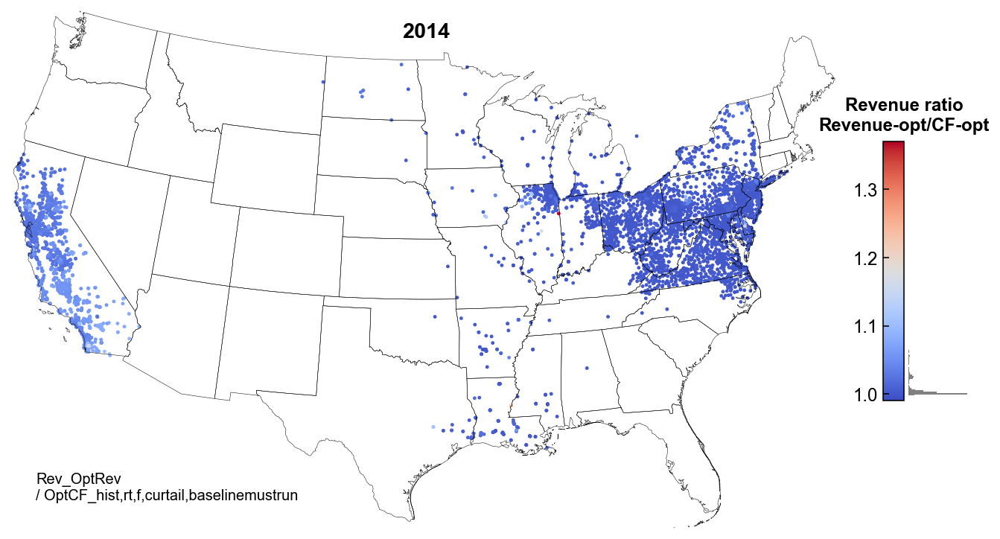

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


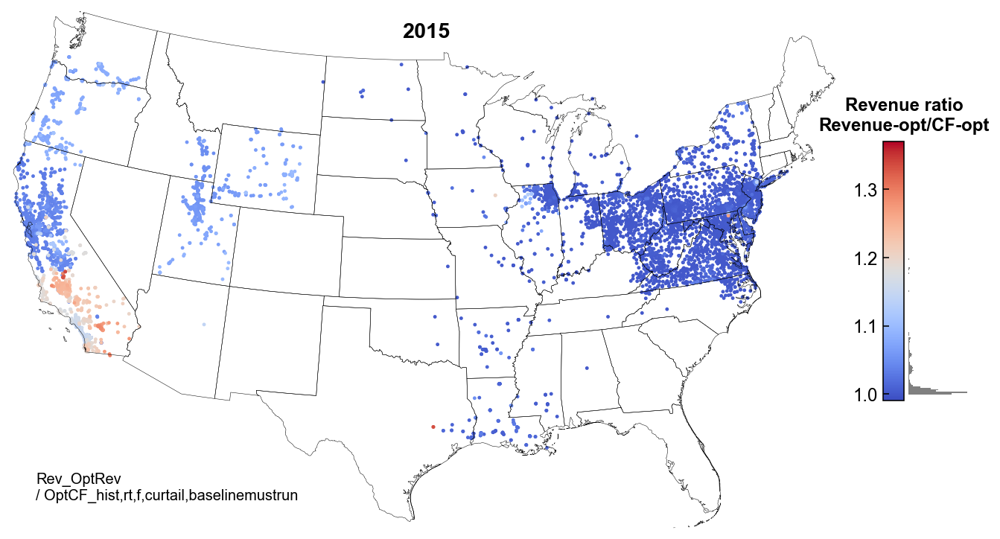

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


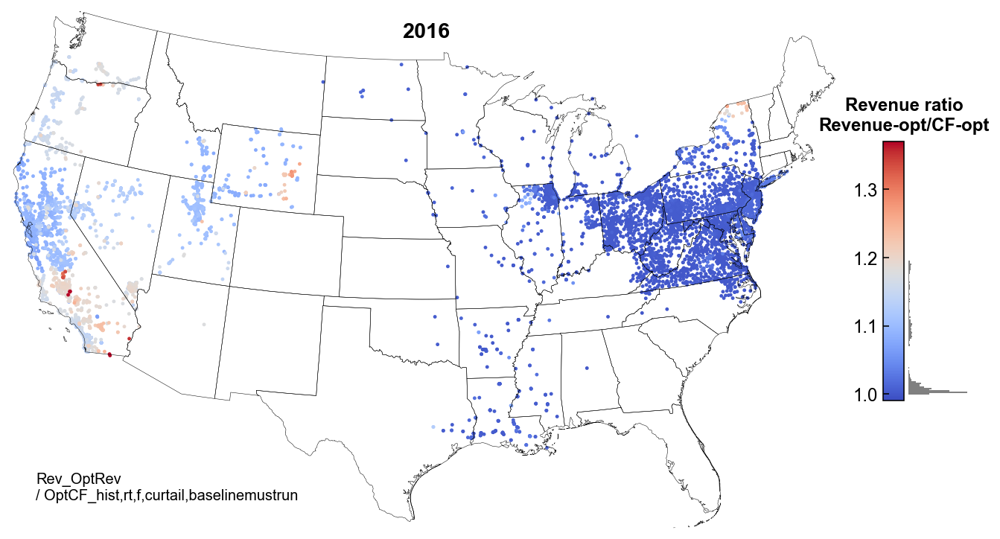

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:1125: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m_in.readshapefile(mappath, 'States', drawbounds=False)


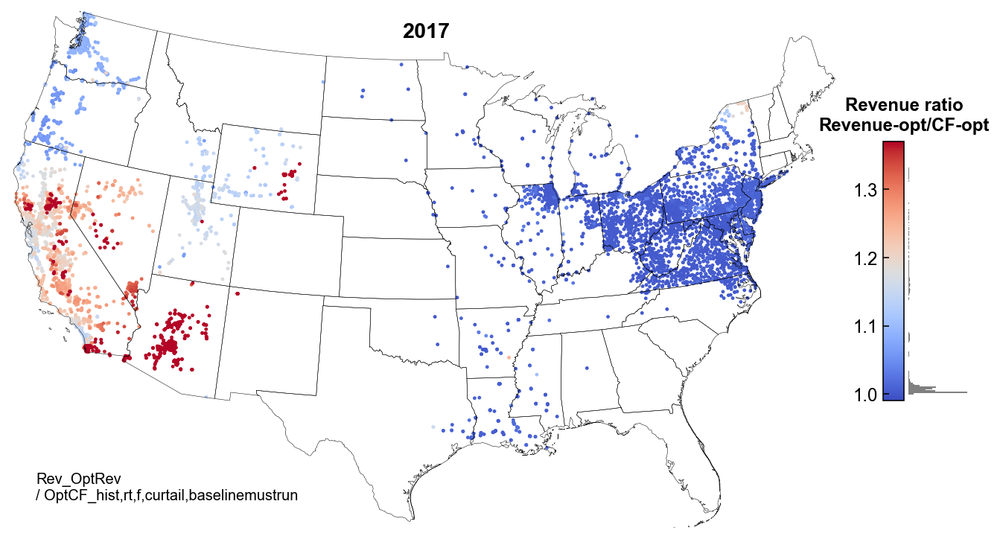

In [18]:
maplabel = {
    'OptRev_Azimuth(rt)(mustrun)': 'Azimuth [°]',
    'OptRev_Azimuth(rt)(curtail)': 'Azimuth [°]',
    'OptRev_Tilt(rt)(mustrun)': 'Tilt [°]',
    'OptRev_Tilt(rt)(curtail)': 'Tilt [°]',
    'Revenue_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun': 'Revenue ratio\ntrack/fixed',
    'Rev_curtail/Rev_mustrun(fixed)(rt)': 'Revenue ratio\ncurtail/must-run',
    'Rev_OptRev/OptCF_hist,rt,f,curtail,baselinemustrun': 'Revenue ratio\nRevenue-opt/CF-opt'
}

zrange = {
    'OptRev_Azimuth(rt)(mustrun)': [90,270],
    'OptRev_Tilt(rt)(mustrun)': [15,57],
    'OptRev_Azimuth(rt)(curtail)': [120,240],
    'OptRev_Tilt(rt)(curtail)': [15,47],
    'Revenue_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun': [1., 1.7],
    'Rev_curtail/Rev_mustrun(fixed)(rt)': [0.99,1.32],
    'Rev_OptRev/OptCF_hist,rt,f,curtail,baselinemustrun': [0.99,1.37],
}
zticks = {
    'OptRev_Azimuth(rt)(mustrun)': [90,135,180,225,270],
    'OptRev_Tilt(rt)(mustrun)': [20,30,40,50,],
    'OptRev_Azimuth(rt)(curtail)': [120,150,180,210,240],
    'OptRev_Tilt(rt)(curtail)': [15,25,35,45],
    'Revenue_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun': list(np.arange(1,1.71,0.1)),
    'Rev_curtail/Rev_mustrun(fixed)(rt)': [1.,1.1,1.2,1.3],
    'Rev_OptRev/OptCF_hist,rt,f,curtail,baselinemustrun': [1.,1.1,1.2,1.3]
}
cmap = plt.cm.coolwarm#{
#     'OptRev_Azimuth(rt)(mustrun)': plt.cm.coolwarm,
#     'Revenue_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun': plt.cm.coolwarm,
#     'Rev_curtail/Rev_mustrun(fixed)(rt)': plt.cm.coolwarm,
# }

data = [
#     'OptRev_Azimuth(rt)(mustrun)',
#     'OptRev_Tilt(rt)(mustrun)',
    'OptRev_Azimuth(rt)(curtail)',
    'OptRev_Tilt(rt)(curtail)',
    'Revenue_track(def)/fixed(optcf)_hist,rt,curtail,baselinemustrun',
    'Rev_curtail/Rev_mustrun(fixed)(rt)',
    'Rev_OptRev/OptCF_hist,rt,f,curtail,baselinemustrun',
]
for datum in data:
    print('{}\n{}\n{}'.format('#'*30,datum,'#'*30))
    for year in range(2010,2018):
        plt.close()
        f,ax = pvvm.plots.plotusascattermap(
            dfmap.loc[dfmap.yearlmp==year], datum,
            zrange=zrange[datum],
            # colorbartitle=maplabel[datum],
            colorbarhist=False,
            cmap=cmap,
        )
        cbar, chist = pvvm.plots.addcolorbarhist(
            f=f, ax0=ax, data=dfmap.loc[dfmap.yearlmp==year,datum],
            title=maplabel[datum], cmap=cmap,
            vmin=zrange[datum][0], vmax=zrange[datum][1]
        )
        cbar.yaxis.set_ticks(zticks[datum])

        ax.set_title(year, y=0.93, fontsize='x-large', weight='bold')
        ax.annotate(
            datum.replace('/','\n/ '), 
            xy=(0.03,0.05), xycoords='axes fraction',
            ha='left', va='bottom', fontsize='medium')

        plt.show()

## Impact of temporal output shaping as differences instead of ratios

### Curtailment

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]


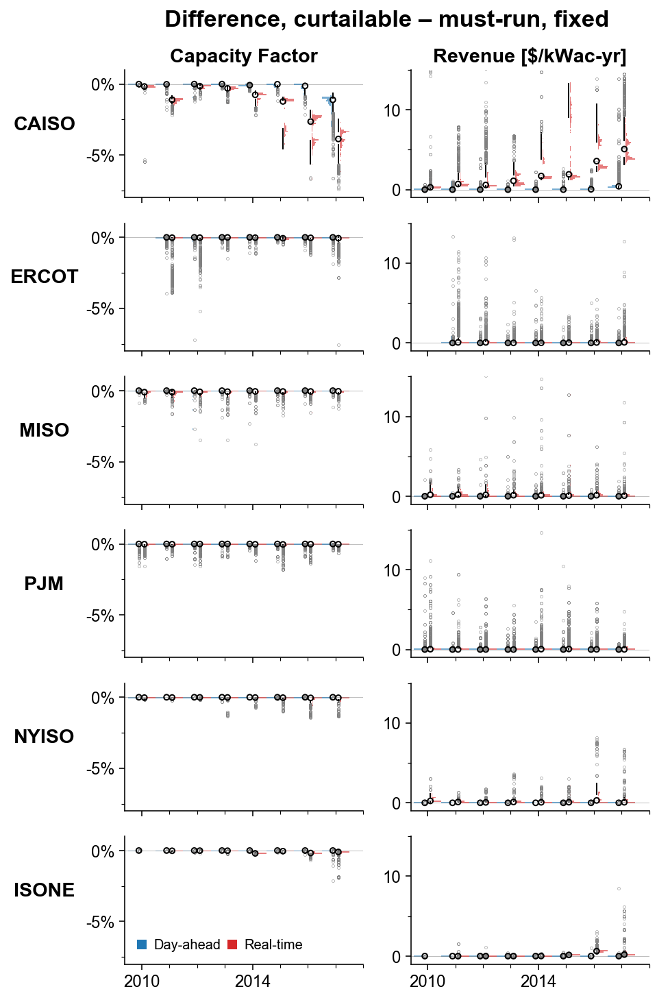

In [27]:
########## Starting absolute values for fixed CF-opt
### Data-indexed parameters
data = [
    'CF_curtail-CF_mustrun(fixed)(da)',
    'CF_curtail-CF_mustrun(fixed)(rt)',
    'Rev_curtail-Rev_mustrun(fixed)(da)',
    'Rev_curtail-Rev_mustrun(fixed)(rt)',
]
colindex = [0, 0, 1, 1]
colindex = dict(zip(data, colindex))
direction = ['left','right','left','right']
direction = dict(zip(data, direction))
color = [mc['da'],mc['rt'],mc['da'],mc['rt']]
color = dict(zip(data, color))
squeeze = [0.35, 0.35, 0.35, 0.35]
squeeze = dict(zip(data, squeeze))

### Column-indexed parameters
ncols = 2
ylim = [
    [-0.08, 0.01],
    [-1, 15],
]

ylabel = [
    'Capacity Factor',
    'Revenue [$/kWac-yr]',
]

note = [
    '',
    '',
]
y1 = 1     # 1.2 if using note
y2 = 1.04  # 1.07 if using note

gridspec_kw = {'width_ratios': [2, 2]}

### Plot it
plt.close()
f,ax = plt.subplots(6,ncols,sharex=True,sharey='col', gridspec_kw=gridspec_kw,
                    figsize=(sum(gridspec_kw['width_ratios'])*12/7, figheight), 
                   )
for row, iso in enumerate(isos):
    for datum in data:
        dfframe = (dfplot.loc[dfplot.ISOwecc==iso]
                   .pivot(index='ISO:Node',columns='yearlmp',values=datum))

        pvvm.plots.plotquarthist(
            ax=ax[(row,colindex[datum])], dfplot=dfframe, bootstrap=bootstrap, density=True,
            histcolor=color[datum], hist_range=ylim[colindex[datum]],
            direction=direction[datum], squeeze=squeeze[datum],
            quartpad=(-0.1 if direction[datum] == 'left' else 0.1),
            histpad=(-0.15 if direction[datum] == 'left' else 0.15),
#             format_axes=False,
        )

### Format axis
for row, iso in enumerate(isos):
    for col in range(ncols):
        ax[(row,0)].set_ylabel(iso, weight='bold', rotation=0, labelpad=30)
        ax[(row,col)].set_xlim(2009.4,2018)
        ### x ticks
        ax[(row,col)].set_xticks([2010,2014])
        ax[(row,col)].set_xticklabels(
            ['2010','2014'], rotation=0, ha='center')
        ax[(row,col)].xaxis.set_minor_locator(AutoMinorLocator(4))
        ### Add title
        ax[(0,col)].set_title(ylabel[col], weight='bold', y=y1, size='x-large')
        ### Add annotation
        ax[(0,col)].annotate(
            note[col], xy=(0.5,1.05), xycoords='axes fraction',
            ha='center', va='bottom', fontsize='large')

        ### Format axis
        ax[(row,col)].set_ylim(*ylim[col])
#         ax[(row,col)].yaxis.set_major_locator(MultipleLocator(0.1))
        ax[(row,col)].yaxis.set_minor_locator(AutoMinorLocator(2))
        ax[(row,col)].axhline(0, lw=0.25, c='0.5')

ax[(0,0)].yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1,decimals=0))
pvvm.plots.despine(ax)

### Legend
patches = [
    mpl.patches.Patch(
        facecolor=mc[market], edgecolor='none', 
        label=('Day-ahead' if market == 'da' else 'Real-time'))
    for market in ['da','rt']]
leg = ax[(-1,0)].legend(
    handles=patches, loc='lower left', frameon=False, ncol=2,
    columnspacing=0.5, handletextpad=0.5, handlelength=0.7,)

# # plt.tight_layout()
## add big axis, hide frame, ticks, and labels
f.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.title('Difference, curtailable – must-run, fixed', weight='bold', y=y2, fontsize='xx-large')

plt.show()

### Tracking

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]


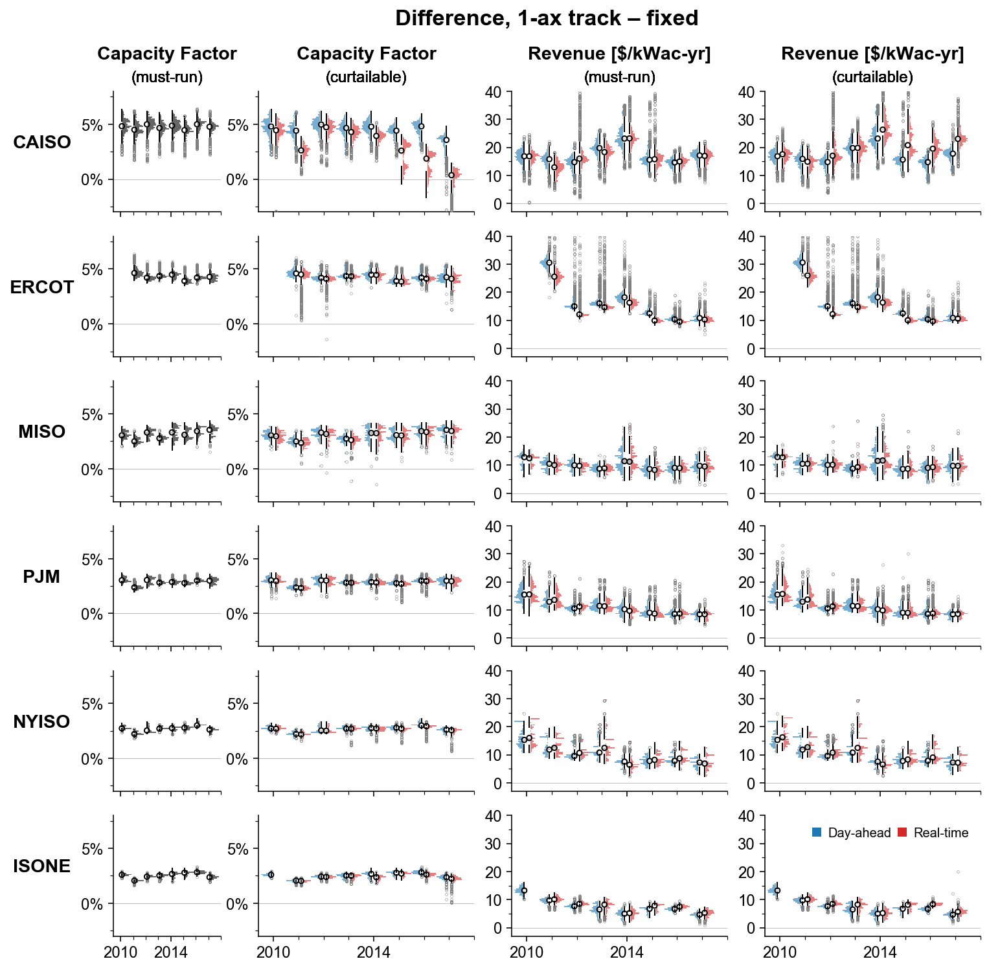

In [30]:
########## Starting absolute values for fixed CF-opt
### Data-indexed parameters
data = [
    'CapacityFactor_track(def)-fixed(optcf)_hist,da,mustrun',
    'CapacityFactor_track(def)-fixed(optcf)_hist,da,curtail,baselinemustrun',
    'CapacityFactor_track(def)-fixed(optcf)_hist,rt,curtail,baselinemustrun',
    'Revenue_track(def)-fixed(optcf)_hist,da,mustrun',
    'Revenue_track(def)-fixed(optcf)_hist,rt,mustrun',
    'Revenue_track(def)-fixed(optcf)_hist,da,curtail,baselinemustrun',
    'Revenue_track(def)-fixed(optcf)_hist,rt,curtail,baselinemustrun',
]
colindex = [0, 1, 1, 2, 2, 3, 3]
colindex = dict(zip(data, colindex))
direction = ['right','left','right','left','right','left','right']
direction = dict(zip(data, direction))
color = [mc['tmy'],mc['da'],mc['rt'],mc['da'],mc['rt'],mc['da'],mc['rt']]
color = dict(zip(data, color))
squeeze = [0.7, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35]
squeeze = dict(zip(data, squeeze))

### Column-indexed parameters
ncols = 4
ylim = [
    [-0.03,0.08],
    [-0.03,0.08],
    [-3,40],
    [-3,40],
]

ylabel = [
    'Capacity Factor',
    'Capacity Factor',
    'Revenue [$/kWac-yr]',
    'Revenue [$/kWac-yr]',
]

note = [
    '(must-run)',
    '(curtailable)',
    '(must-run)',
    '(curtailable)',
]
y1 = 1.2   # 1.2 if using note, 1 if not
y2 = 1.07  # 1.07 if using note, 1.05 if not

gridspec_kw = {'width_ratios': [1, 2, 2, 2]}

### Plot it
plt.close()
f,ax = plt.subplots(6,ncols,sharex=True,sharey='col', gridspec_kw=gridspec_kw,
                    figsize=(sum(gridspec_kw['width_ratios'])*12/7, figheight), 
                   )
for row, iso in enumerate(isos):
    for datum in data:
        dfframe = (dfplot.loc[dfplot.ISOwecc==iso]
                   .pivot(index='ISO:Node',columns='yearlmp',values=datum))

        pvvm.plots.plotquarthist(
            ax=ax[(row,colindex[datum])], dfplot=dfframe, bootstrap=bootstrap, density=True,
            histcolor=color[datum], hist_range=ylim[colindex[datum]],
            direction=direction[datum], squeeze=squeeze[datum],
            quartpad=(-0.1 if direction[datum] == 'left' else 0.1),
            histpad=(-0.15 if direction[datum] == 'left' else 0.15),
            # medianmarker='_', mediansize=10, medianfacecolor='k'
        )
#         ### NEW: Add revenue cutoff line
#         if datum.startswith('Revenue') and (',da,' in datum):
#             ax[(row,colindex[datum])].axhline(1.066, lw=0.25, ls=(0,(6,6)), c='0.5')

### Format axis
for row, iso in enumerate(isos):
    for col in range(ncols):
        ax[(row,0)].set_ylabel(iso, weight='bold', rotation=0, labelpad=30)
        ax[(row,col)].set_xlim(2009.4,2018)
        ### x ticks
        ax[(row,col)].set_xticks([2010,2014])
        ax[(row,col)].set_xticklabels(
            ['2010','2014'], rotation=0, ha='center')
        ax[(row,col)].xaxis.set_minor_locator(AutoMinorLocator(4))
        ### Add title
        ax[(0,col)].set_title(ylabel[col], weight='bold', y=y1, size='x-large')
        ### Add annotation
        ax[(0,col)].annotate(
            note[col], xy=(0.5,1.05), xycoords='axes fraction',
            ha='center', va='bottom', fontsize='large')

        ### Format axis
        ax[(row,col)].set_ylim(*ylim[col])
#         ax[(row,col)].yaxis.set_major_locator(MultipleLocator(0.2))
        ax[(row,col)].yaxis.set_minor_locator(AutoMinorLocator(2))
        ax[(row,col)].axhline(0, lw=0.25, c='0.5')

ax[(0,0)].yaxis.set_major_locator(MultipleLocator(0.05))
ax[(0,1)].yaxis.set_major_locator(MultipleLocator(0.05))
ax[(0,2)].yaxis.set_major_locator(MultipleLocator(10))
ax[(0,3)].yaxis.set_major_locator(MultipleLocator(10))
ax[(0,0)].yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1,decimals=0,))
ax[(0,1)].yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1,decimals=0,))

pvvm.plots.despine(ax)

### Legend
patches = [
    mpl.patches.Patch(
        facecolor=mc[market], edgecolor='none', 
        label=('Day-ahead' if market == 'da' else 'Real-time'))
    for market in ['da','rt']]
leg = ax[(-1,-1)].legend(
    handles=patches, loc='upper right', frameon=False, ncol=2,
    columnspacing=0.5, handletextpad=0.5, handlelength=0.7,)

# # plt.tight_layout()
## add big axis, hide frame, ticks, and labels
f.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.title('Difference, 1-ax track – fixed', weight='bold', y=y2, fontsize='xx-large')

plt.show()

### Orientation optimization, fixed-tilt

/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]
/Users/patrickbrown/Dropbox/MITEI/Projects/REValueMap/Package/pvvm/plots.py:490: RuntimeWarning: invalid value encountered in true_divide
  for i in range(len(binned_data_sets))]


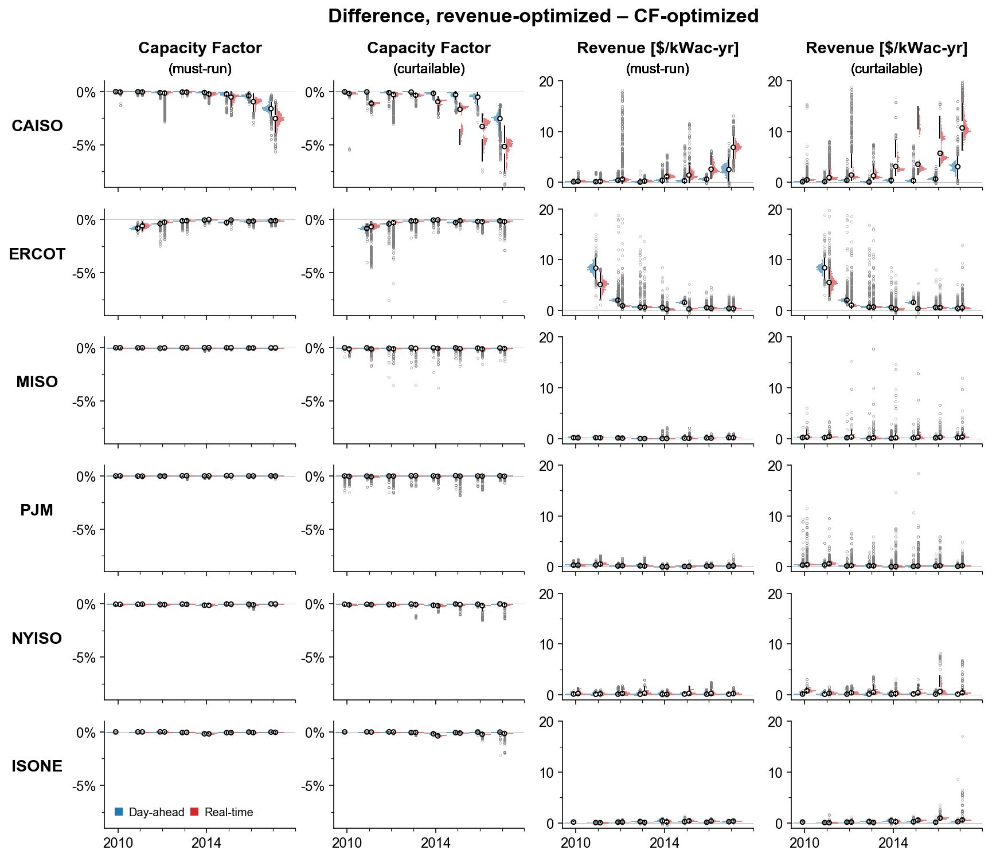

In [35]:
########## Baseline = mustrun
### Data-indexed parameters
data = [
    'CF_OptRev-OptCF_hist,da,f,mustrun',
    'CF_OptRev-OptCF_hist,rt,f,mustrun',
    'CF_OptRev-OptCF_hist,da,f,curtail,baselinemustrun',
    'CF_OptRev-OptCF_hist,rt,f,curtail,baselinemustrun',
    'Rev_OptRev-OptCF_hist,da,f,mustrun',
    'Rev_OptRev-OptCF_hist,rt,f,mustrun',
    'Rev_OptRev-OptCF_hist,da,f,curtail,baselinemustrun',
    'Rev_OptRev-OptCF_hist,rt,f,curtail,baselinemustrun',
]
colindex = [0, 0, 1, 1, 2, 2, 3, 3,]
colindex = dict(zip(data, colindex))
direction = ['left','right','left','right',
             'left','right','left','right',]
direction = dict(zip(data, direction))
color = [mc['da'],mc['rt'],mc['da'],mc['rt'],
         mc['da'],mc['rt'],mc['da'],mc['rt'],]
color = dict(zip(data, color))
squeeze = [0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35,]
squeeze = dict(zip(data, squeeze))
plotcols = [slice(None),slice(None),slice(None),slice(None),
            slice(None),slice(None),slice(None),slice(None),]
plotcols = dict(zip(data, plotcols))

### Column-indexed parameters
ylim = [
    [-0.09, 0.01],
    [-0.09, 0.01],
    [-1,20],
    [-1,20],
]
xlim = [
    [2009.4, 2018],
    [2009.4, 2018],
    [2009.4, 2018],
    [2009.4, 2018],
]

majlocs = [0.05, 0.05, 10, 10]
minlocs = [2, 2, 2, 2,]

ylabel = [
    'Capacity Factor',
    'Capacity Factor',
    'Revenue [$/kWac-yr]',
    'Revenue [$/kWac-yr]',
]

note = [
    '(must-run)',
    '(curtailable)',
    '(must-run)',
    '(curtailable)',
]
y1 = 1.2     # 1.2 if using note,  1 if no note
y2 = 1.07  # 1.07 if using note, 1.04 if no note

gridspec_kw = {'width_ratios': [2, 2, 2, 2,]}#, 'wspace':0.4}
ncols = len(gridspec_kw['width_ratios'])

### Plot it
plt.close()
f,ax = plt.subplots(6,ncols,sharex='col',sharey='col', gridspec_kw=gridspec_kw,
                    figsize=(sum(gridspec_kw['width_ratios'])*12/7, figheight), 
                   )
for row, iso in enumerate(isos):
    for datum in data:
        dfframe = (dfplot.loc[dfplot.ISOwecc==iso]
                   .pivot(index='ISO:Node',columns='yearlmp',values=datum))

        pvvm.plots.plotquarthist(
            ax=ax[(row,colindex[datum])], dfplot=dfframe[plotcols[datum]], 
            density=True, bootstrap=bootstrap, 
            histcolor=color[datum], hist_range=ylim[colindex[datum]],
            direction=direction[datum], squeeze=squeeze[datum],
            quartpad=(-0.1 if direction[datum] == 'left' else 0.1),
            histpad=(-0.15 if direction[datum] == 'left' else 0.15),
            format_axes=False,
        )

### Format axis
for row, iso in enumerate(isos):
    for col in range(ncols):
        ax[(row,0)].set_ylabel(iso, weight='bold', rotation=0, labelpad=30)
        ### x ticks
        ax[(row,col)].set_xticks([2010,2014])
        ax[(row,col)].set_xticklabels(
            ['2010','2014'], rotation=0, ha='center')
        ax[(row,col)].xaxis.set_minor_locator(AutoMinorLocator(4))
        ax[(row,col)].set_xlim(*xlim[col])
        ### Add title
        ax[(0,col)].set_title(ylabel[col], weight='bold', y=y1, size='x-large')
        ### Add annotation
        ax[(0,col)].annotate(
            note[col], xy=(0.5,1.05), xycoords='axes fraction',
            ha='center', va='bottom', fontsize='large')

        ### Format axis
        ax[(row,col)].set_ylim(*ylim[col])
#         ax[(row,col)].yaxis.set_major_locator(MultipleLocator(majlocs[col]))
        ax[(row,col)].yaxis.set_minor_locator(AutoMinorLocator(minlocs[col]))
        ax[(row,col)].axhline(0, lw=0.25, c='0.5')

ax[(0,0)].yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1,decimals=0))
ax[(0,1)].yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1,decimals=0))
    
pvvm.plots.despine(ax)

### Legend
patches = [
    mpl.patches.Patch(
        facecolor=mc[market], edgecolor='none', 
        label=('Day-ahead' if market == 'da' else 'Real-time'))
    for market in ['da','rt']]
leg = ax[(-1,0)].legend(
    handles=patches, loc='lower left', frameon=False, ncol=2,
    columnspacing=0.5, handletextpad=0.5, handlelength=0.7,)

# plt.tight_layout()
## add big axis, hide frame, ticks, and labels
f.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.title('Difference, revenue-optimized – CF-optimized', weight='bold', y=y2, fontsize='xx-large')

plt.show()